# **PSYC 430 Final Project - Simulating The Hippocampus**



Run this first

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
from keras.datasets import fashion_mnist
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Dense, Input, Flatten, ReLU, Activation, Reshape
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, SGD
from keras import regularizers
import numpy as np
import random

Load in the Fashion MNIST data set, and split the data into a training and test set.

In [ ]:
from tensorflow.keras.datasets import fashion_mnist as fmnist # Import Fashion MNIST dataset
(x_train, y_train), (x_test, y_test) = fmnist.load_data() # 60,000 -> training; 10,000 -> test
x_train = x_train/255.0 # Normalize data to be between 0 - 1 (image data usually between 0 - 255)
x_test = x_test/255.0

4422102/4422102 [==============================] - 0s 0us/step


The data is made up of images of clothing. Here are some examples.

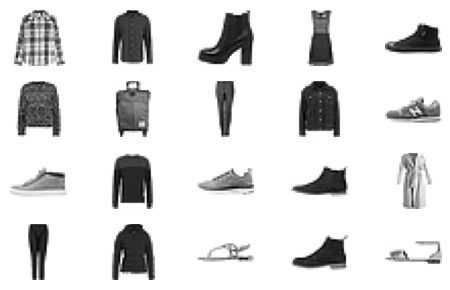

In [ ]:
# Generate grid of images from a subet of a larger dataset
subset = x_train[np.random.randint(0, 10000, 20)]
fig, axs = plt.subplots(4, 5, figsize=(5,3))
for j, ax in enumerate(axs.flatten()):
    ax.imshow(subset[j], cmap="gray_r")
    ax.axis("off")
plt.tight_layout()
plt.show()

## Taking a Subset of the Fashion MNIST Dataset

We won't be using the entire dataset. Instead, we will be taking a subset of 4,000 stimuli, and varying the frequency by which they appear in order to understand the correlation between neuronal sparseness and image frequency. So,

* 1 stimulus will be repeated 1,000 times
* 10 stimuli will be repeated 100 times
* 100 stimuli will be repeated 10 times
* 1,000 stimuli will be repeated once

In [ ]:
image_id = list(np.random.randint(0, 10000, 1111))

image_list = [image_id[0]] * 1000 + image_id[1:11] * 100 + image_id[11:111] * 10 + image_id[111:1111] * 1
random.shuffle(image_list)

freq_train = x_train[np.array(image_list)]

## **Creating the Autoencoder**

The encoder represents the input coming into the medial temporal lobe from the temporal cortex, the entorhinal cortex, the DG, and the CA3. The decoder represents the information that was compressed from the encoder coming into the CA1, then back to the entorhinal cortex, and eventually is sent to the temporal cortex for further processing.

In [ ]:
encoder = Sequential([
    Flatten(input_shape = (28, 28)), # Sensory neurons convert raw data into something processable by the brain
    Dense(784), # Temporal Cortex
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(384), # Dentate Gyrus
    ReLU(),
    Dense(256), # CA3
    ReLU(),
])
decoder = Sequential([
    Dense(384, input_shape = (256,)), # CA1
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(784), # Temporal Cortex
    Activation("sigmoid"),
    Reshape((28, 28))
])
img = Input(shape = (28, 28))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile("adam", loss = "mean_squared_error")

1/1 [==============================] - 0s 25ms/step


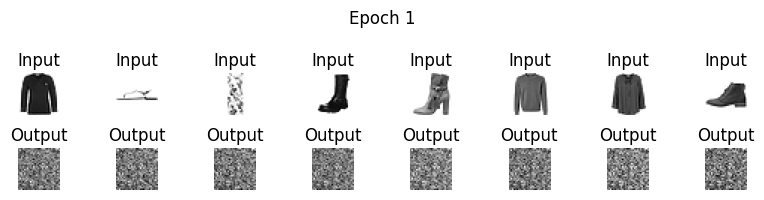

1/1 [==============================] - 0s 21ms/step


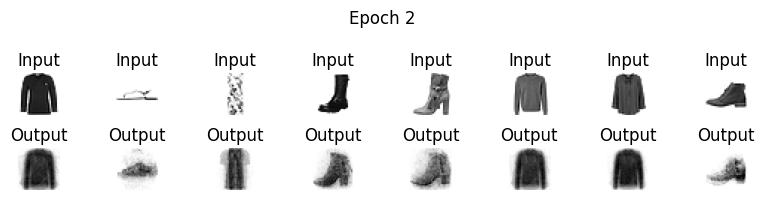

1/1 [==============================] - 0s 30ms/step


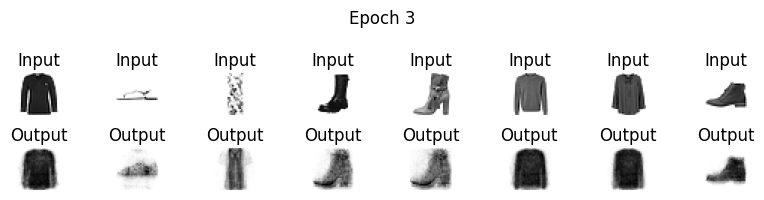

1/1 [==============================] - 0s 33ms/step


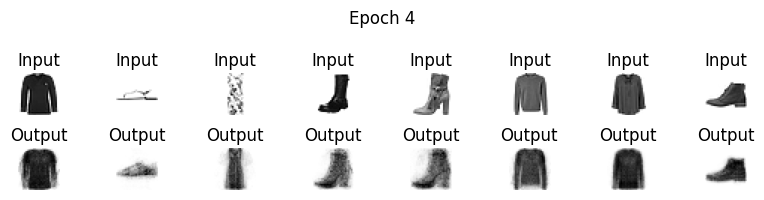

1/1 [==============================] - 0s 21ms/step


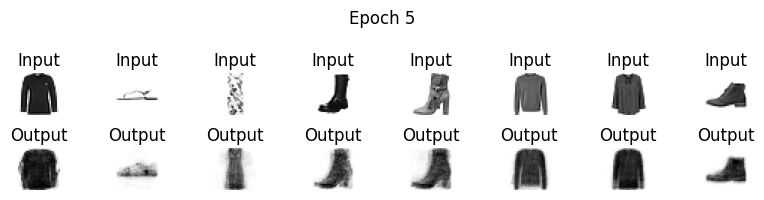

1/1 [==============================] - 0s 28ms/step


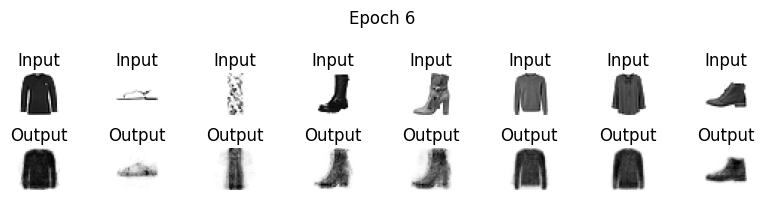

1/1 [==============================] - 0s 21ms/step


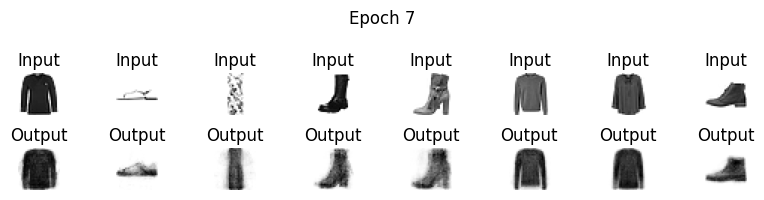

1/1 [==============================] - 0s 23ms/step


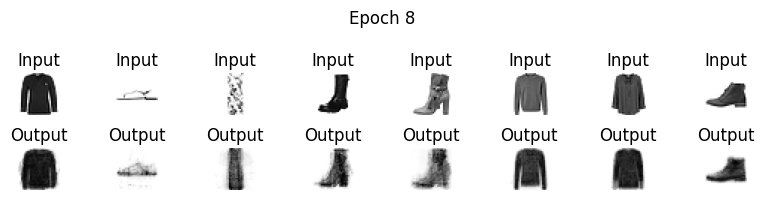

1/1 [==============================] - 0s 22ms/step


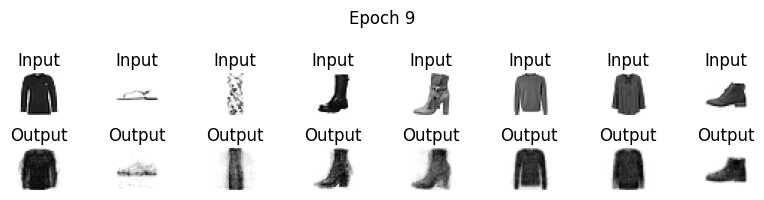

1/1 [==============================] - 0s 25ms/step


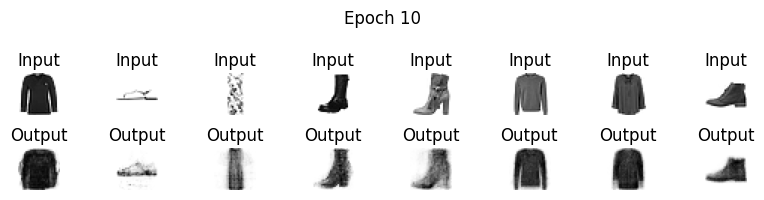

In [ ]:
EPOCHS = 10
EXAMPLES = 8

# Pick a number of random images
rand = x_test[np.random.randint(0, 10000, EXAMPLES)].reshape((EXAMPLES, 1, 28, 28))

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(2, EXAMPLES, figsize=(EXAMPLES, 2))

    for j in range(EXAMPLES):
        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")
        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()
    model.fit(freq_train, freq_train, verbose=0)

## **Convolutional Autoencoder**

We can use convlutional layers, as well as max pooling and up sampling to better understand the most prominent features from each image.

As we see, there is a bias towards the shape of the object/item rather than its characteristics. In other words, there is a prioritization of getting the overall gist of the image rather than any specific details within the object.

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D

# Encoder
encoder = Sequential([
    Input(shape=(28, 28, 1)), # Input layer
    Conv2D(256, (3, 3), activation='relu', padding='same'), # Temporal Cortex
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(128, (3, 3), activation='relu', padding='same'), # Entorhinal Cortex
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding='same'), # Dentate Gyrus
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(32, (3, 3), activation='relu', padding='same'), # CA3
])

# Decoder
decoder = Sequential([
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(4,4,32)), # CA1
    UpSampling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu', padding='same'), # Entorhinal Cortex
    UpSampling2D((2, 2)),
    Conv2D(256, (3, 3), activation='relu'), # Temporal Cortex
    UpSampling2D((2, 2)),
    Conv2D(1, (3, 3), activation='sigmoid', padding='same'),
])

img = Input(shape = (28, 28, 1))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile("adam", loss = "mean_squared_error")


1/1 [==============================] - 0s 30ms/step


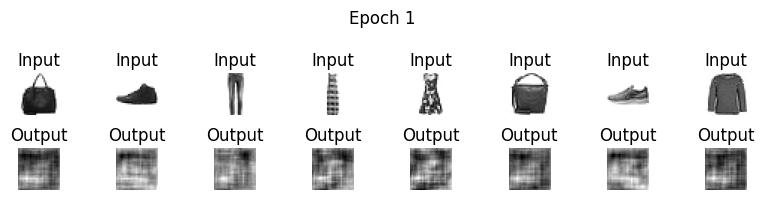

1/1 [==============================] - 0s 28ms/step


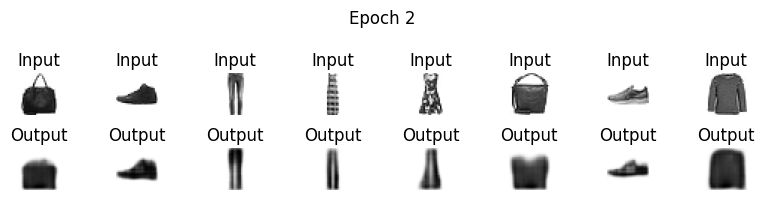

1/1 [==============================] - 0s 27ms/step


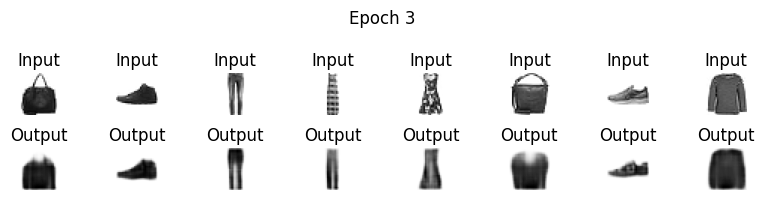

1/1 [==============================] - 0s 26ms/step


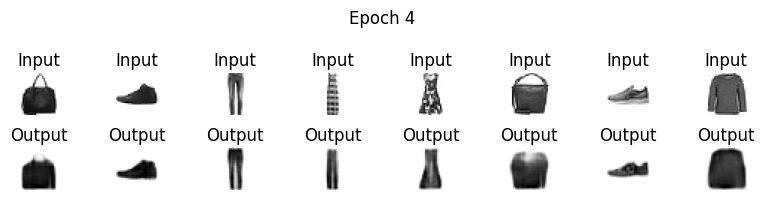

1/1 [==============================] - 0s 55ms/step


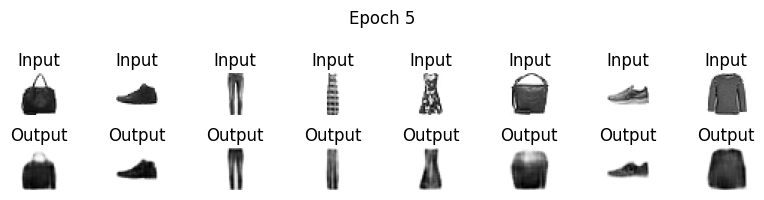

1/1 [==============================] - 0s 30ms/step


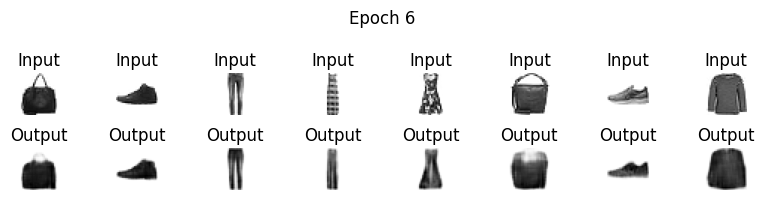

1/1 [==============================] - 0s 27ms/step


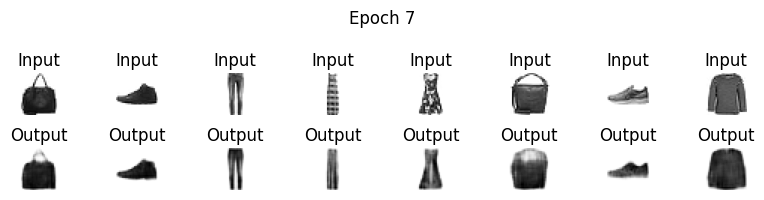

1/1 [==============================] - 0s 40ms/step


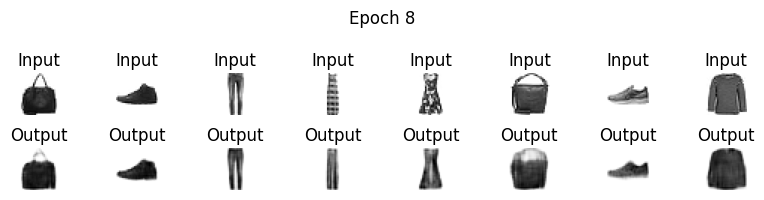

1/1 [==============================] - 0s 31ms/step


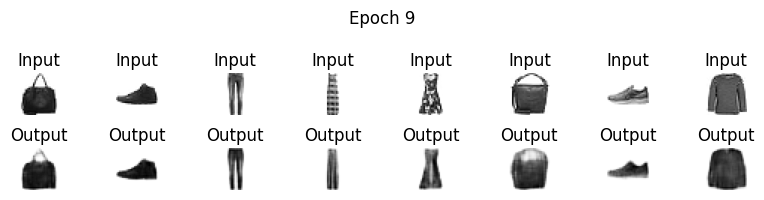

1/1 [==============================] - 0s 43ms/step


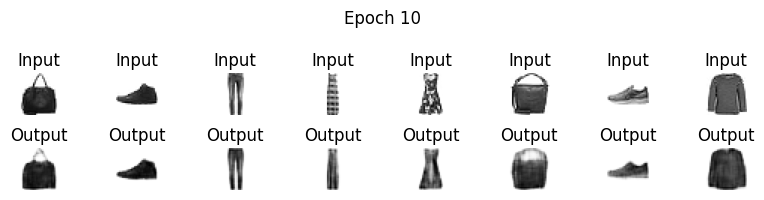

In [ ]:
EPOCHS = 10
EXAMPLES = 8

# Pick a number of random images
rand = x_test[np.random.randint(0, 10000, EXAMPLES)].reshape((EXAMPLES, 1, 28, 28))

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(2, EXAMPLES, figsize=(EXAMPLES, 2))

    for j in range(EXAMPLES):
        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")
        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()
    model.fit(freq_train, freq_train, verbose=0)

## **Introducing Sparseness**

We will use Lasso regression (L1 norm) regularization to encourage sparseness

In [ ]:
from tensorflow.keras.layers import Layer
import tensorflow as tf

class Hippocampus(Activation):
  """Sparse hippocampus, includes an L1 penalty"""
  def __init__(self, l1 = 0.00001):
    super().__init__(activation='linear')
    self.l1 = l1

  def call(self, inputs):
    ysum = tf.math.reduce_sum(tf.math.abs(inputs))
    self.add_loss(ysum * self.l1)
    return inputs

In [ ]:
encoder = Sequential([
    Flatten(input_shape = (28, 28)), # Sensory neurons convert raw data into something processable by the brain
    Dense(784), # Temporal Cortex
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(384), # Dentate Gyrus
    ReLU(),
    Dense(256), # CA3
    ReLU(),
    Hippocampus() # Apply L1 penalty to the activations of the neurons; Encourages processing of most important features
])
decoder = Sequential([
    Dense(384, input_shape = (256,)), # CA1
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(784), # Temporal Cortex
    Activation("sigmoid"),
    Reshape((28, 28))
])
img = Input(shape = (28, 28))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile(optimizer=Adam(), loss = "mean_squared_error")

1/1 [==============================] - 0s 27ms/step


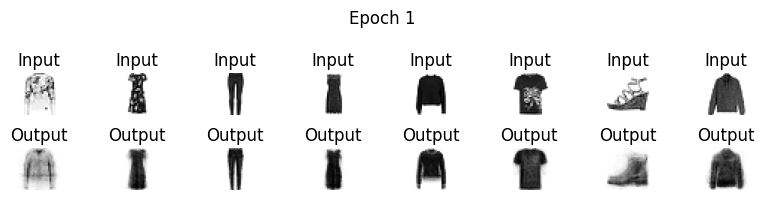

1/1 [==============================] - 0s 35ms/step


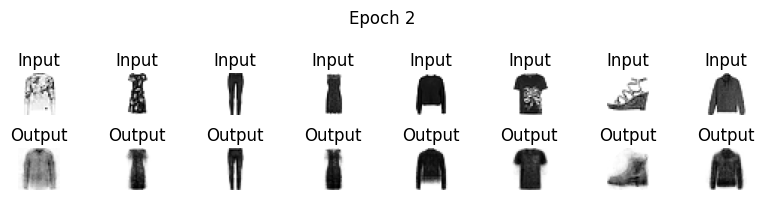

1/1 [==============================] - 0s 23ms/step


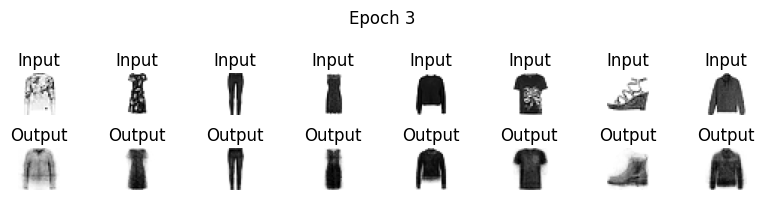

1/1 [==============================] - 0s 24ms/step


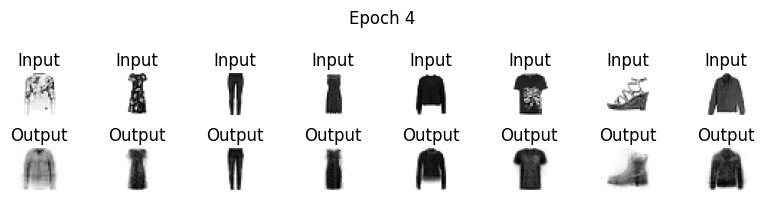

1/1 [==============================] - 0s 23ms/step


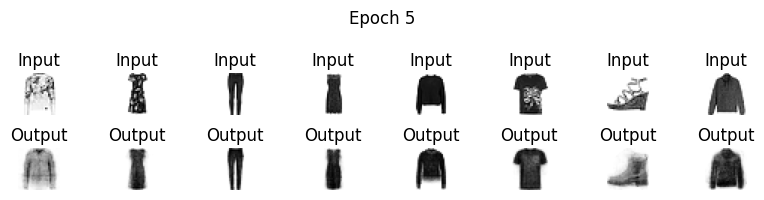

1/1 [==============================] - 0s 23ms/step


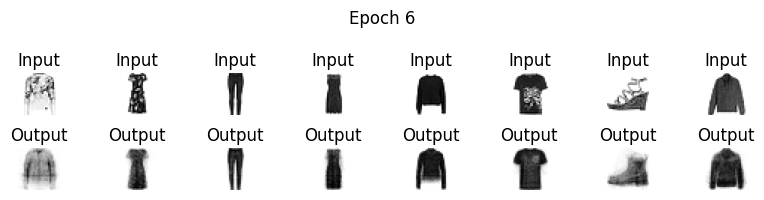

1/1 [==============================] - 0s 26ms/step


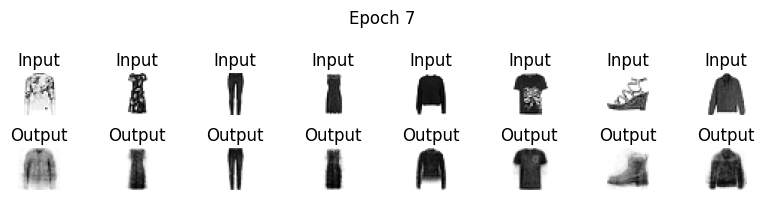

1/1 [==============================] - 0s 24ms/step


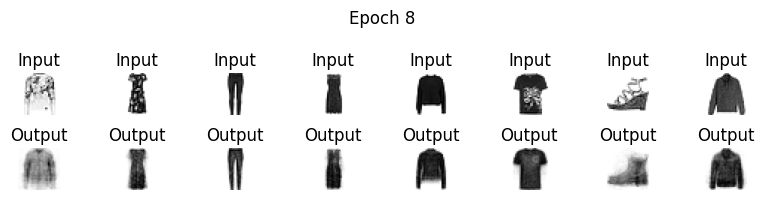

1/1 [==============================] - 0s 21ms/step


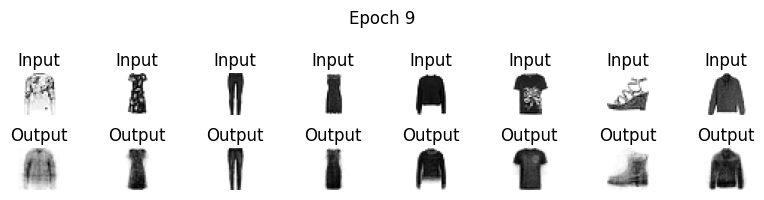

1/1 [==============================] - 0s 24ms/step


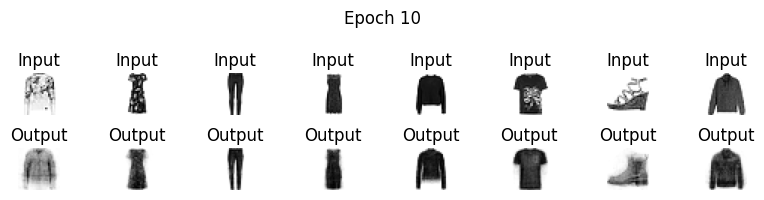

In [ ]:
EPOCHS = 10
EXAMPLES = 8

# Pick a number of random images
rand = x_test[np.random.randint(0, 10000, EXAMPLES)].reshape((EXAMPLES, 1, 28, 28))

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(2, EXAMPLES, figsize=(EXAMPLES, 2))

    for j in range(EXAMPLES):
        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")
        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()
    model.fit(freq_train, freq_train, verbose=0)

## **What Is Lost?**

We can see the exact details the neural network failed to reproduce.

1/1 [==============================] - 0s 47ms/step


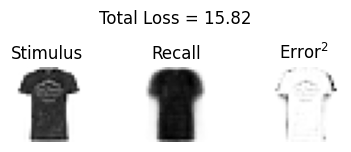

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(4, 1.5))
err_test = x_test[np.random.randint(0, 10000, 1)]
axs[0].imshow(err_test.reshape((28, 28)), cmap="gray_r")
axs[0].set_title("Stimulus")
axs[0].axis('off')

# Intermediate representation in the hippocampus
latent = encoder.predict(err_test)
output = decoder.predict(latent)

axs[1].imshow(output.reshape((28, 28)), cmap="gray_r")
axs[1].set_title("Recall")
axs[1].axis('off')

err_img = (err_test - output)**2
loss_val = np.sum(err_img)

axs[2].imshow(err_img.reshape((28, 28)), cmap="gray_r")
axs[2].set_title("Error$^2$")
axs[2].axis('off')

fig.suptitle("Total Loss = %.2f" % (loss_val,))
fig.tight_layout()
plt.show()

## **Taking Into Account Stimulus Frequency**

Now, we will account for the frequency of each image as it goes through training after each epoch.

What we will see is a tendency for the model to generalize the lower frequency images and prioritize getting the overall gist of the image rather than grabbing any details.

1/1 [==============================] - 0s 94ms/step


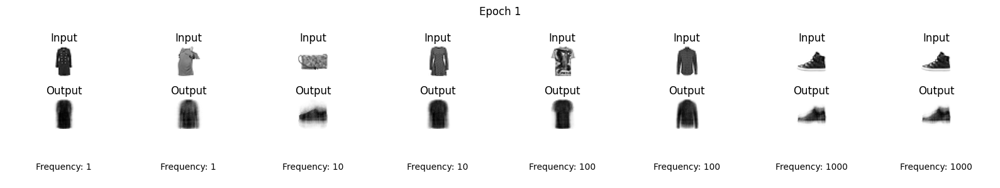

1/1 [==============================] - 0s 28ms/step


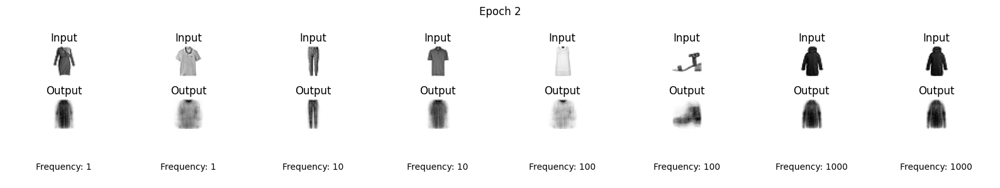

1/1 [==============================] - 0s 38ms/step


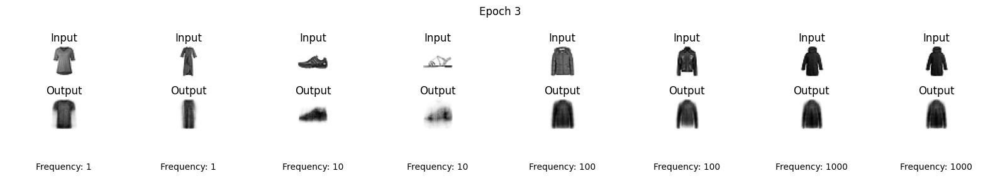

1/1 [==============================] - 0s 26ms/step


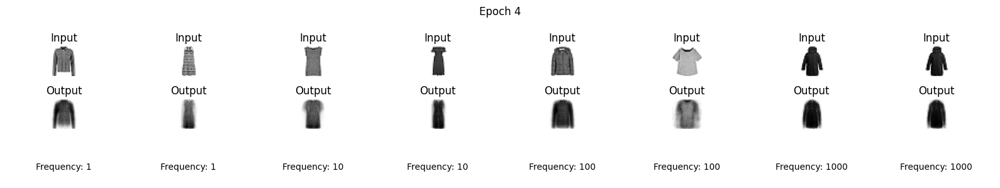

1/1 [==============================] - 0s 22ms/step


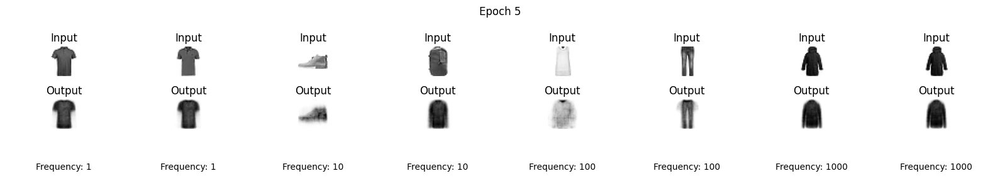

1/1 [==============================] - 0s 33ms/step


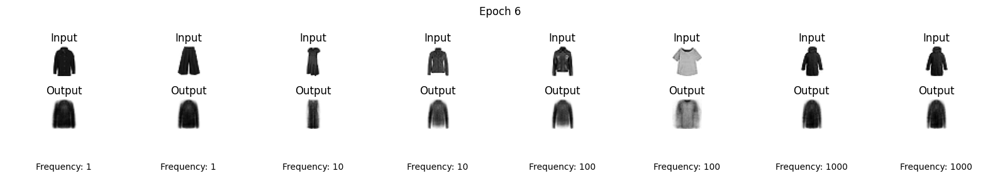

1/1 [==============================] - 0s 25ms/step


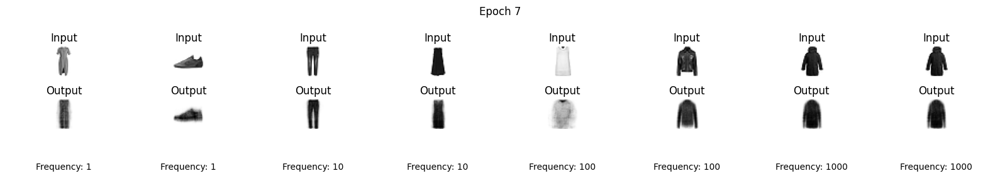

1/1 [==============================] - 0s 23ms/step


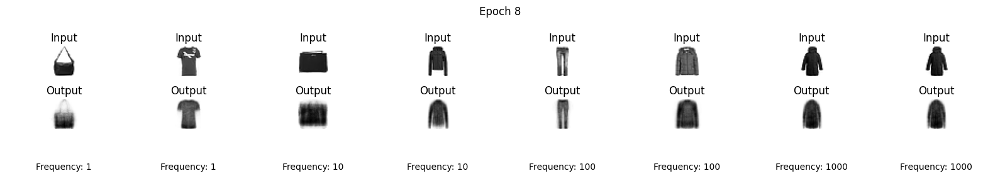

1/1 [==============================] - 0s 26ms/step


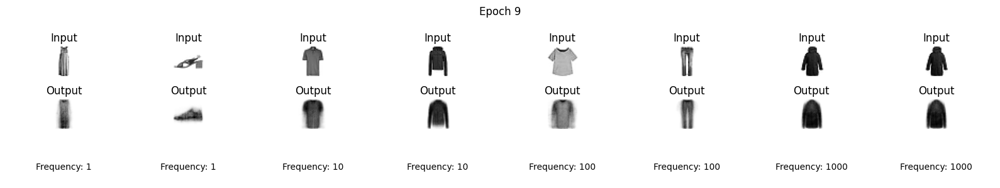

1/1 [==============================] - 0s 31ms/step


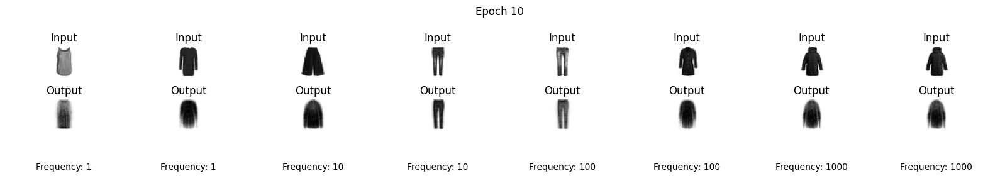

1/1 [==============================] - 0s 30ms/step


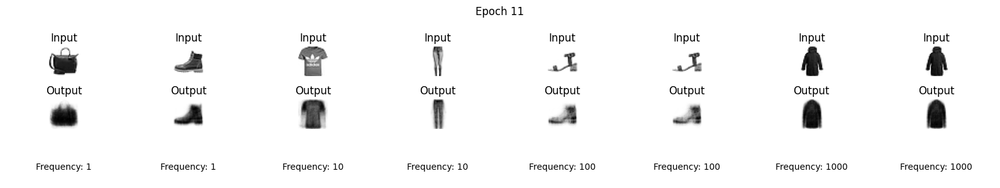

1/1 [==============================] - 0s 32ms/step


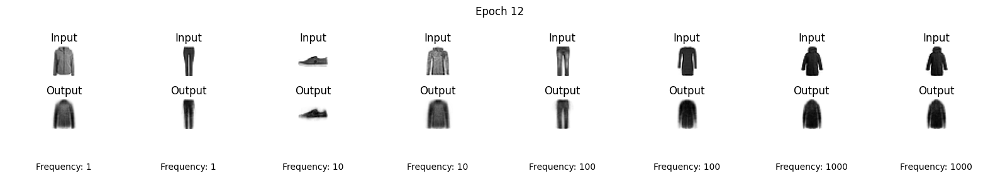

1/1 [==============================] - 0s 37ms/step


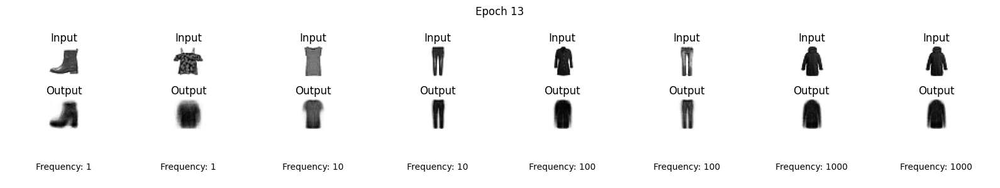

1/1 [==============================] - 0s 26ms/step


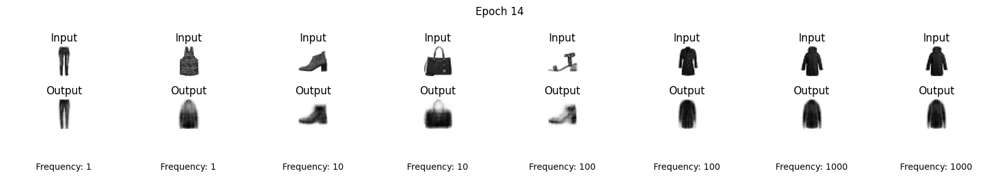

1/1 [==============================] - 0s 23ms/step


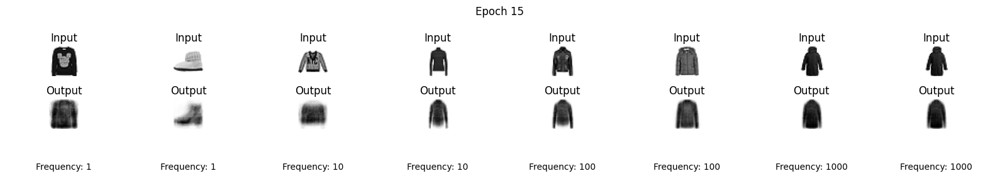

1/1 [==============================] - 0s 22ms/step


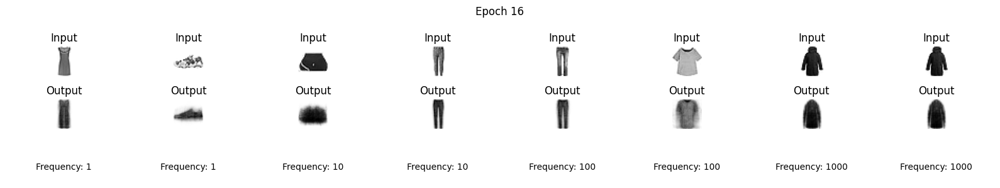

1/1 [==============================] - 0s 43ms/step


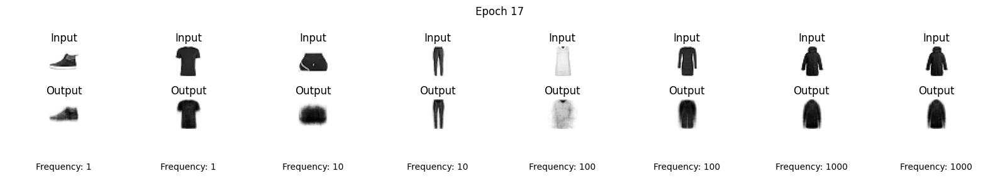

1/1 [==============================] - 0s 22ms/step


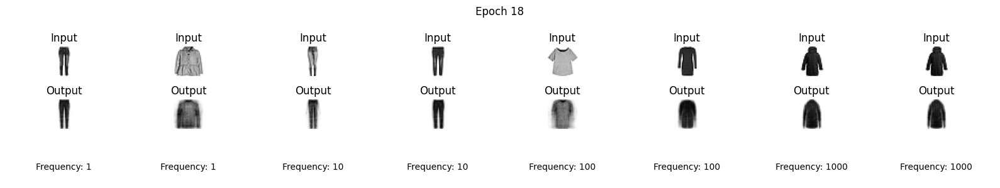

1/1 [==============================] - 0s 23ms/step


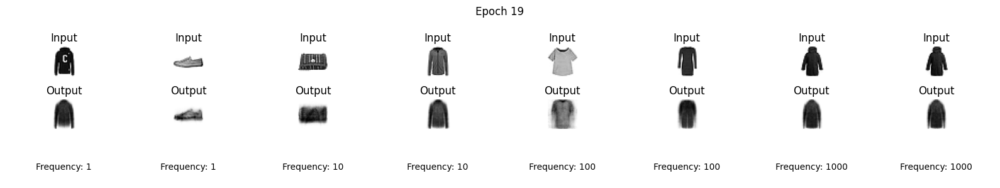

1/1 [==============================] - 0s 36ms/step


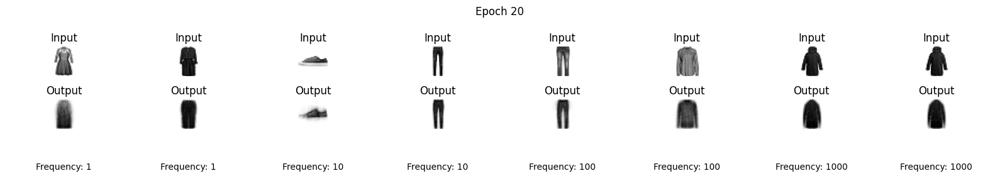

1/1 [==============================] - 0s 24ms/step


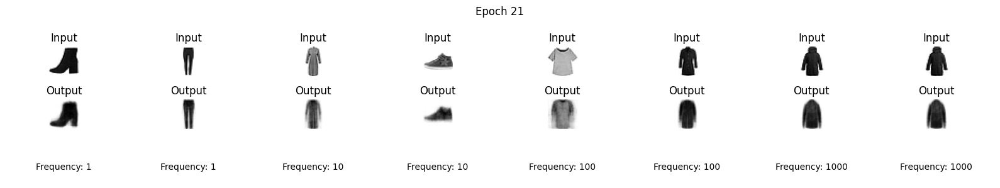

1/1 [==============================] - 0s 24ms/step


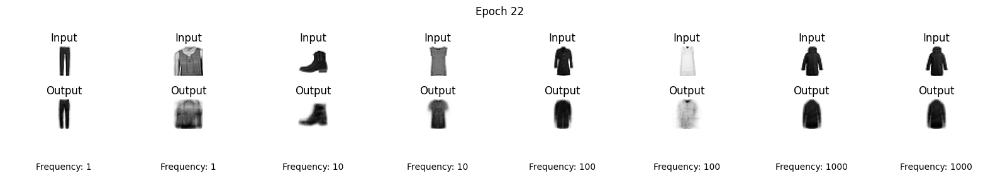

1/1 [==============================] - 0s 48ms/step


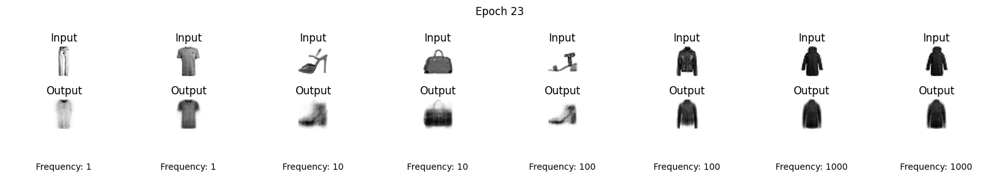

1/1 [==============================] - 0s 25ms/step


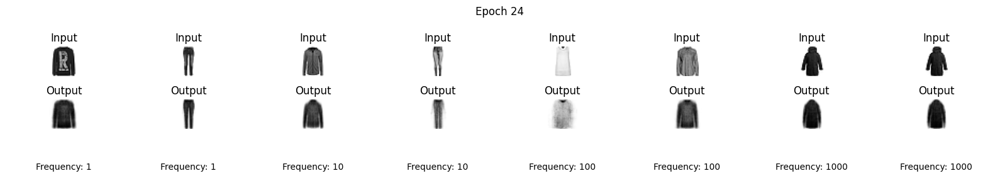

1/1 [==============================] - 0s 29ms/step


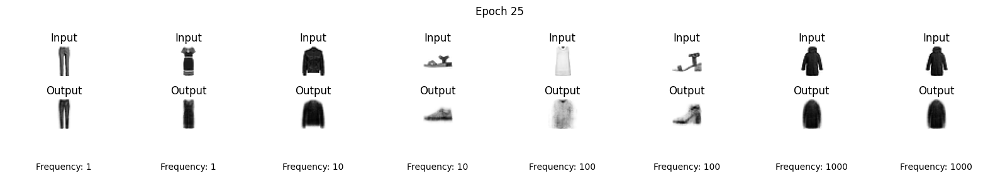

1/1 [==============================] - 0s 22ms/step


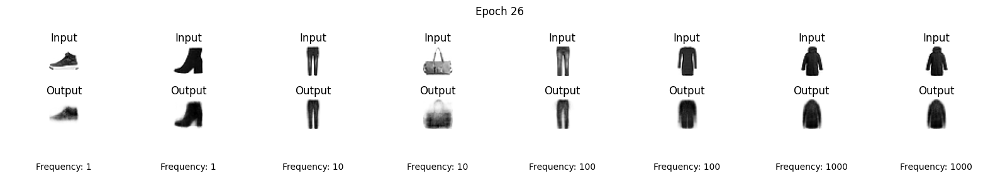

1/1 [==============================] - 0s 27ms/step


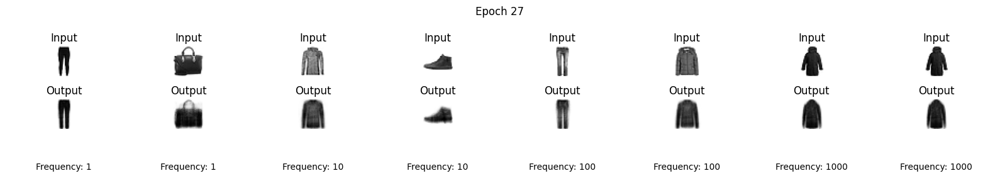

1/1 [==============================] - 0s 24ms/step


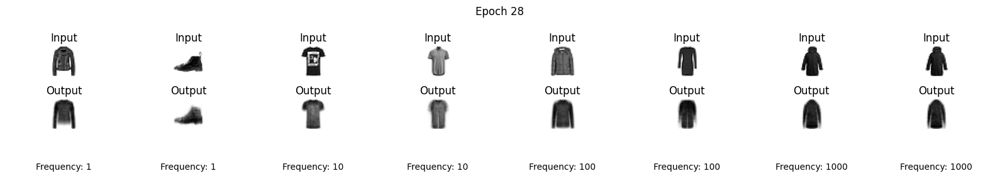

1/1 [==============================] - 0s 26ms/step


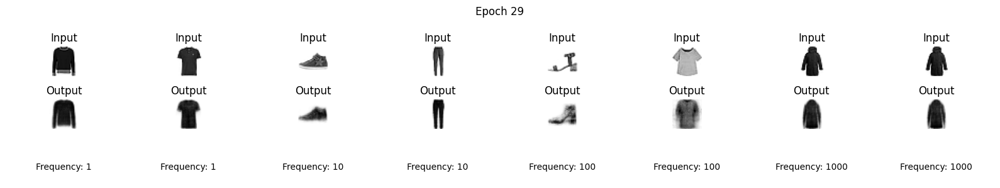

1/1 [==============================] - 0s 37ms/step


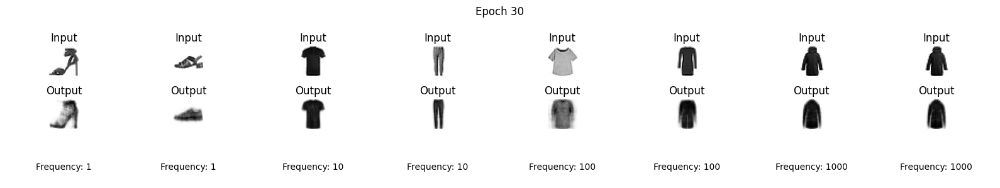

1/1 [==============================] - 0s 23ms/step


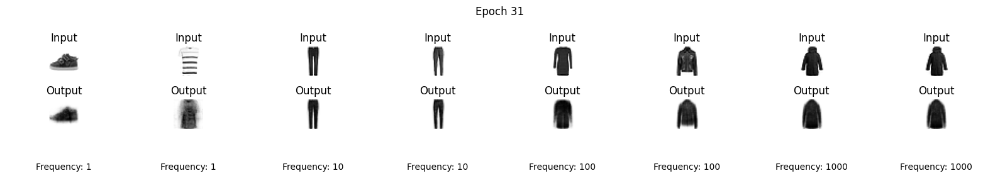

1/1 [==============================] - 0s 33ms/step


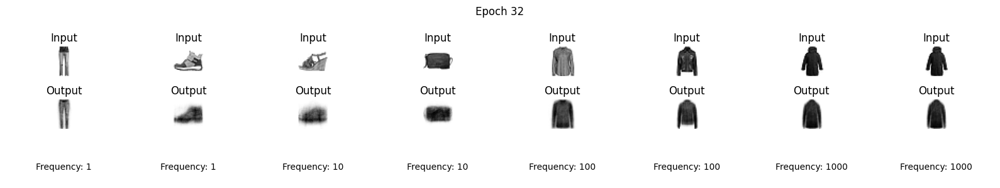

1/1 [==============================] - 0s 28ms/step


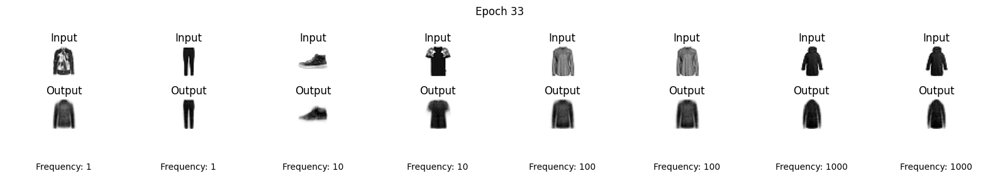

1/1 [==============================] - 0s 34ms/step


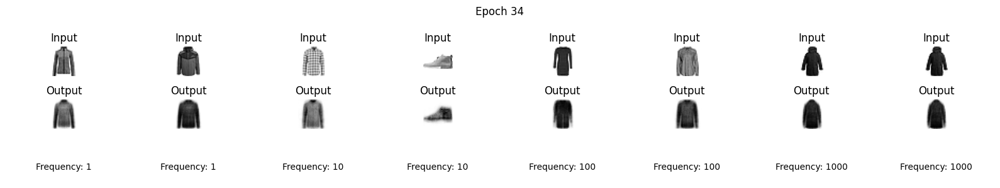

1/1 [==============================] - 0s 27ms/step


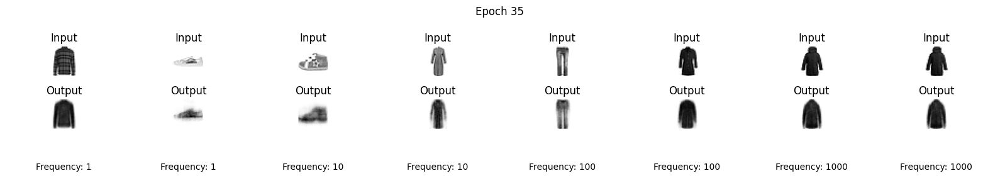

1/1 [==============================] - 0s 30ms/step


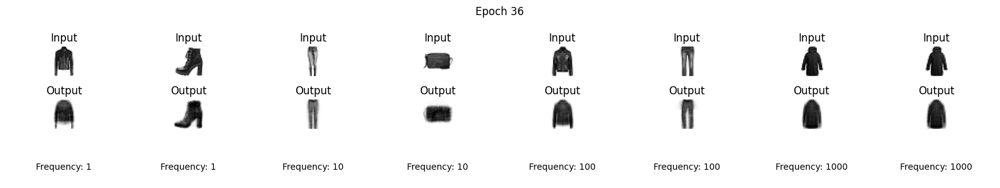

1/1 [==============================] - 0s 26ms/step


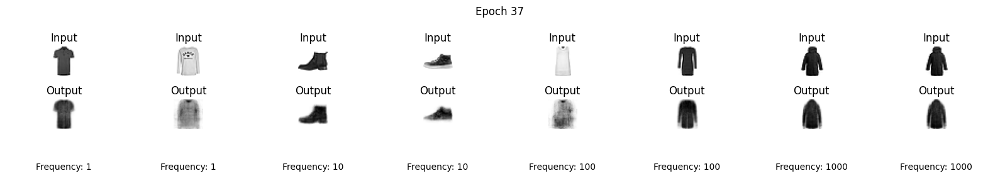

1/1 [==============================] - 0s 24ms/step


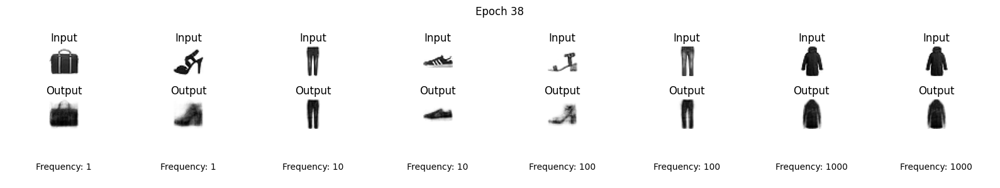

1/1 [==============================] - 0s 25ms/step


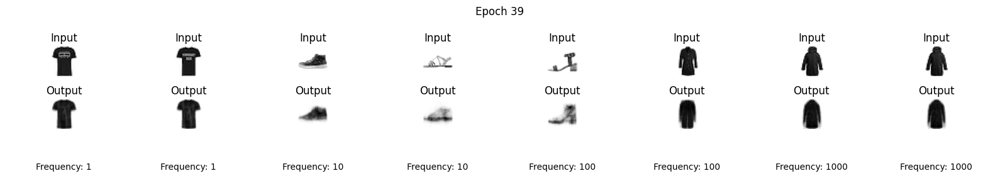

1/1 [==============================] - 0s 58ms/step


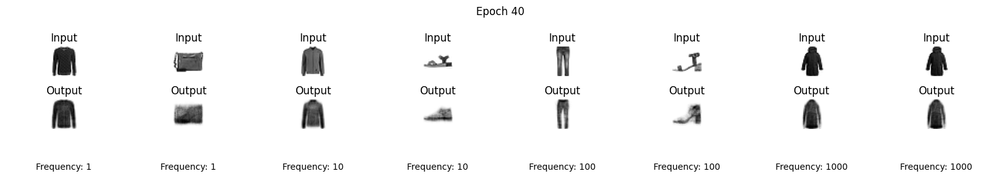

1/1 [==============================] - 0s 31ms/step


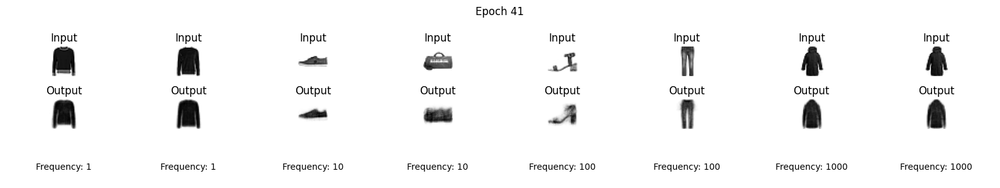

1/1 [==============================] - 0s 26ms/step


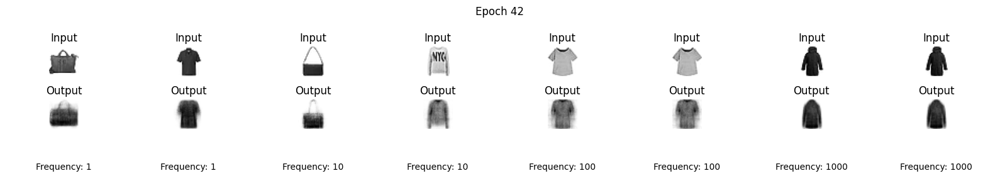

1/1 [==============================] - 0s 22ms/step


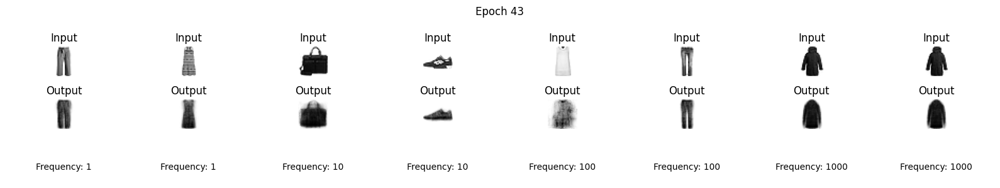

1/1 [==============================] - 0s 55ms/step


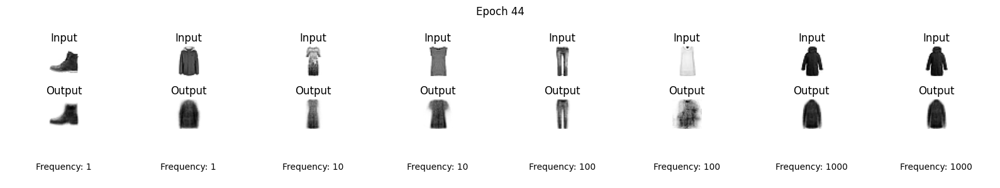

1/1 [==============================] - 0s 28ms/step


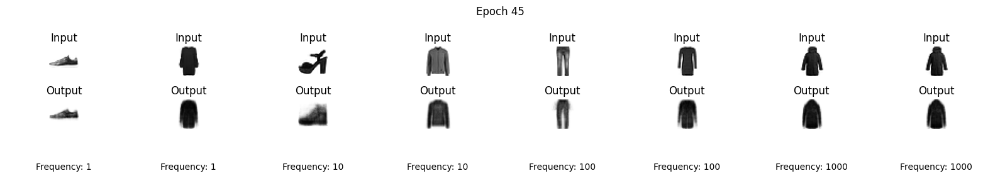

1/1 [==============================] - 0s 27ms/step


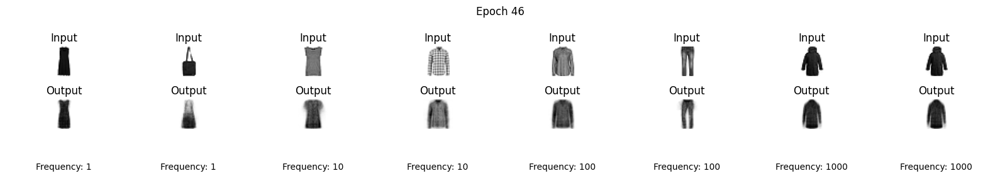

1/1 [==============================] - 0s 38ms/step


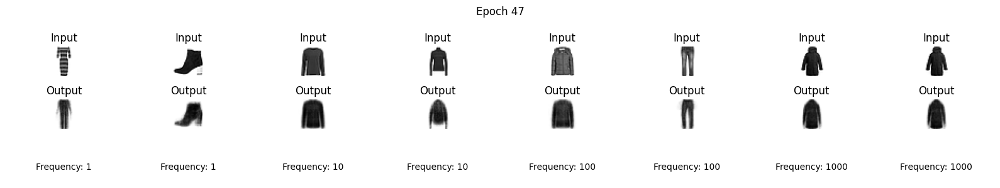

1/1 [==============================] - 0s 37ms/step


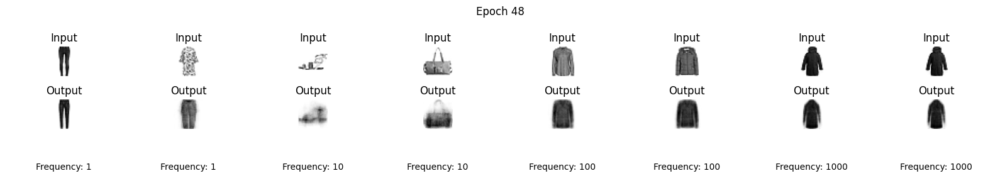

1/1 [==============================] - 0s 45ms/step


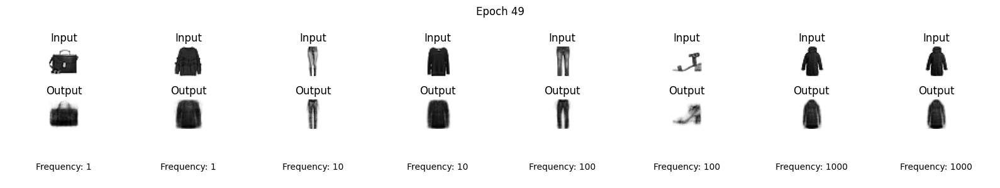

1/1 [==============================] - 0s 63ms/step


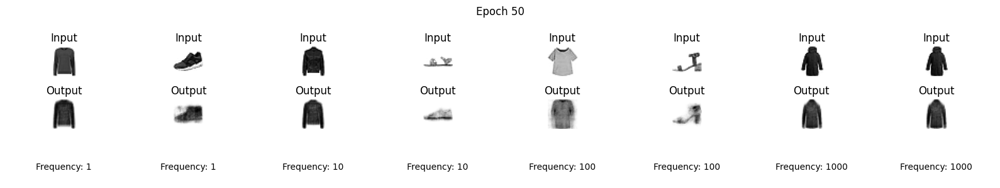

1/1 [==============================] - 0s 35ms/step


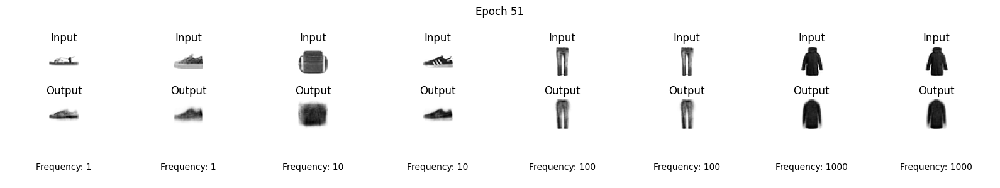

1/1 [==============================] - 0s 31ms/step


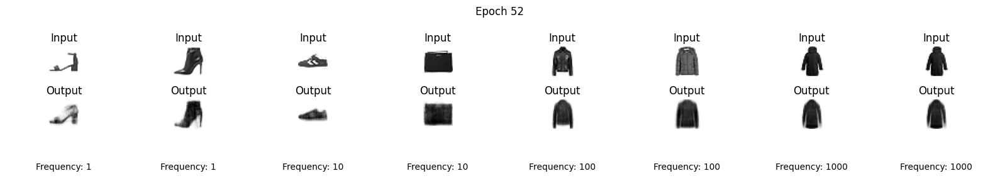

1/1 [==============================] - 0s 36ms/step


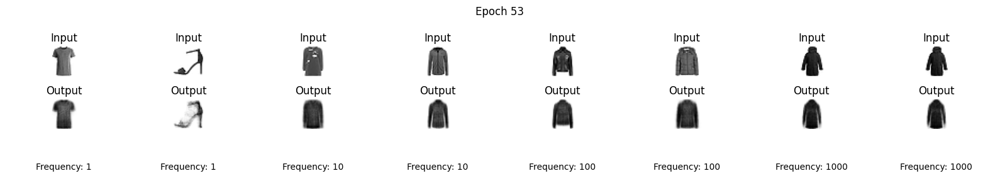

1/1 [==============================] - 0s 32ms/step


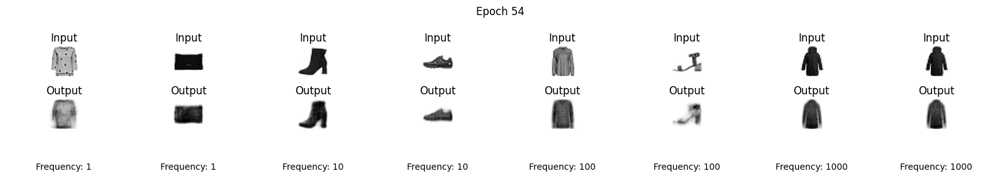

1/1 [==============================] - 0s 36ms/step


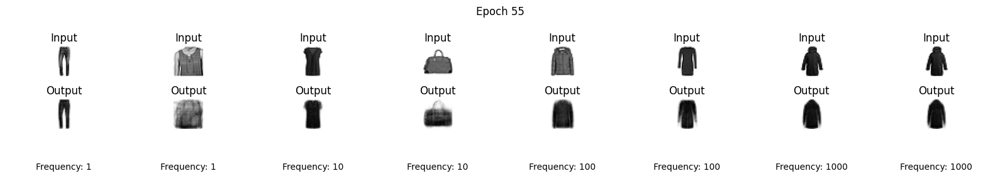

1/1 [==============================] - 0s 35ms/step


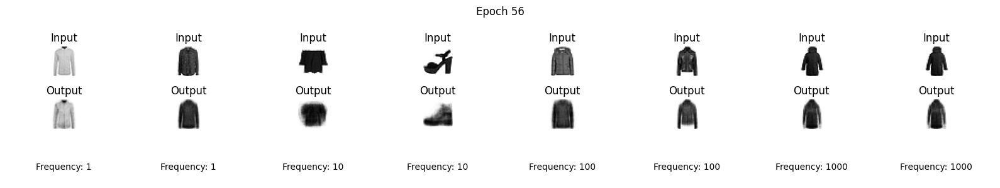

1/1 [==============================] - 0s 70ms/step


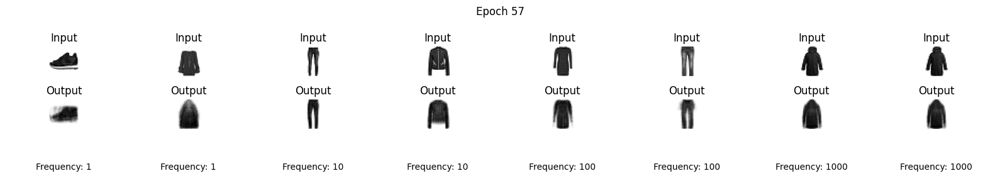

1/1 [==============================] - 0s 32ms/step


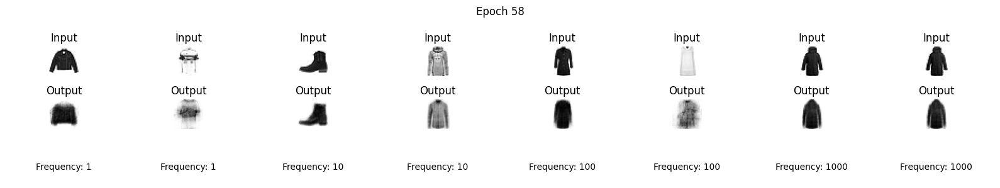

1/1 [==============================] - 0s 34ms/step


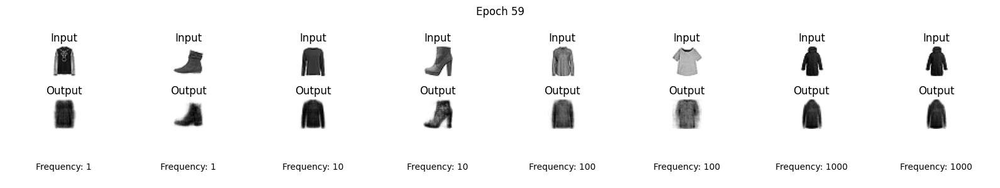

1/1 [==============================] - 0s 32ms/step


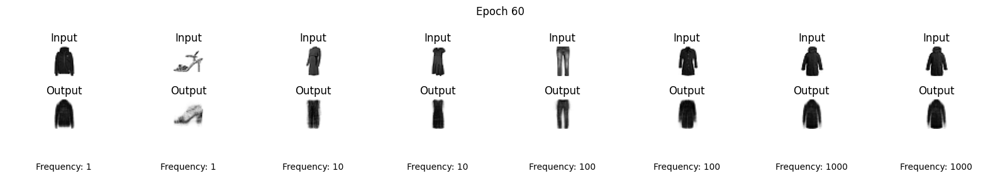

1/1 [==============================] - 0s 50ms/step


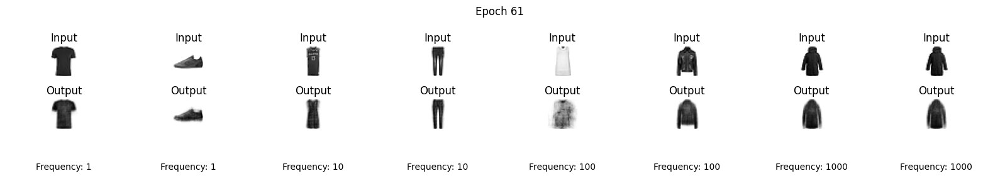

1/1 [==============================] - 0s 35ms/step


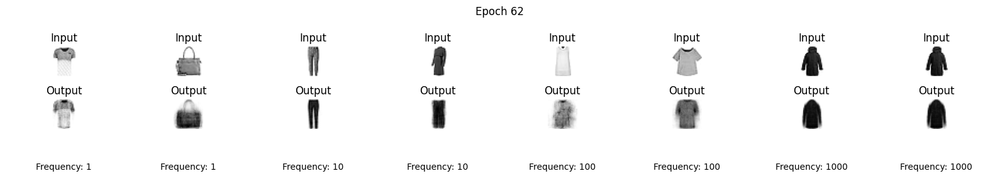

1/1 [==============================] - 0s 36ms/step


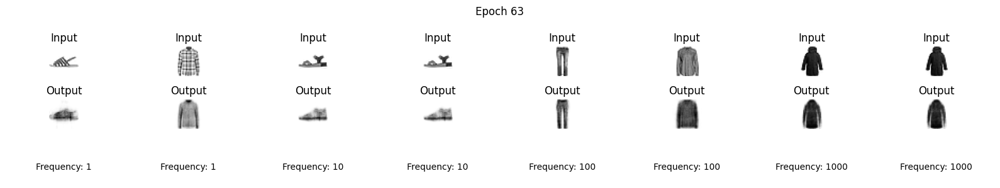

1/1 [==============================] - 0s 35ms/step


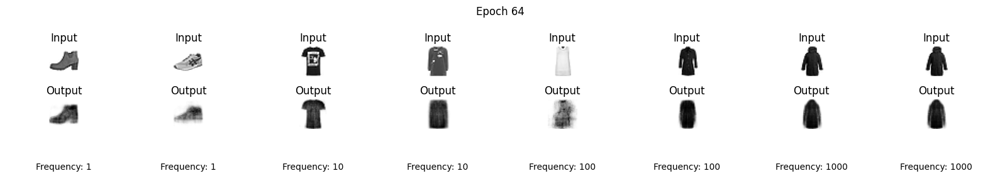

1/1 [==============================] - 0s 34ms/step


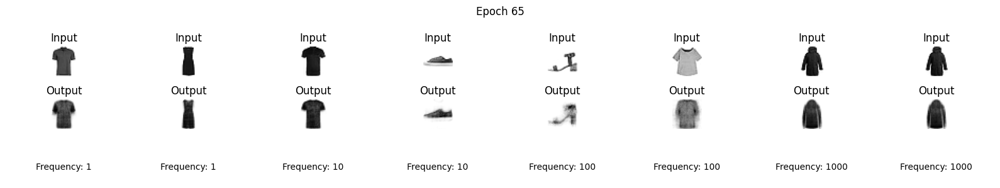

1/1 [==============================] - 0s 41ms/step


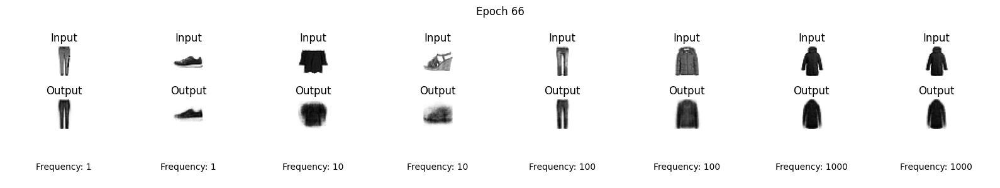

1/1 [==============================] - 0s 36ms/step


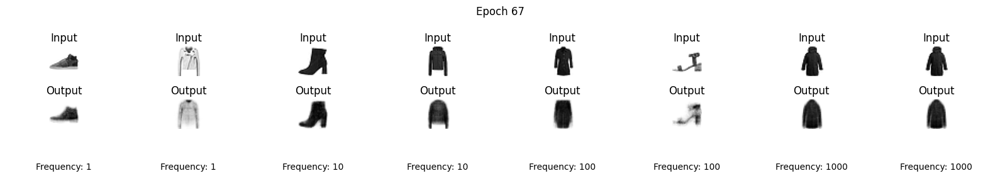

1/1 [==============================] - 0s 43ms/step


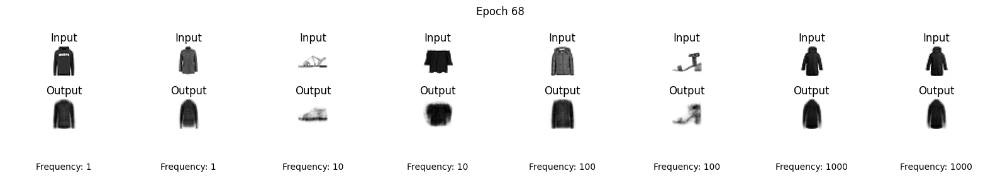

1/1 [==============================] - 0s 33ms/step


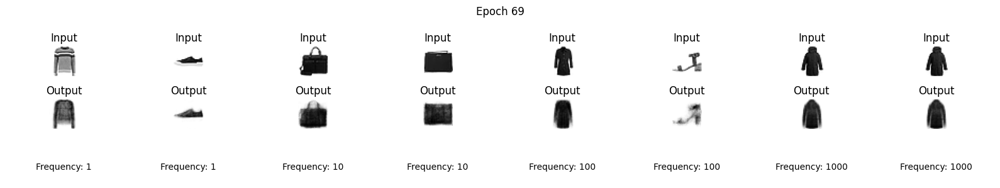

1/1 [==============================] - 0s 46ms/step


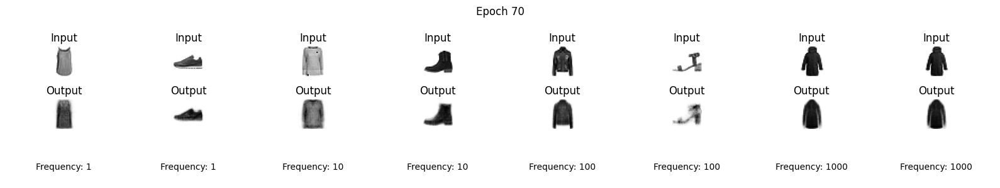

1/1 [==============================] - 0s 35ms/step


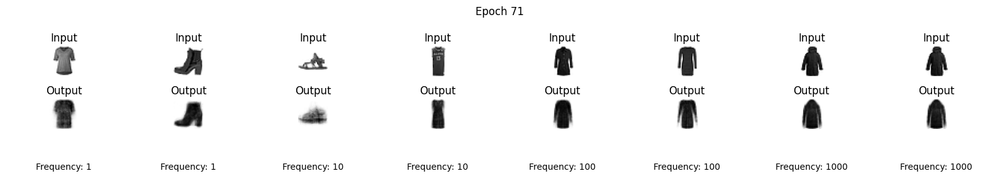

1/1 [==============================] - 0s 33ms/step


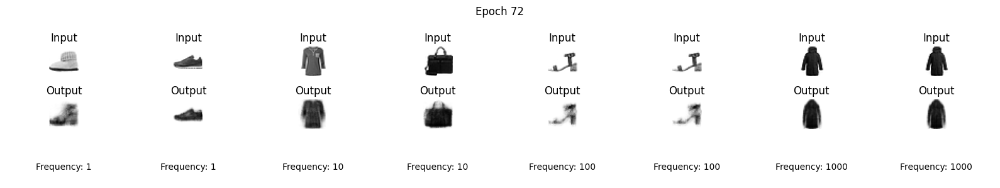

1/1 [==============================] - 0s 53ms/step


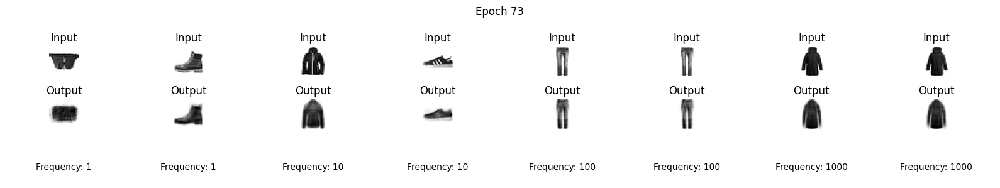

1/1 [==============================] - 0s 41ms/step


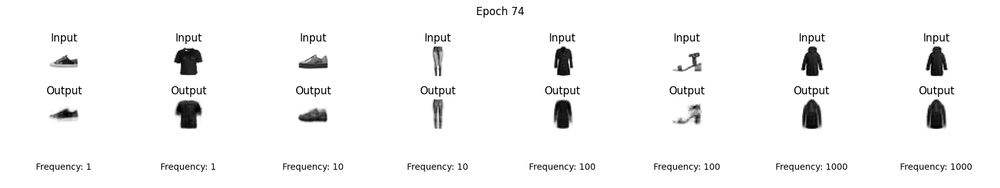

1/1 [==============================] - 0s 39ms/step


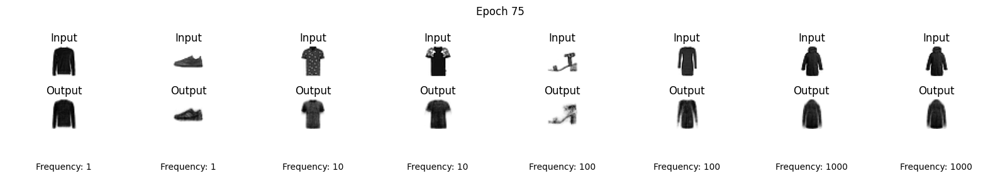

1/1 [==============================] - 0s 45ms/step


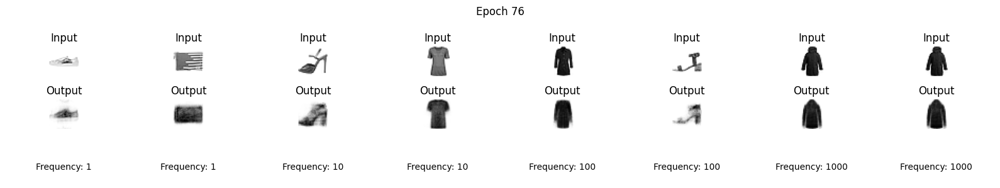

1/1 [==============================] - 0s 56ms/step


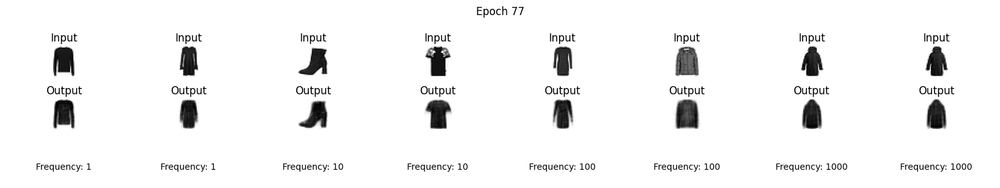

1/1 [==============================] - 0s 39ms/step


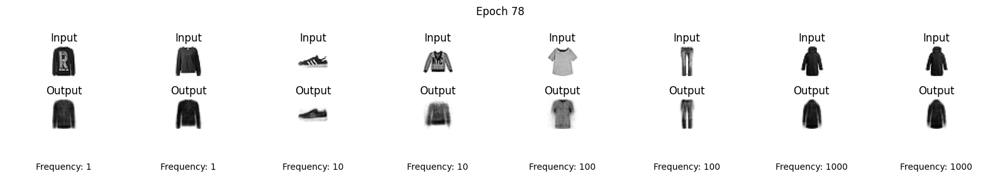

1/1 [==============================] - 0s 39ms/step


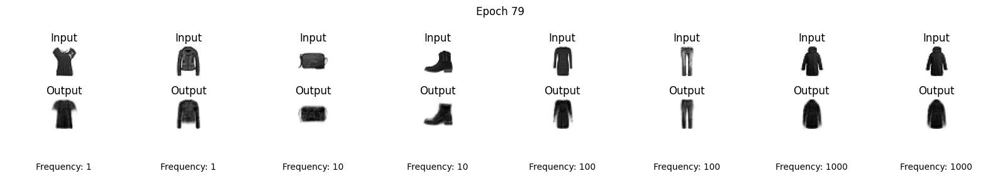

1/1 [==============================] - 0s 34ms/step


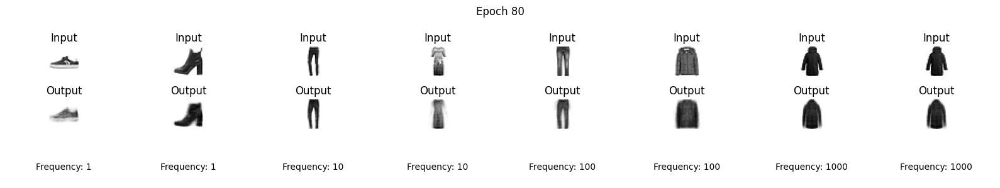

1/1 [==============================] - 0s 33ms/step


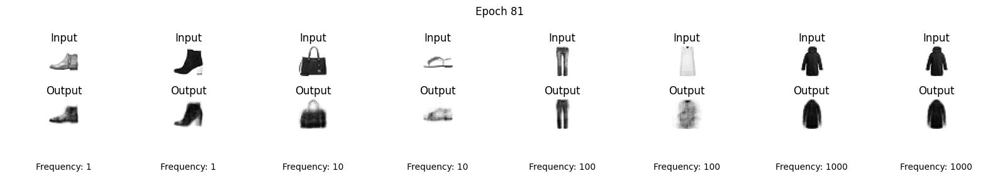

1/1 [==============================] - 0s 37ms/step


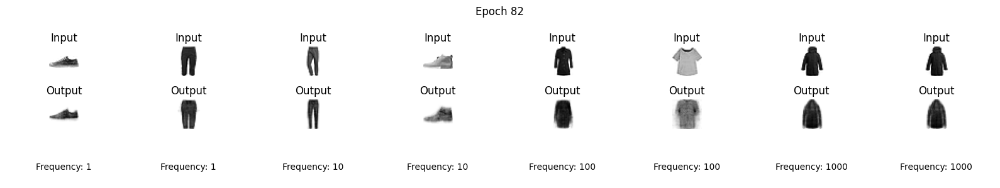

1/1 [==============================] - 0s 31ms/step


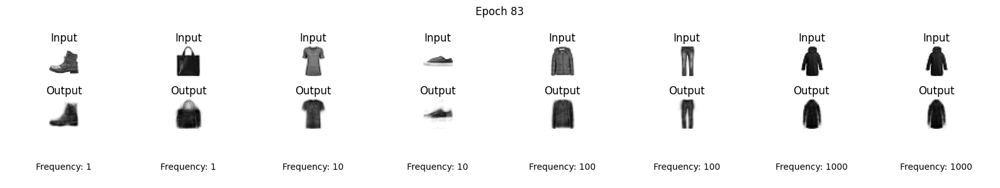

1/1 [==============================] - 0s 36ms/step


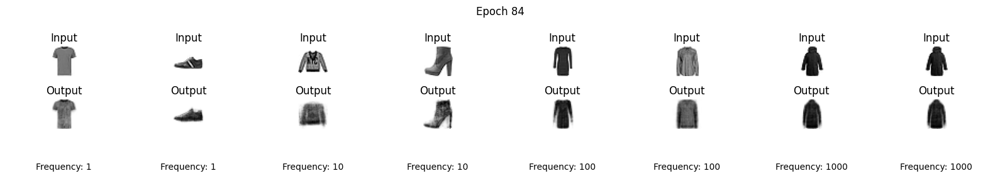

1/1 [==============================] - 0s 35ms/step


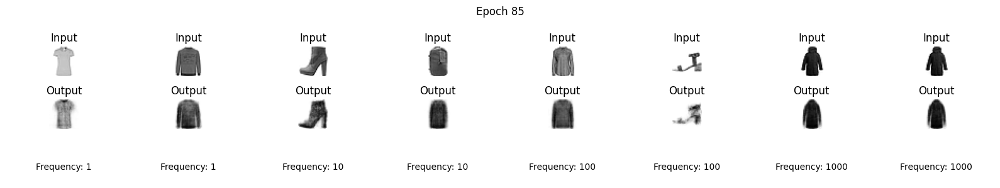

1/1 [==============================] - 0s 50ms/step


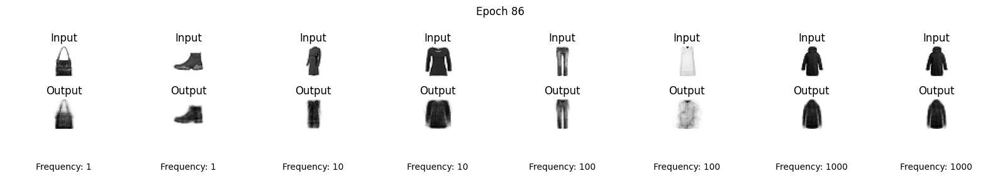

1/1 [==============================] - 0s 49ms/step


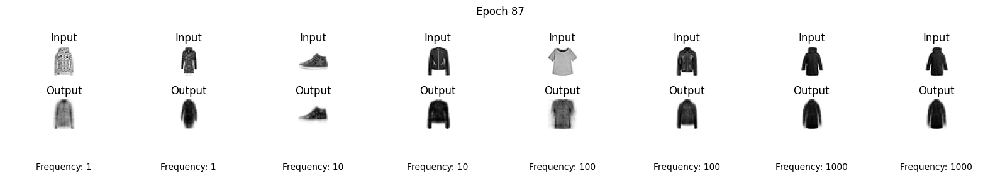

1/1 [==============================] - 0s 34ms/step


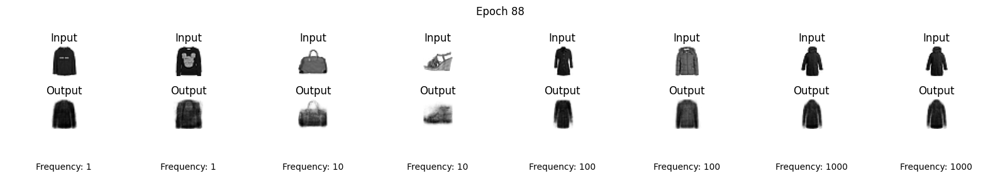

1/1 [==============================] - 0s 39ms/step


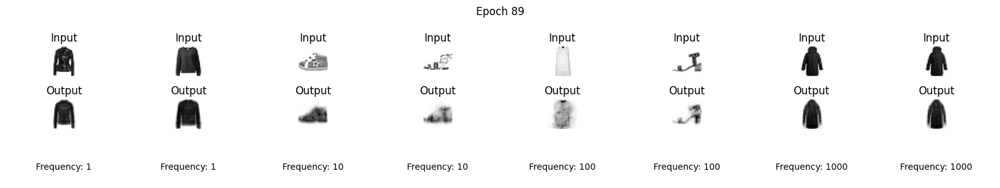

1/1 [==============================] - 0s 43ms/step


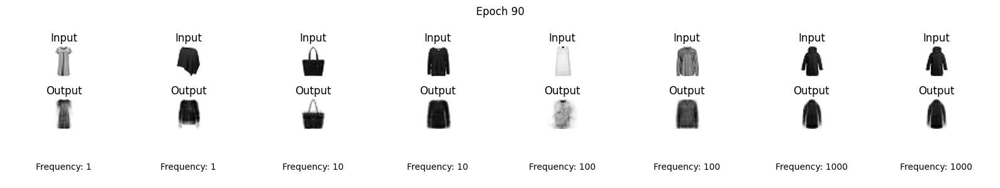

1/1 [==============================] - 0s 34ms/step


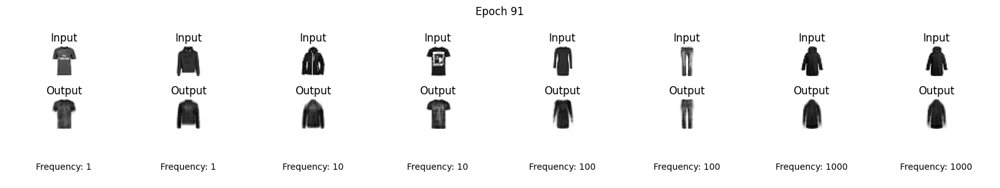

1/1 [==============================] - 0s 36ms/step


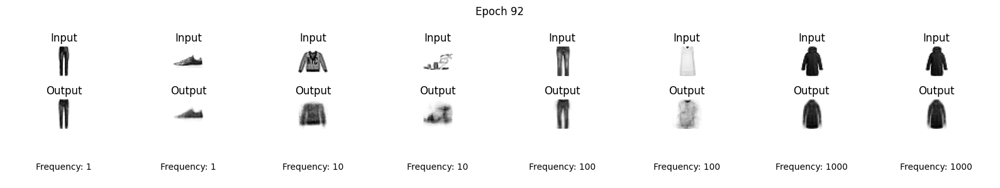

1/1 [==============================] - 0s 33ms/step


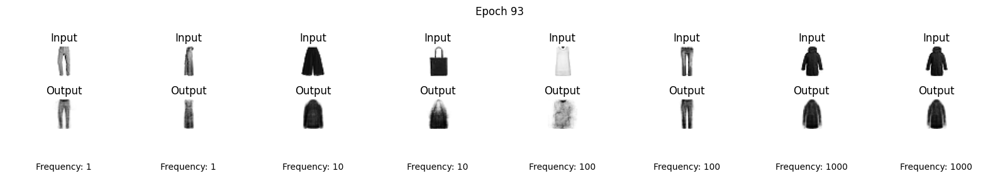

1/1 [==============================] - 0s 36ms/step


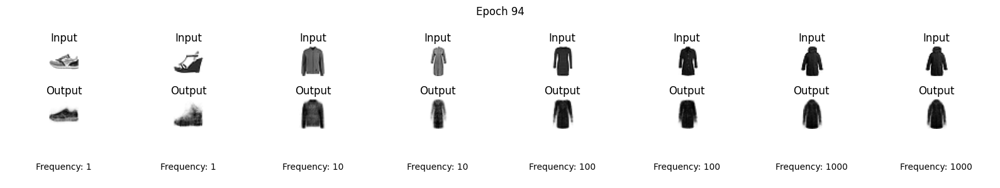

1/1 [==============================] - 0s 46ms/step


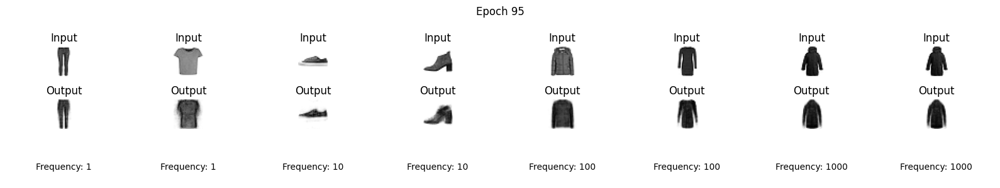

1/1 [==============================] - 0s 36ms/step


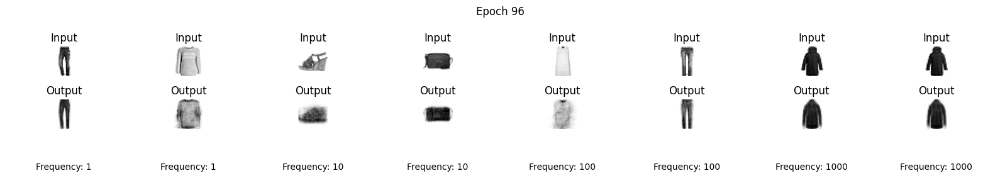

1/1 [==============================] - 0s 31ms/step


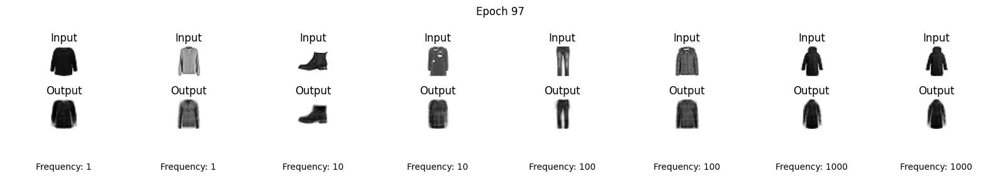

1/1 [==============================] - 0s 35ms/step


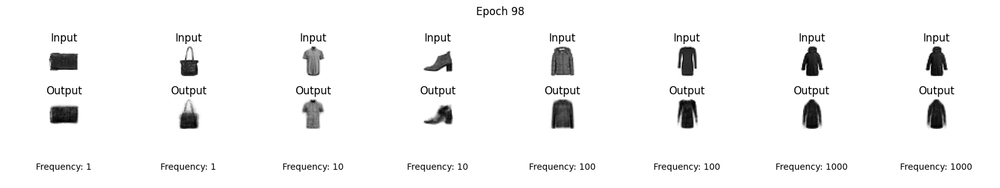

1/1 [==============================] - 0s 41ms/step


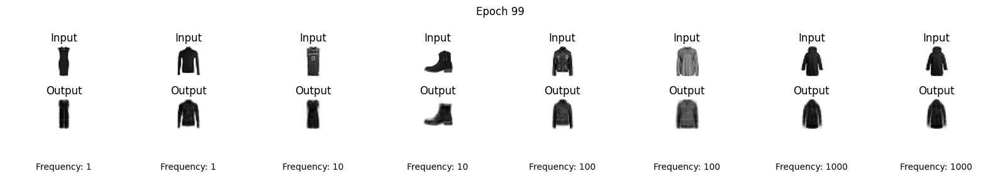

1/1 [==============================] - 0s 45ms/step


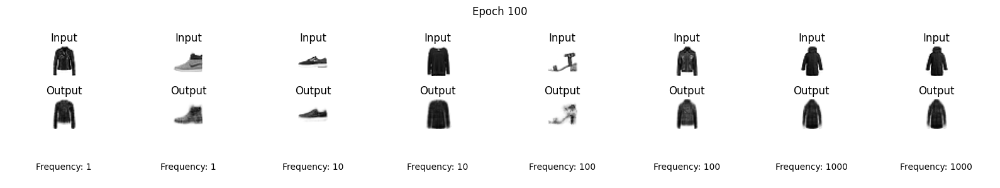

In [ ]:
EPOCHS = 100
EXAMPLES = 8

image_id = list(np.random.choice(range(10000), 1111, replace=False))

# Create a frequency dictionary
freq_dict = {img: 1000 for img in image_id[0:1]}
freq_dict.update({img: 100 for img in image_id[1:11]})
freq_dict.update({img: 10 for img in image_id[11:111]})
freq_dict.update({img: 1 for img in image_id[111:1111]})

# Separate image_ids based on their frequencies
image_ids_freq_1 = [image_id for image_id in image_id[111:1111]]
image_ids_freq_10 = [image_id for image_id in image_id[11:111]]
image_ids_freq_100 = [image_id for image_id in image_id[1:11]]
image_ids_freq_1000 = [image_id for image_id in image_id[0:1]]

# Create separate training sets for each frequency group
freq_train_1 = x_train[np.array([img for img in image_ids_freq_1])]
freq_train_10 = x_train[np.array([img for img in image_ids_freq_10])]
freq_train_100 = x_train[np.array([img for img in image_ids_freq_100])]
freq_train_1000 = x_train[np.array([img for img in image_ids_freq_1000])]

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(3, EXAMPLES, figsize=(EXAMPLES * 2, 3))  # Change to 3 rows

    rand = x_test[rand_ids].reshape((EXAMPLES, 1, 28, 28))

    # Pick 2 random images from each frequency group
    rand_ids = np.concatenate([
        np.random.choice(image_ids_freq_1, 2),
        np.random.choice(image_ids_freq_10, 2),
        np.random.choice(image_ids_freq_100, 2),
        np.random.choice(image_ids_freq_1000, 2)
    ])

    for j in range(EXAMPLES):
        # Get the image ID and the frequency of the image from the dictionary
        image_id = rand_ids[j]
        freq = freq_dict[image_id]

        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")

        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

        # Display the frequency
        axs[2, j].text(0.5, 0.5, f"Frequency: {freq}", ha='center', va='center')
        axs[2,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()

    # Train the model separately on each frequency group
    model.fit(freq_train_1, freq_train_1, verbose=0)
    model.fit(freq_train_10, freq_train_10, verbose=0)
    model.fit(freq_train_100, freq_train_100, verbose=0)
    model.fit(freq_train_1000, freq_train_1000, verbose=0)


## **Lesioning the Hippocampus**

To better understand how deficits look like those with hippocampal lesions, we will vary the number of neurons per layer, our L1 regularization value, as well as the learning rate of our optimizer, ADAM

We will start by damaging the input to the medial temporal lobe.

In [ ]:
encoder = Sequential([
    Flatten(input_shape = (28, 28)), # Sensory neurons convert raw data into something processable by the brain
    Dense(10), # Temporal Cortex
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(384), # Dentate Gyrus
    ReLU(),
    Dense(256), # CA3
    ReLU(),
    Hippocampus() # Apply L1 penalty to the activations of the neurons; Encourages processing of most important features
])
decoder = Sequential([
    Dense(384, input_shape = (256,)), # CA1
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(784), # Temporal Cortex
    Activation("sigmoid"),
    Reshape((28, 28))
])
img = Input(shape = (28, 28))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile(optimizer=Adam(), loss = "mean_squared_error")

1/1 [==============================] - 0s 21ms/step


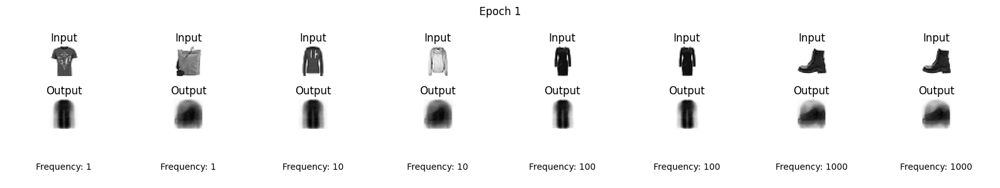

1/1 [==============================] - 0s 41ms/step


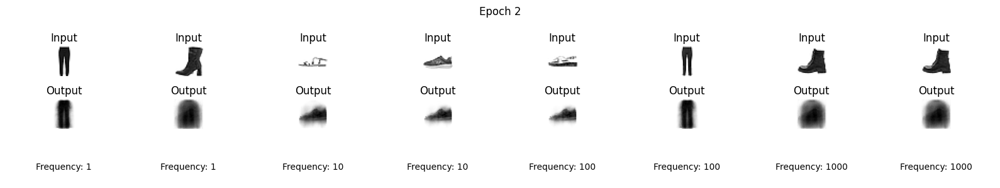

1/1 [==============================] - 0s 20ms/step


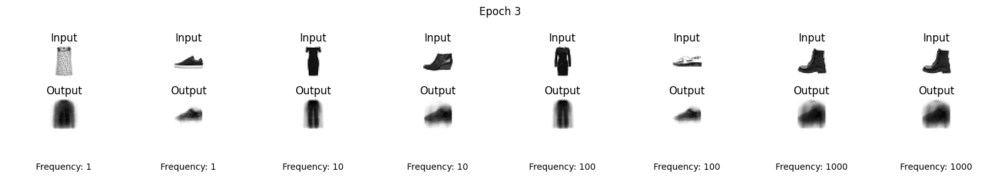

1/1 [==============================] - 0s 21ms/step


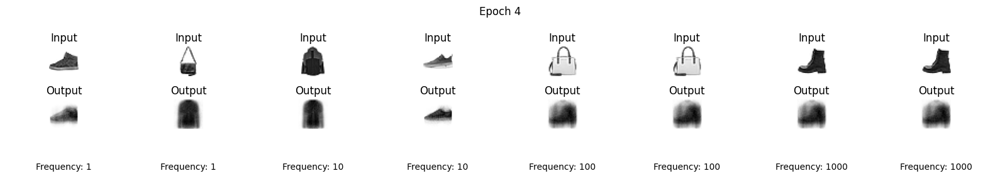

1/1 [==============================] - 0s 23ms/step


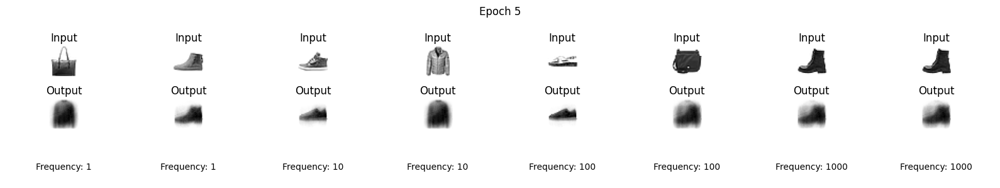

1/1 [==============================] - 0s 20ms/step


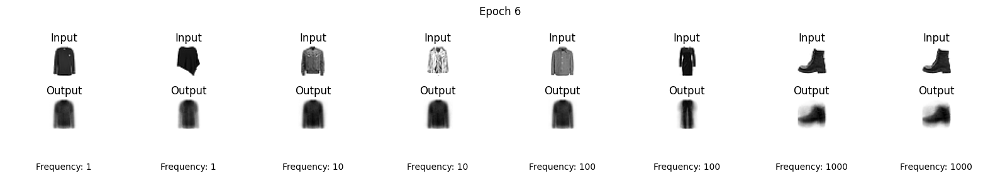

1/1 [==============================] - 0s 26ms/step


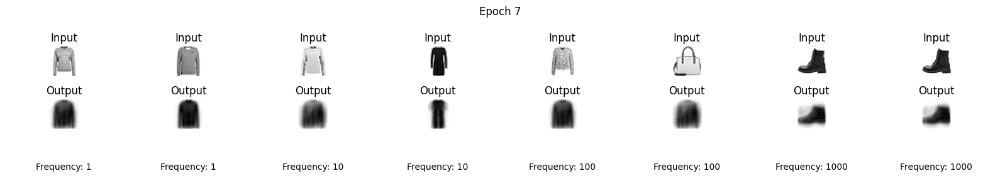

1/1 [==============================] - 0s 25ms/step


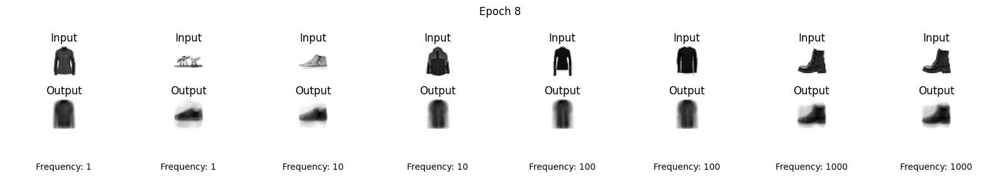

1/1 [==============================] - 0s 23ms/step


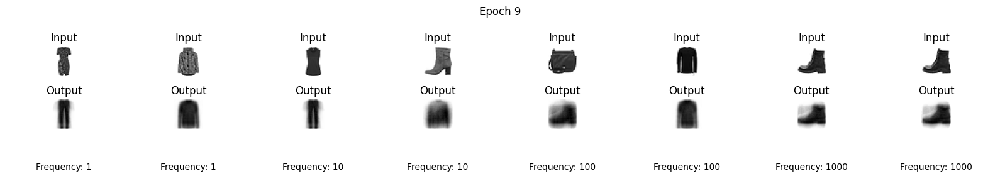

1/1 [==============================] - 0s 22ms/step


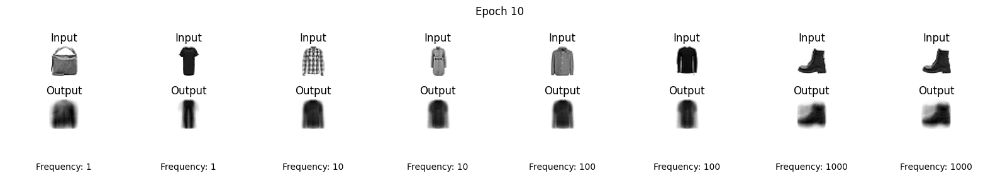

1/1 [==============================] - 0s 29ms/step


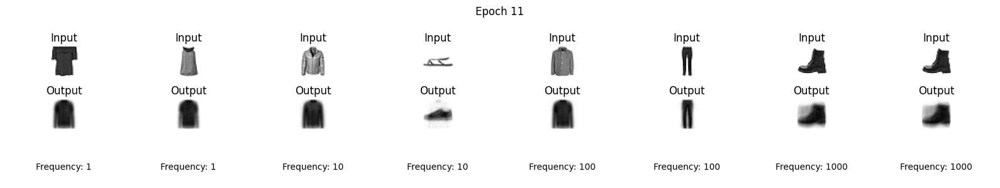

1/1 [==============================] - 0s 24ms/step


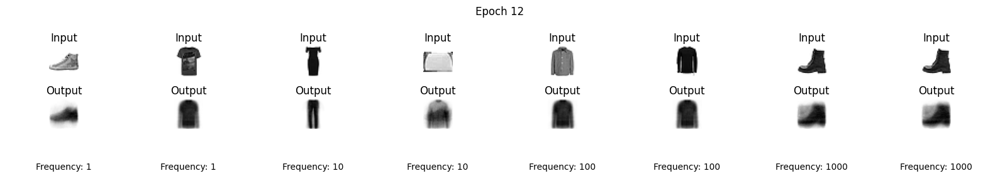

1/1 [==============================] - 0s 22ms/step


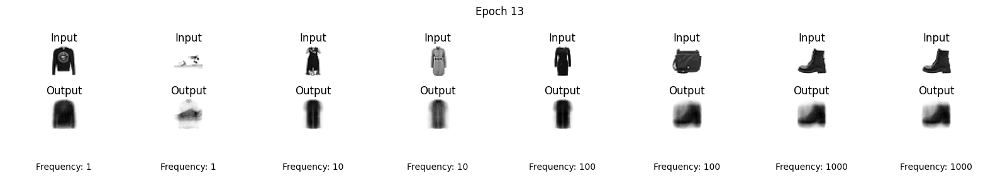

1/1 [==============================] - 0s 25ms/step


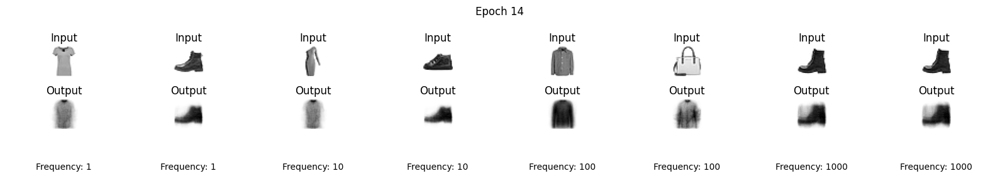

1/1 [==============================] - 0s 21ms/step


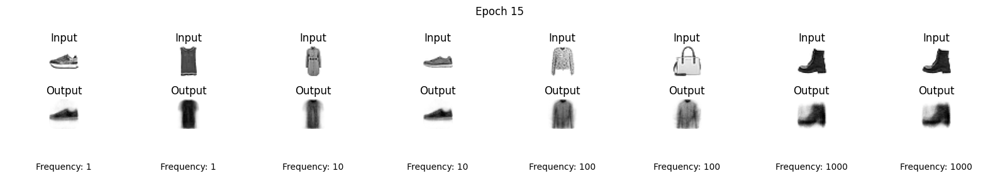

1/1 [==============================] - 0s 24ms/step


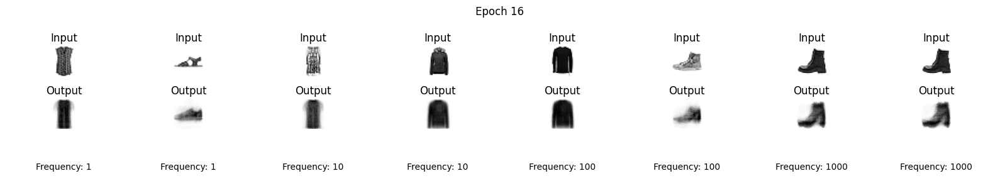

1/1 [==============================] - 0s 33ms/step


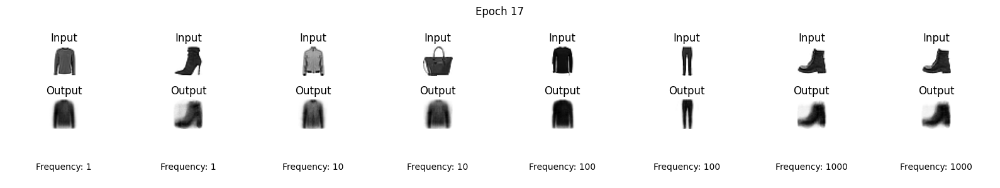

1/1 [==============================] - 0s 22ms/step


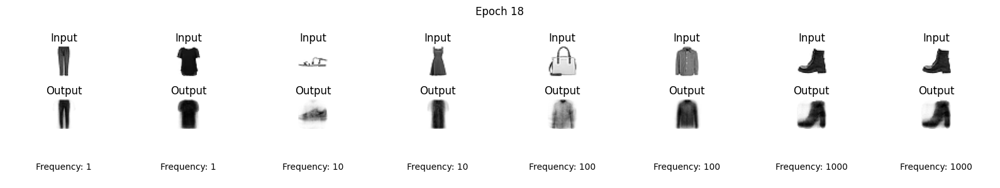

1/1 [==============================] - 0s 37ms/step


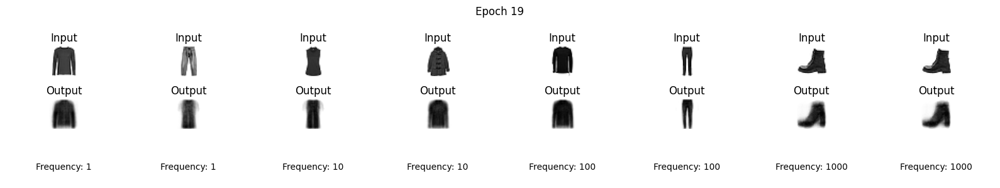

1/1 [==============================] - 0s 21ms/step


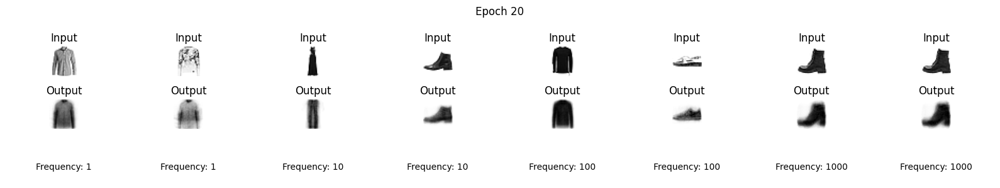

1/1 [==============================] - 0s 22ms/step


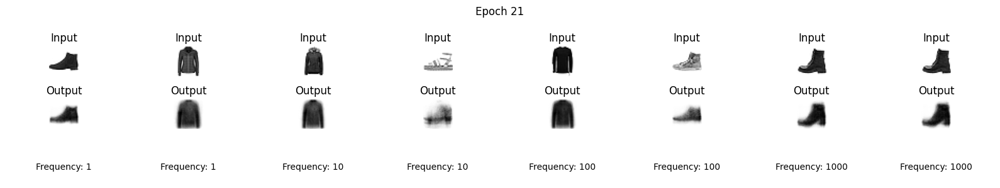

1/1 [==============================] - 0s 29ms/step


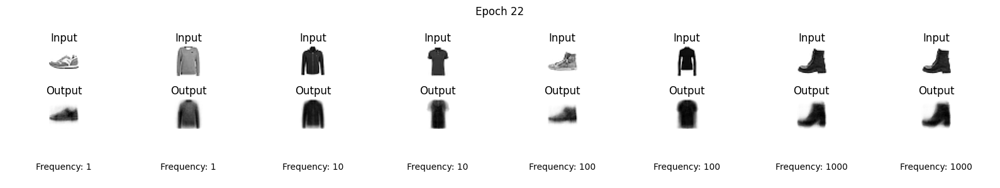

1/1 [==============================] - 0s 30ms/step


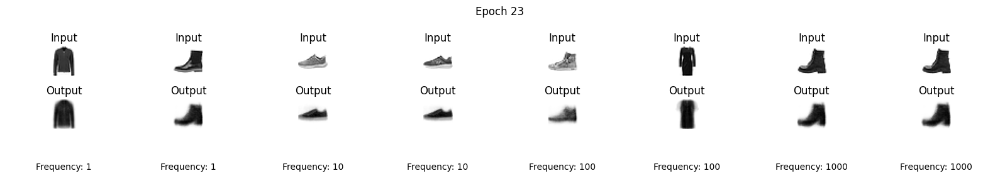

1/1 [==============================] - 0s 25ms/step


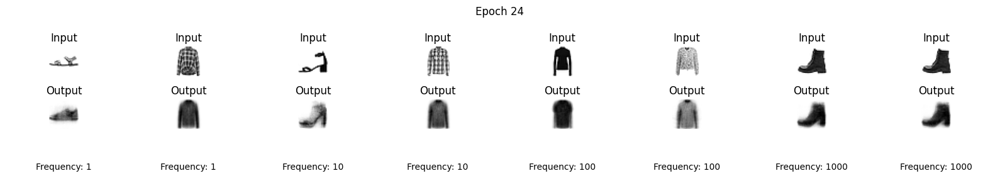

1/1 [==============================] - 0s 23ms/step


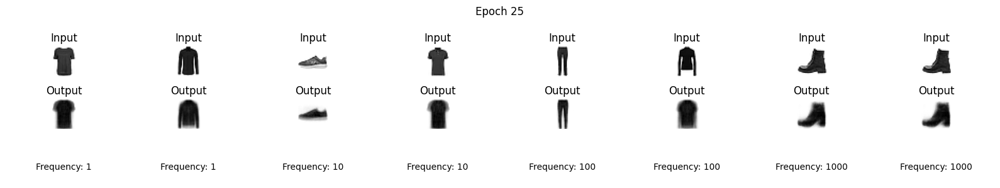

1/1 [==============================] - 0s 21ms/step


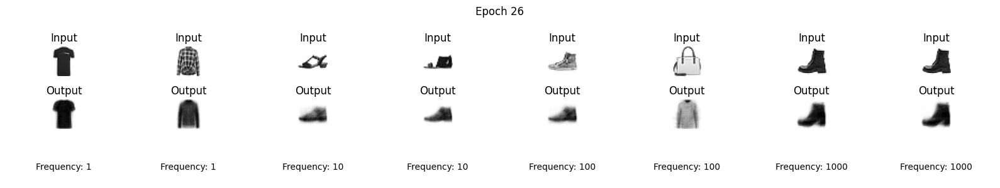

1/1 [==============================] - 0s 32ms/step


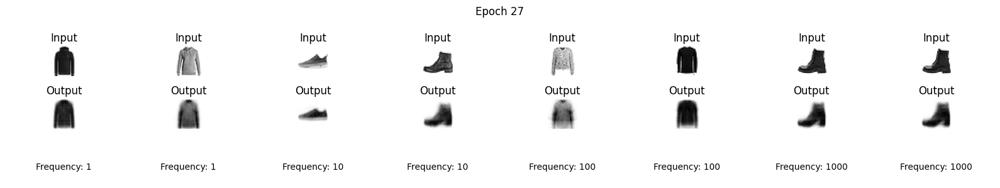

1/1 [==============================] - 0s 23ms/step


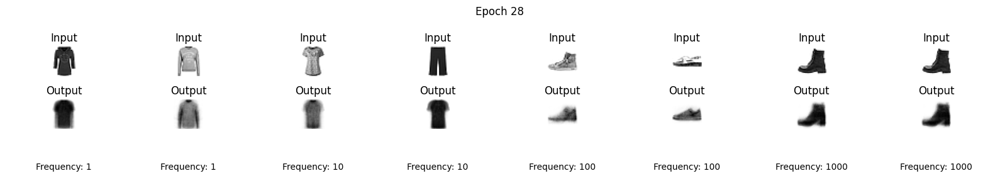

1/1 [==============================] - 0s 22ms/step


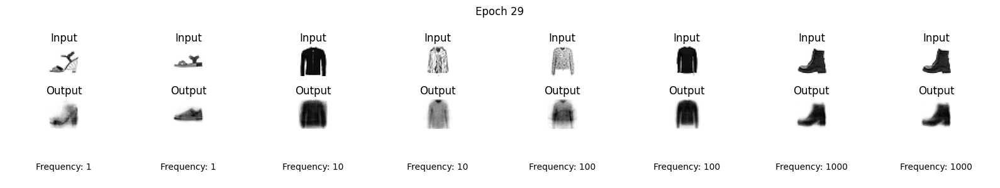

1/1 [==============================] - 0s 21ms/step


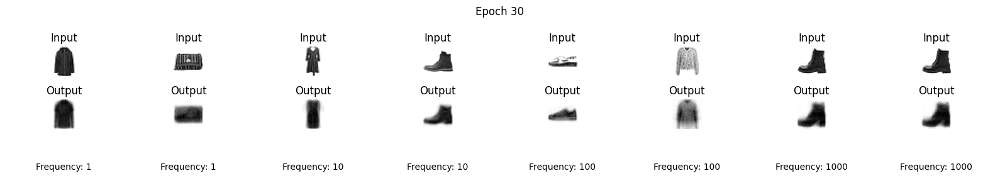

1/1 [==============================] - 0s 45ms/step


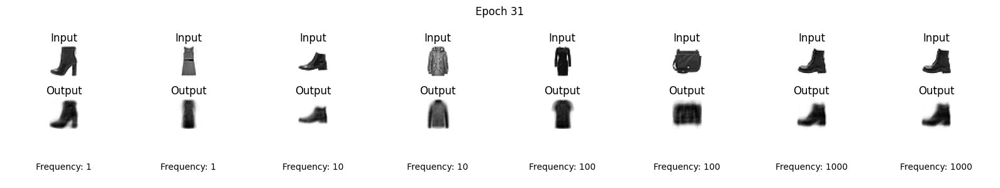

1/1 [==============================] - 0s 22ms/step


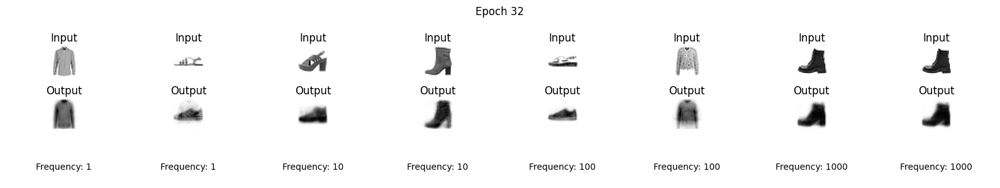

1/1 [==============================] - 0s 23ms/step


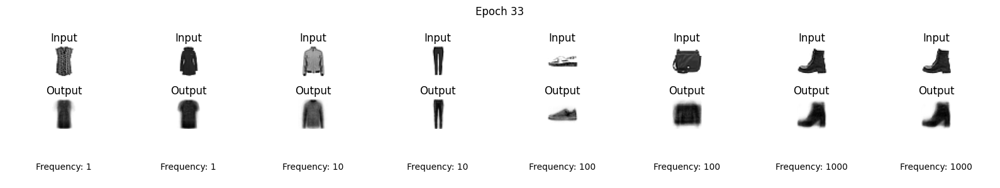

1/1 [==============================] - 0s 26ms/step


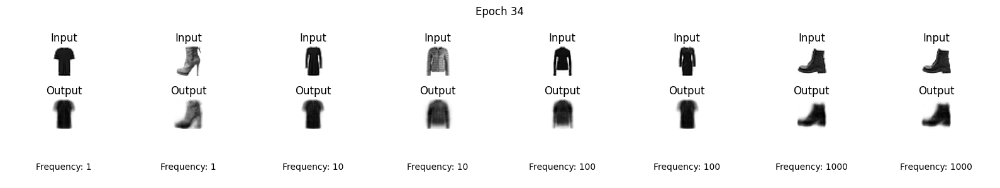

1/1 [==============================] - 0s 48ms/step


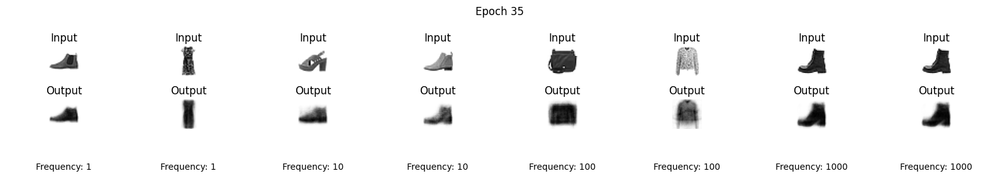

1/1 [==============================] - 0s 25ms/step


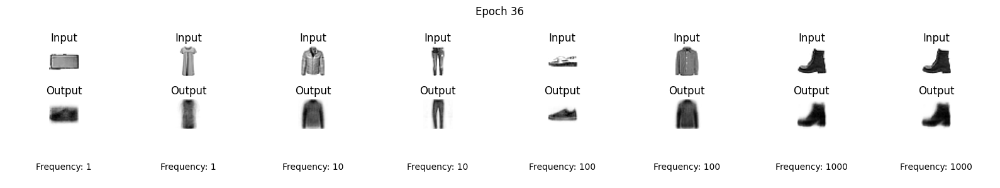

1/1 [==============================] - 0s 26ms/step


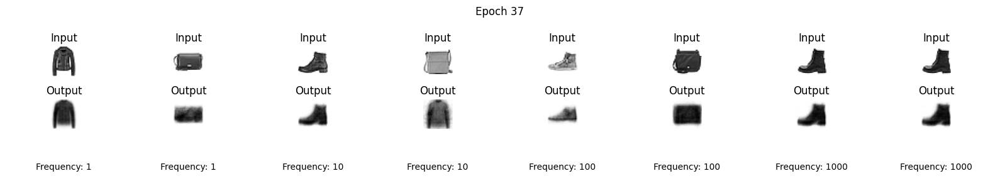

1/1 [==============================] - 0s 22ms/step


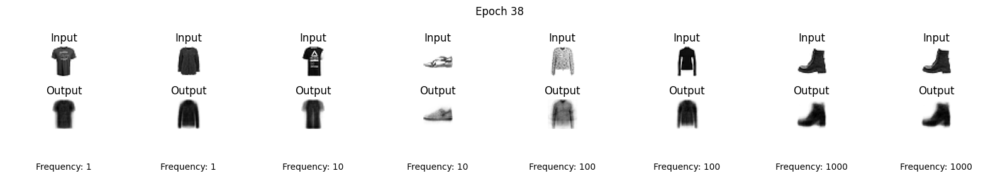

1/1 [==============================] - 0s 32ms/step


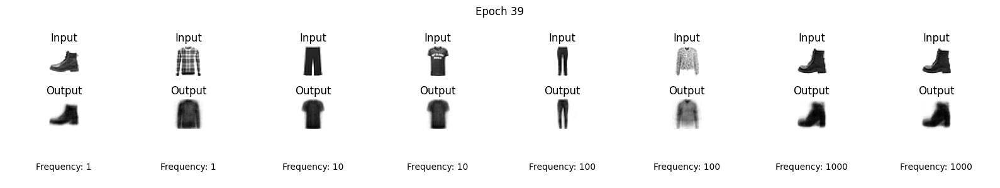

1/1 [==============================] - 0s 30ms/step


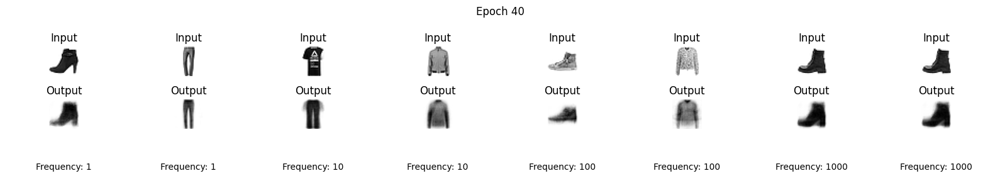

1/1 [==============================] - 0s 28ms/step


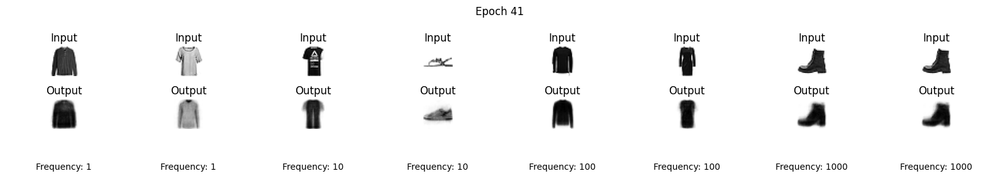

1/1 [==============================] - 0s 25ms/step


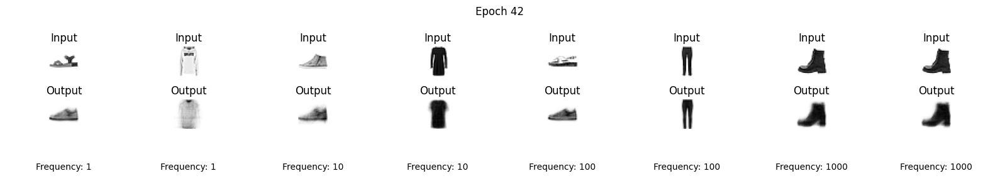

1/1 [==============================] - 0s 46ms/step


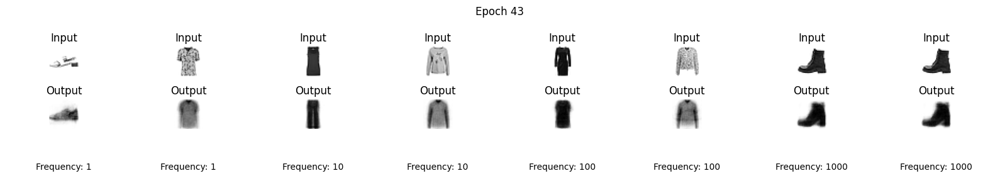

1/1 [==============================] - 0s 31ms/step


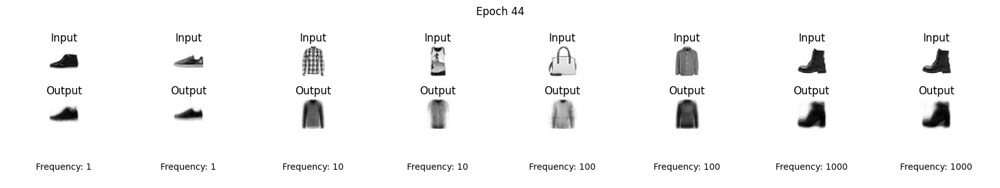

1/1 [==============================] - 0s 25ms/step


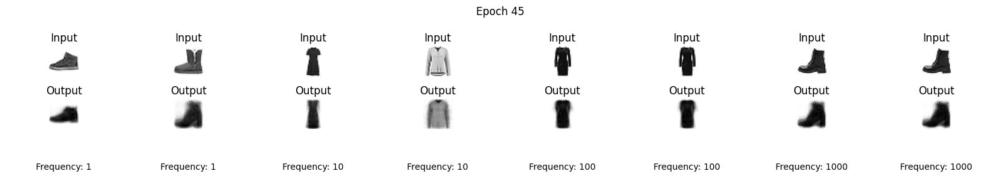

1/1 [==============================] - 0s 27ms/step


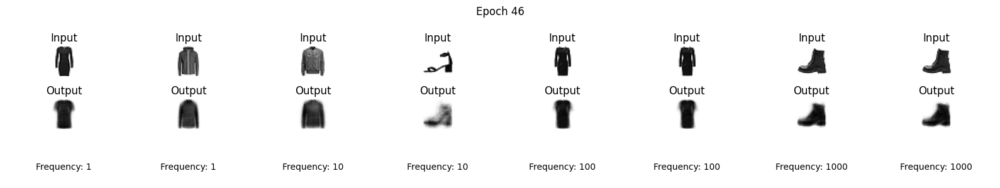

1/1 [==============================] - 0s 35ms/step


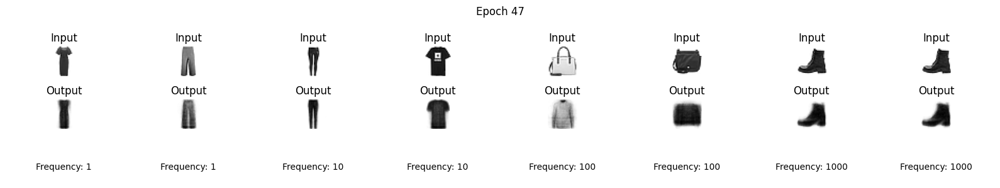

1/1 [==============================] - 0s 27ms/step


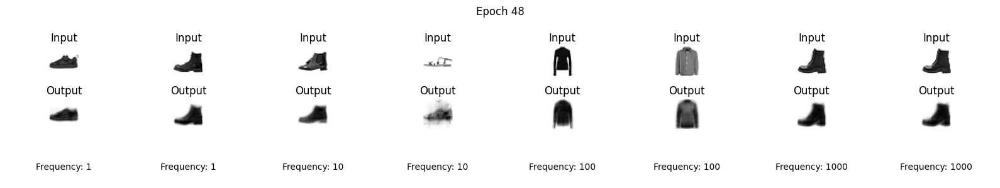

1/1 [==============================] - 0s 29ms/step


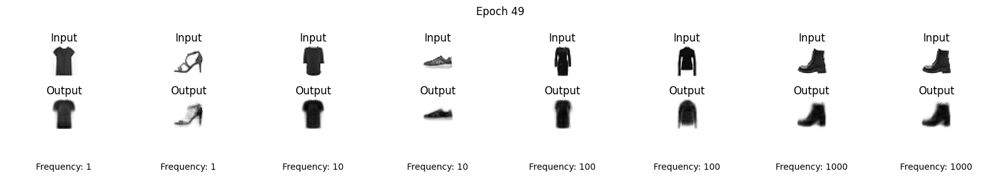

1/1 [==============================] - 0s 31ms/step


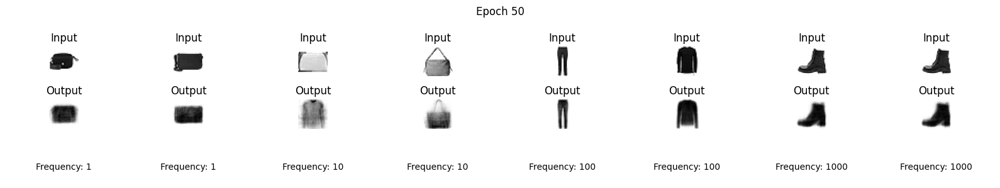

In [ ]:
EPOCHS = 50
EXAMPLES = 8

image_id = list(np.random.choice(range(10000), 1111, replace=False))

# Create a frequency dictionary
freq_dict = {img: 1000 for img in image_id[0:1]}
freq_dict.update({img: 100 for img in image_id[1:11]})
freq_dict.update({img: 10 for img in image_id[11:111]})
freq_dict.update({img: 1 for img in image_id[111:1111]})

# Separate image_ids based on their frequencies
image_ids_freq_1 = [image_id for image_id in image_id[111:1111]]
image_ids_freq_10 = [image_id for image_id in image_id[11:111]]
image_ids_freq_100 = [image_id for image_id in image_id[1:11]]
image_ids_freq_1000 = [image_id for image_id in image_id[0:1]]

# Create separate training sets for each frequency group
freq_train_1 = x_train[np.array([img for img in image_ids_freq_1])]
freq_train_10 = x_train[np.array([img for img in image_ids_freq_10])]
freq_train_100 = x_train[np.array([img for img in image_ids_freq_100])]
freq_train_1000 = x_train[np.array([img for img in image_ids_freq_1000])]

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(3, EXAMPLES, figsize=(EXAMPLES * 2, 3))  # Change to 3 rows

    # Pick 2 random images from each frequency group
    rand_ids = np.concatenate([
        np.random.choice(image_ids_freq_1, 2),
        np.random.choice(image_ids_freq_10, 2),
        np.random.choice(image_ids_freq_100, 2),
        np.random.choice(image_ids_freq_1000, 2)
    ])

    rand = x_test[rand_ids].reshape((EXAMPLES, 1, 28, 28))

    for j in range(EXAMPLES):
        # Get the image ID and the frequency of the image from the dictionary
        image_id = rand_ids[j]
        freq = freq_dict[image_id]

        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")

        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

        # Display the frequency
        axs[2, j].text(0.5, 0.5, f"Frequency: {freq}", ha='center', va='center')
        axs[2,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()

    # Train the model separately on each frequency group
    model.fit(freq_train_1, freq_train_1, verbose=0)
    model.fit(freq_train_10, freq_train_10, verbose=0)
    model.fit(freq_train_100, freq_train_100, verbose=0)
    model.fit(freq_train_1000, freq_train_1000, verbose=0)


Damaging the DG of the hippocampus

In [ ]:
encoder = Sequential([
    Flatten(input_shape = (28, 28)), # Sensory neurons convert raw data into something processable by the brain
    Dense(784), # Temporal Cortex
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(50), # Dentate Gyrus
    ReLU(),
    Dense(256), # CA3
    ReLU(),
    Hippocampus() # Apply L1 penalty to the activations of the neurons; Encourages processing of most important features
])
decoder = Sequential([
    Dense(384, input_shape = (256,)), # CA1
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(784), # Temporal Cortex
    Activation("sigmoid"),
    Reshape((28, 28))
])
img = Input(shape = (28, 28))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile(optimizer=Adam(), loss = "mean_squared_error")

1/1 [==============================] - 0s 81ms/step


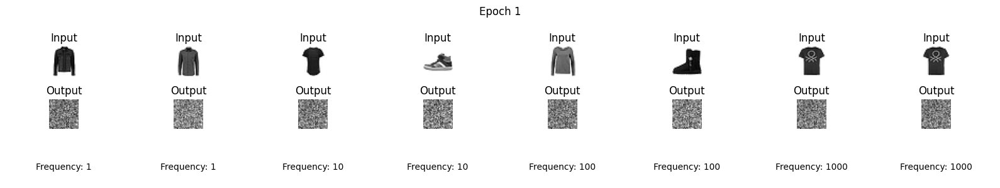

1/1 [==============================] - 0s 23ms/step


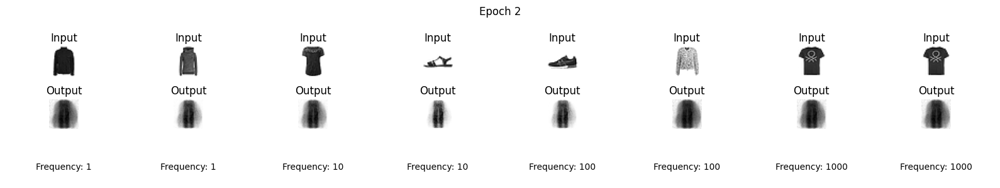

1/1 [==============================] - 0s 34ms/step


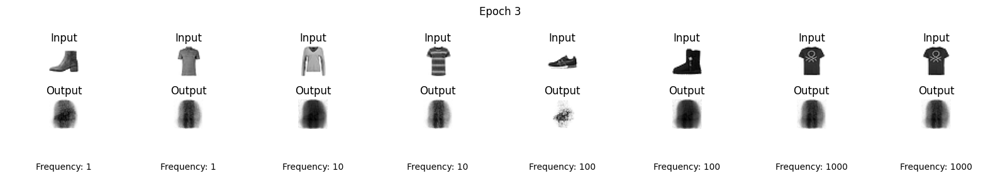

1/1 [==============================] - 0s 27ms/step


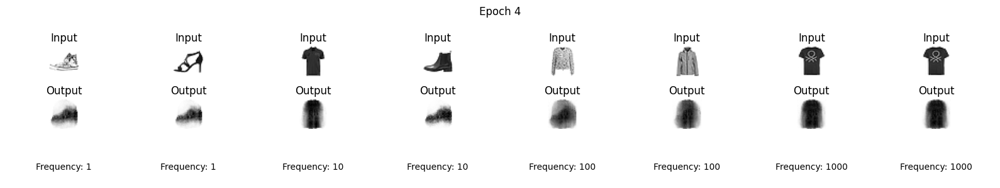

1/1 [==============================] - 0s 23ms/step


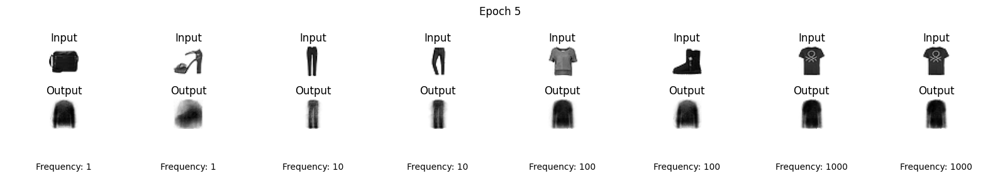

1/1 [==============================] - 0s 25ms/step


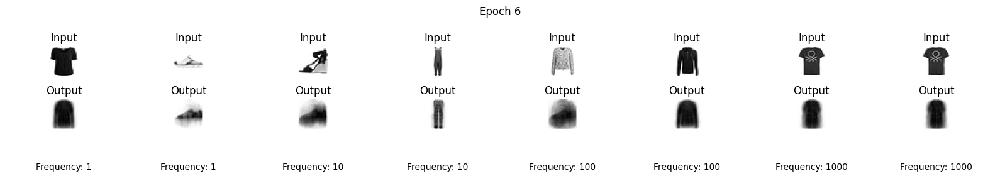

1/1 [==============================] - 0s 31ms/step


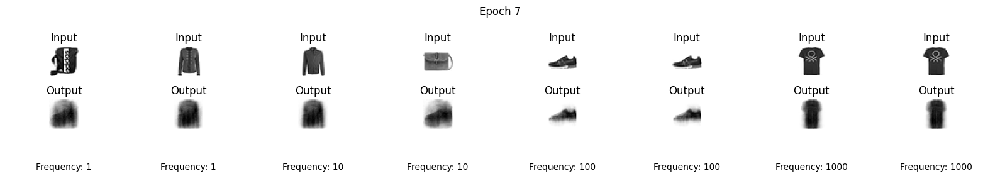

1/1 [==============================] - 0s 23ms/step


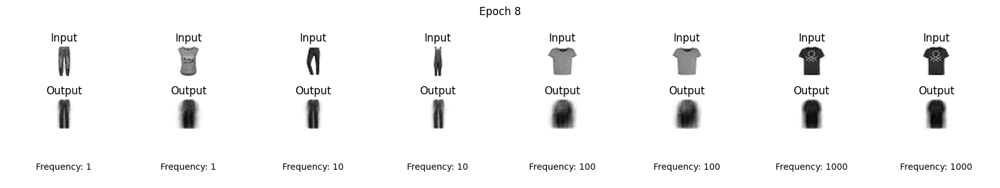

1/1 [==============================] - 0s 26ms/step


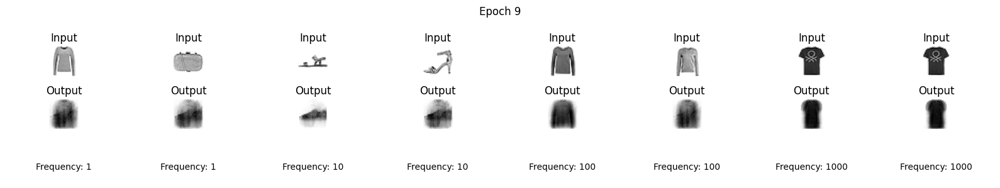

1/1 [==============================] - 0s 22ms/step


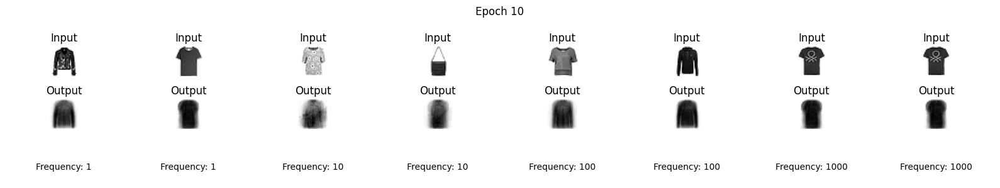

1/1 [==============================] - 0s 32ms/step


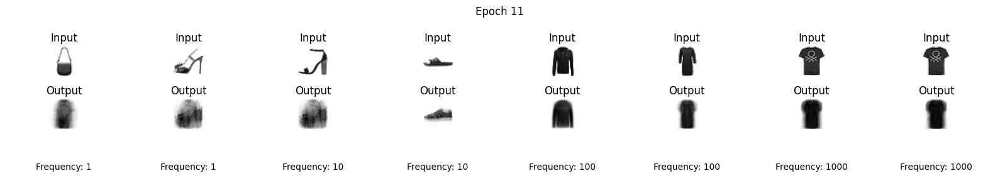

1/1 [==============================] - 0s 23ms/step


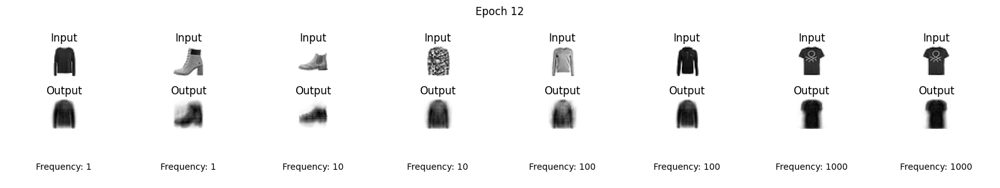

1/1 [==============================] - 0s 24ms/step


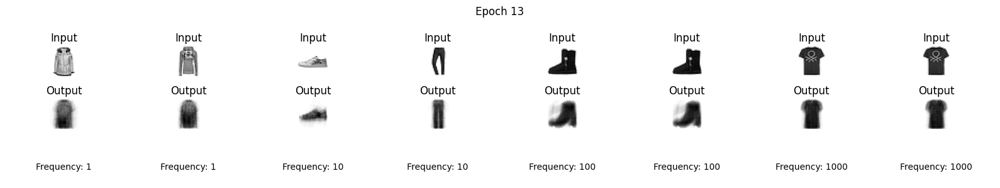

1/1 [==============================] - 0s 27ms/step


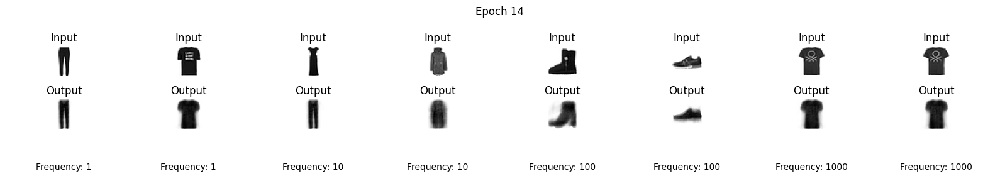

1/1 [==============================] - 0s 35ms/step


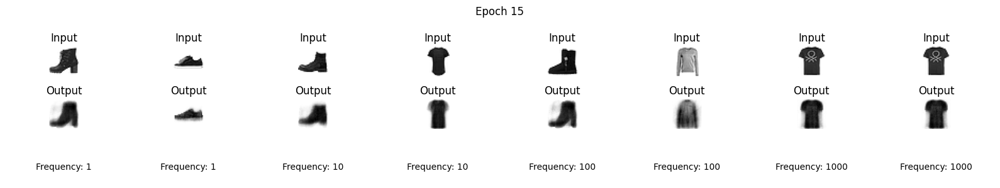

1/1 [==============================] - 0s 26ms/step


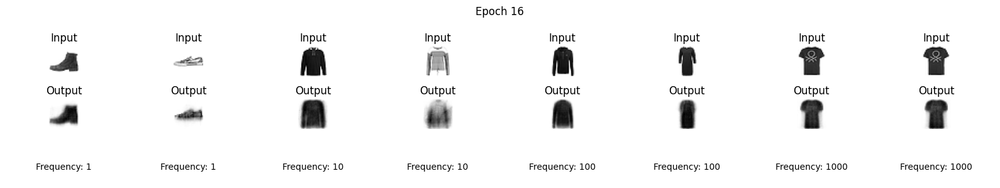

1/1 [==============================] - 0s 22ms/step


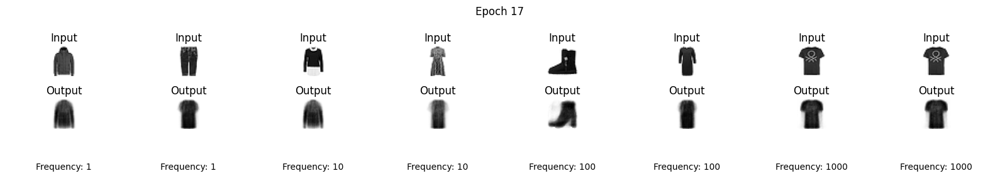

1/1 [==============================] - 0s 22ms/step


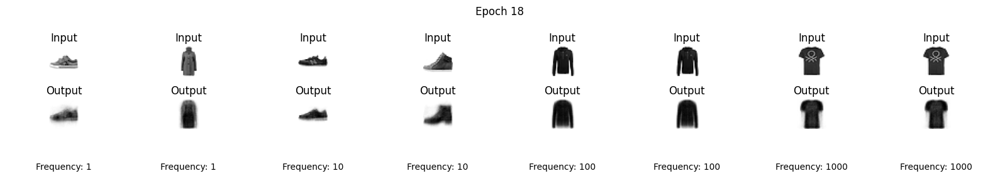

1/1 [==============================] - 0s 35ms/step


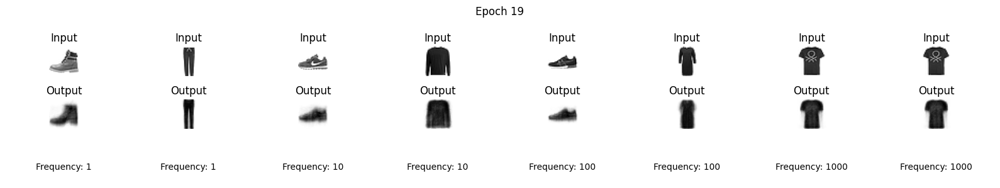

1/1 [==============================] - 0s 28ms/step


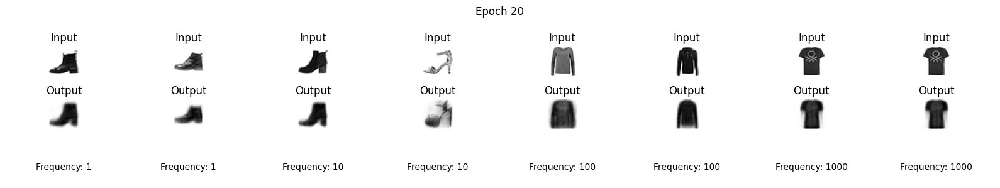

1/1 [==============================] - 0s 22ms/step


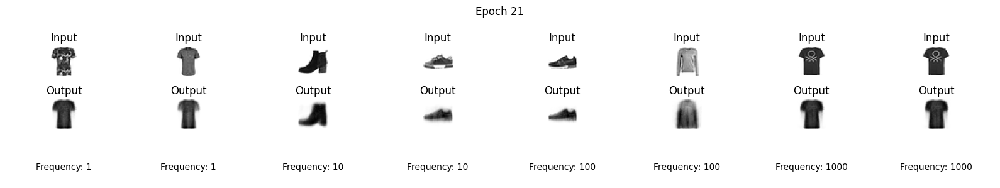

1/1 [==============================] - 0s 23ms/step


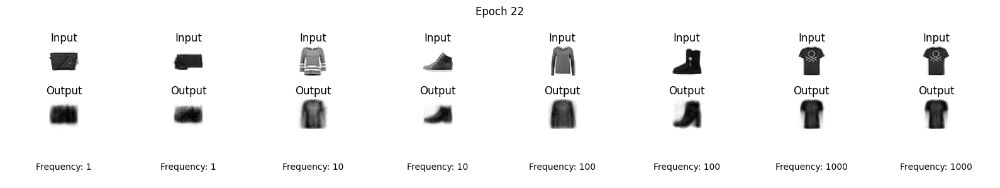

1/1 [==============================] - 0s 32ms/step


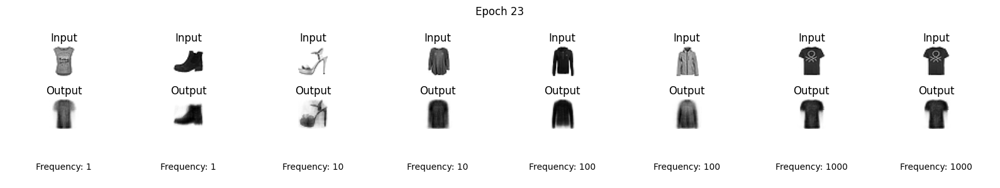

1/1 [==============================] - 0s 26ms/step


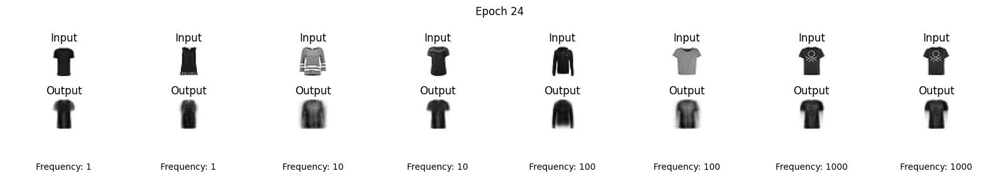

1/1 [==============================] - 0s 21ms/step


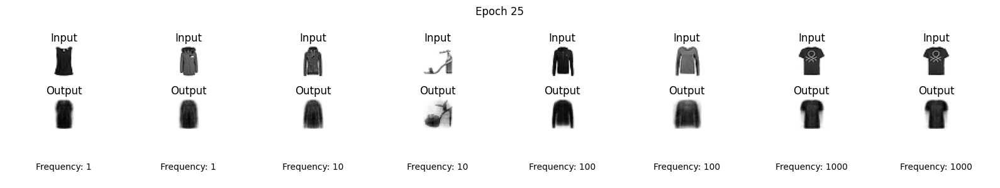

1/1 [==============================] - 0s 22ms/step


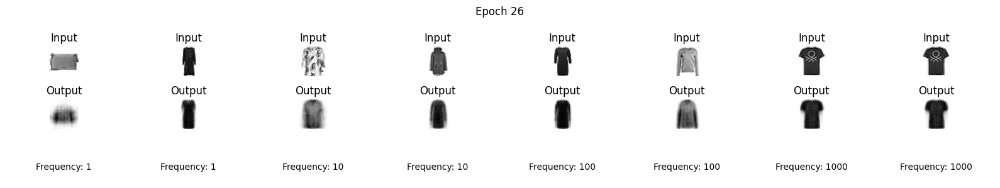

1/1 [==============================] - 0s 49ms/step


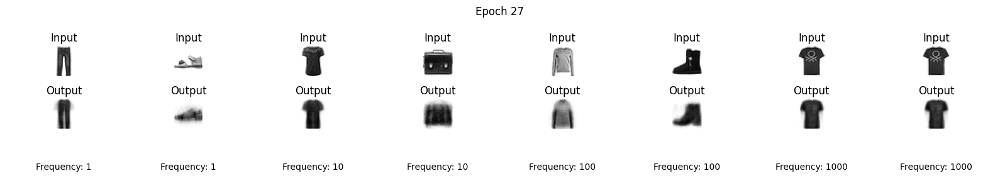

1/1 [==============================] - 0s 21ms/step


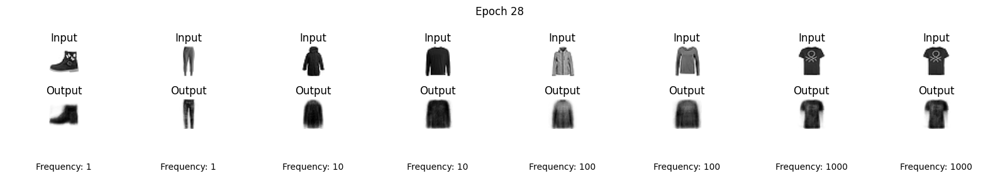

1/1 [==============================] - 0s 20ms/step


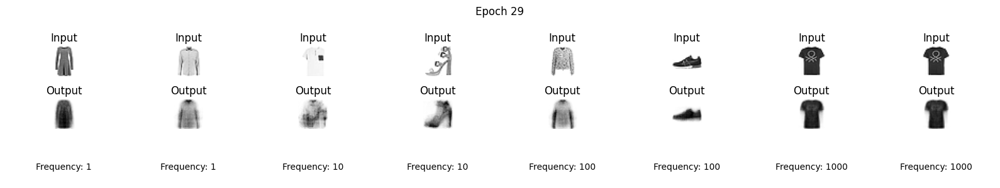

1/1 [==============================] - 0s 27ms/step


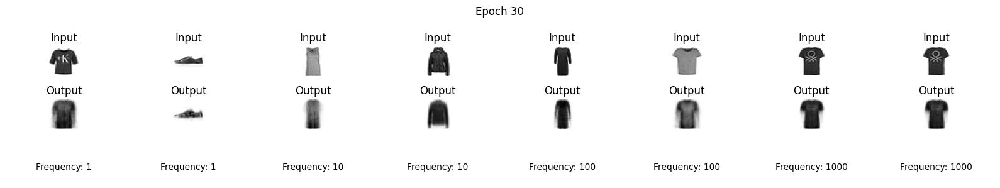

1/1 [==============================] - 0s 32ms/step


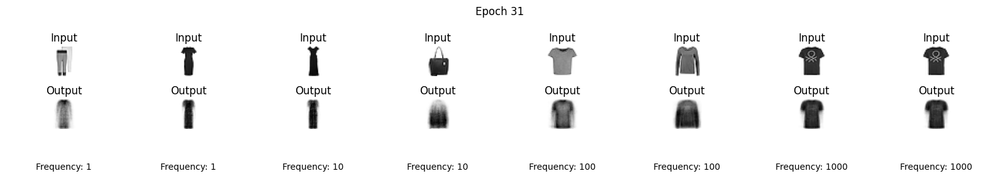

1/1 [==============================] - 0s 21ms/step


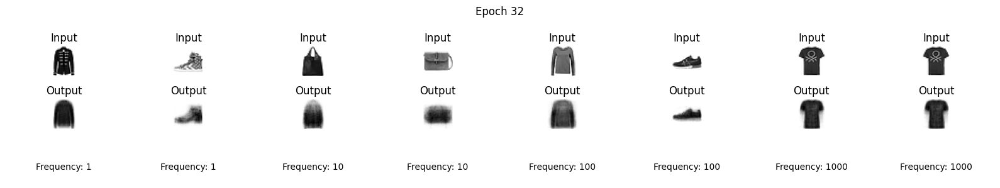

1/1 [==============================] - 0s 28ms/step


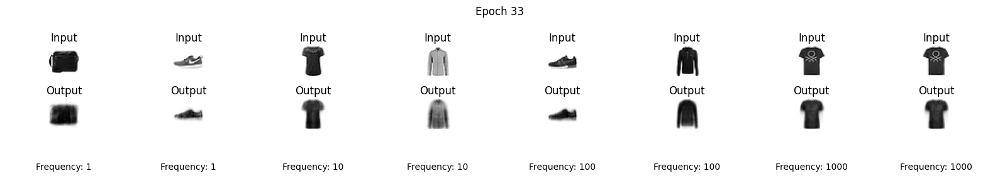

1/1 [==============================] - 0s 37ms/step


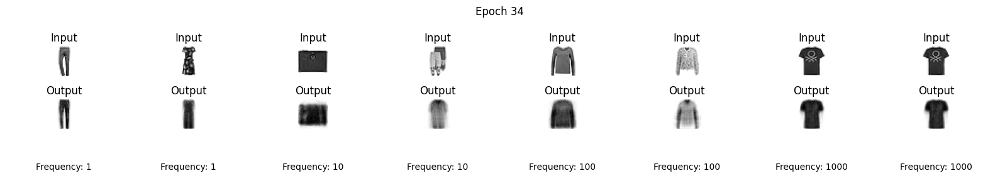

1/1 [==============================] - 0s 37ms/step


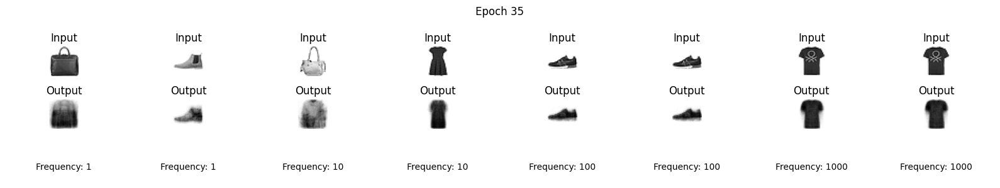

1/1 [==============================] - 0s 22ms/step


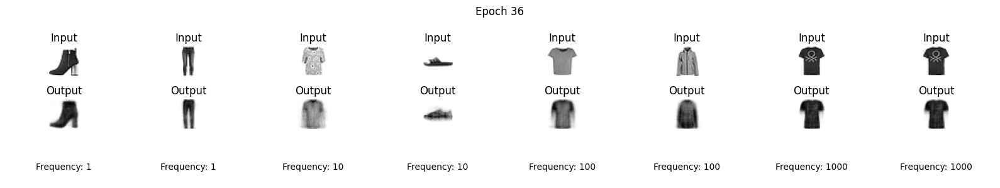

1/1 [==============================] - 0s 22ms/step


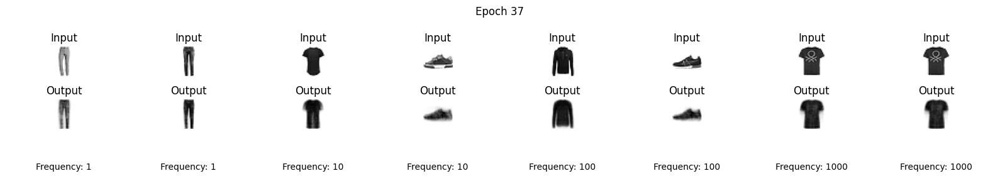

1/1 [==============================] - 0s 31ms/step


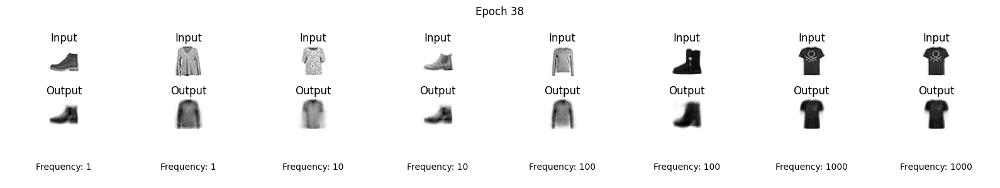

1/1 [==============================] - 0s 25ms/step


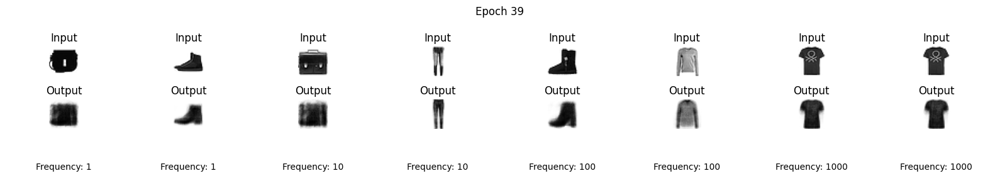

1/1 [==============================] - 0s 30ms/step


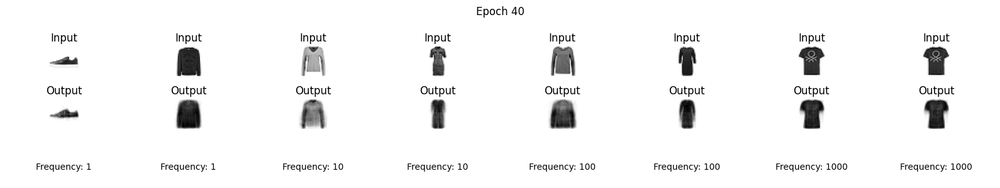

1/1 [==============================] - 0s 30ms/step


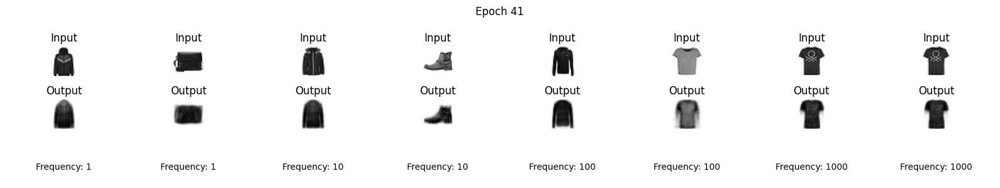

1/1 [==============================] - 0s 39ms/step


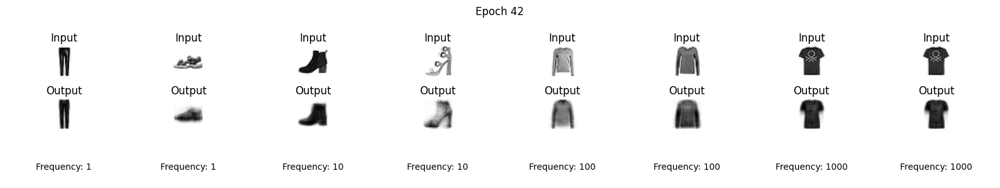

1/1 [==============================] - 0s 29ms/step


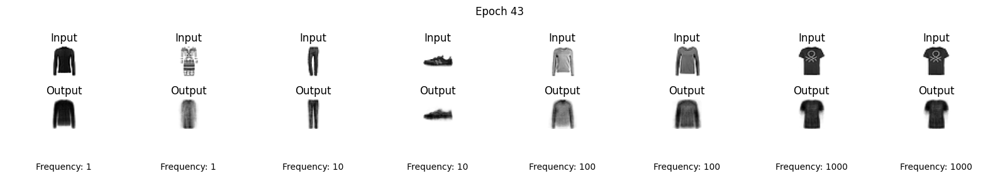

1/1 [==============================] - 0s 26ms/step


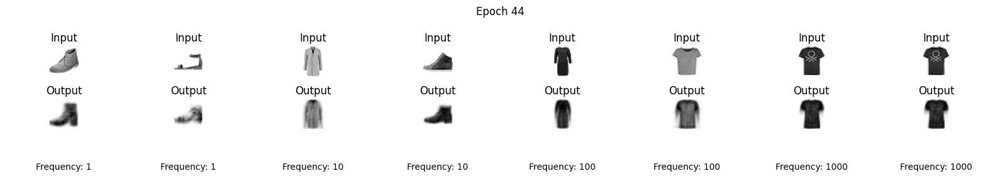

1/1 [==============================] - 0s 44ms/step


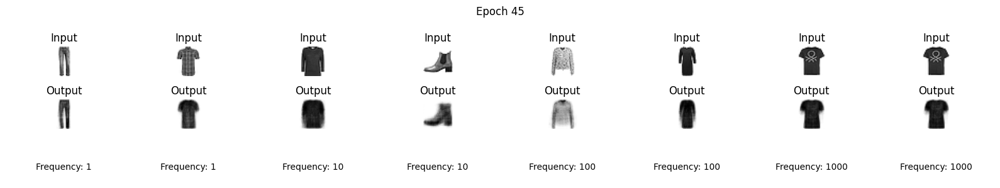

1/1 [==============================] - 0s 29ms/step


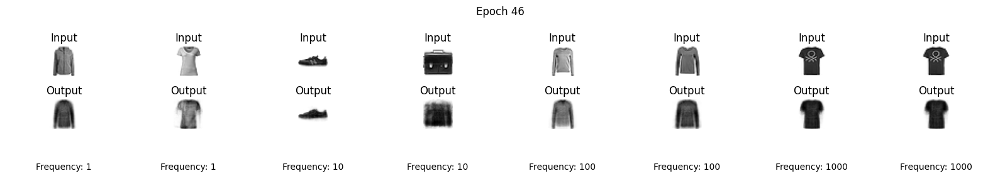

1/1 [==============================] - 0s 31ms/step


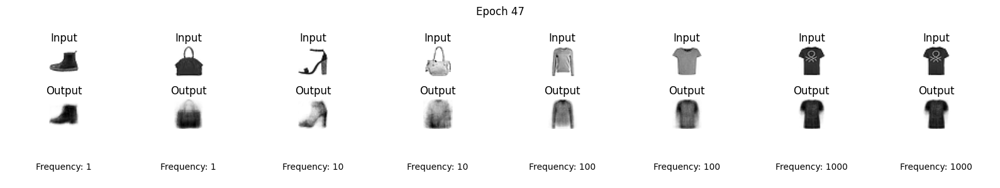

1/1 [==============================] - 0s 33ms/step


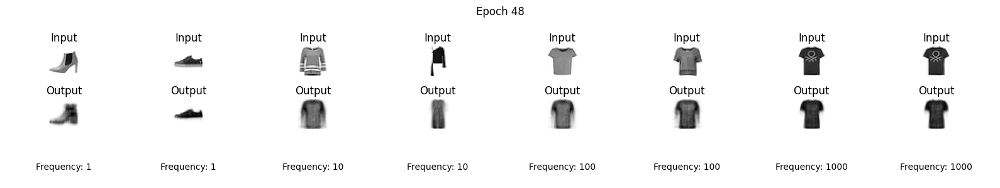

1/1 [==============================] - 0s 44ms/step


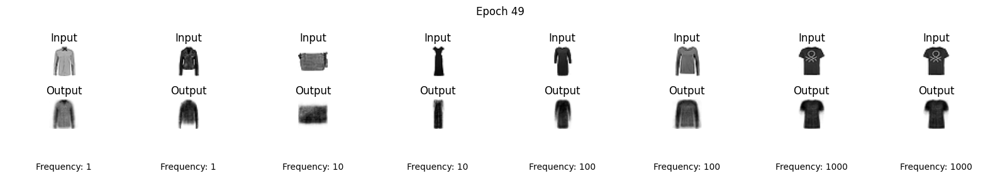

1/1 [==============================] - 0s 38ms/step


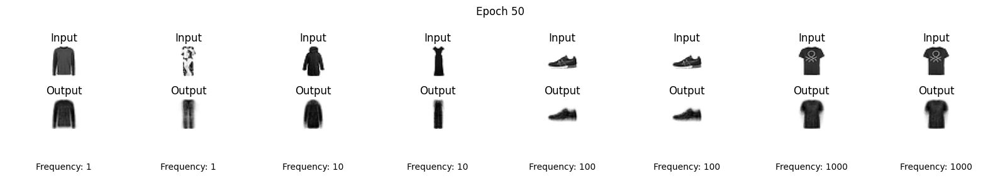

In [ ]:
EPOCHS = 50
EXAMPLES = 8

image_id = list(np.random.choice(range(10000), 1111, replace=False))

# Create a frequency dictionary
freq_dict = {img: 1000 for img in image_id[0:1]}
freq_dict.update({img: 100 for img in image_id[1:11]})
freq_dict.update({img: 10 for img in image_id[11:111]})
freq_dict.update({img: 1 for img in image_id[111:1111]})

# Separate image_ids based on their frequencies
image_ids_freq_1 = [image_id for image_id in image_id[111:1111]]
image_ids_freq_10 = [image_id for image_id in image_id[11:111]]
image_ids_freq_100 = [image_id for image_id in image_id[1:11]]
image_ids_freq_1000 = [image_id for image_id in image_id[0:1]]

# Create separate training sets for each frequency group
freq_train_1 = x_train[np.array([img for img in image_ids_freq_1])]
freq_train_10 = x_train[np.array([img for img in image_ids_freq_10])]
freq_train_100 = x_train[np.array([img for img in image_ids_freq_100])]
freq_train_1000 = x_train[np.array([img for img in image_ids_freq_1000])]

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(3, EXAMPLES, figsize=(EXAMPLES * 2, 3))  # Change to 3 rows

    # Pick 2 random images from each frequency group
    rand_ids = np.concatenate([
        np.random.choice(image_ids_freq_1, 2),
        np.random.choice(image_ids_freq_10, 2),
        np.random.choice(image_ids_freq_100, 2),
        np.random.choice(image_ids_freq_1000, 2)
    ])

    rand = x_test[rand_ids].reshape((EXAMPLES, 1, 28, 28))

    for j in range(EXAMPLES):
        # Get the image ID and the frequency of the image from the dictionary
        image_id = rand_ids[j]
        freq = freq_dict[image_id]

        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")

        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

        # Display the frequency
        axs[2, j].text(0.5, 0.5, f"Frequency: {freq}", ha='center', va='center')
        axs[2,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()

    # Train the model separately on each frequency group
    model.fit(freq_train_1, freq_train_1, verbose=0)
    model.fit(freq_train_10, freq_train_10, verbose=0)
    model.fit(freq_train_100, freq_train_100, verbose=0)
    model.fit(freq_train_1000, freq_train_1000, verbose=0)


Damaging the CA3 and CA1

In [ ]:
encoder = Sequential([
    Flatten(input_shape = (28, 28)), # Sensory neurons convert raw data into something processable by the brain
    Dense(784), # Temporal Cortex
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(384), # Dentate Gyrus
    ReLU(),
    Dense(10), # CA3
    ReLU(),
    Hippocampus() # Apply L1 penalty to the activations of the neurons; Encourages processing of most important features
])
decoder = Sequential([
    Dense(10, input_shape = (10,)), # CA1
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(784), # Temporal Cortex
    Activation("sigmoid"),
    Reshape((28, 28))
])
img = Input(shape = (28, 28))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile(optimizer=Adam(), loss = "mean_squared_error")

1/1 [==============================] - 0s 67ms/step


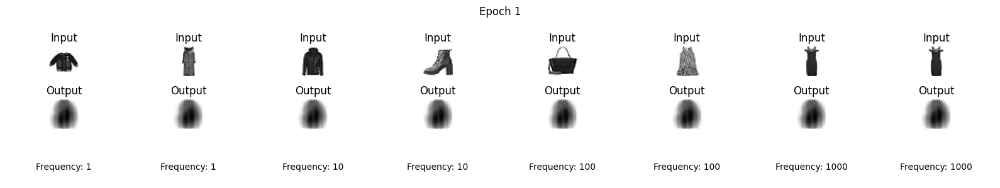

1/1 [==============================] - 0s 22ms/step


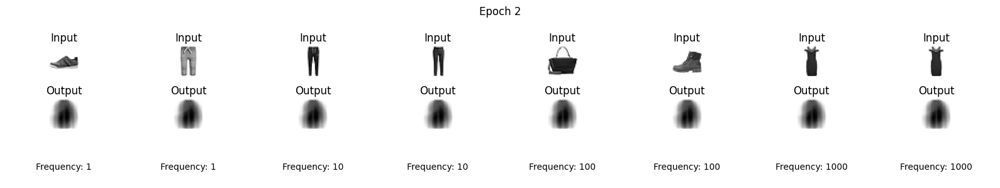

1/1 [==============================] - 0s 21ms/step


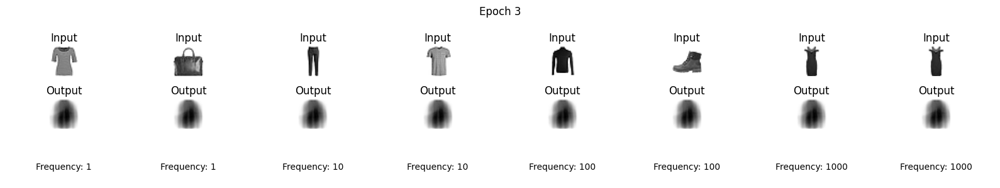

1/1 [==============================] - 0s 21ms/step


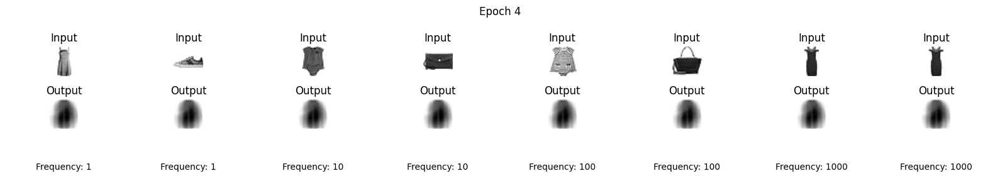

1/1 [==============================] - 0s 36ms/step


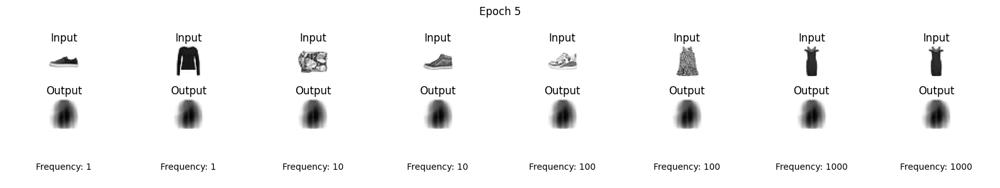

1/1 [==============================] - 0s 33ms/step


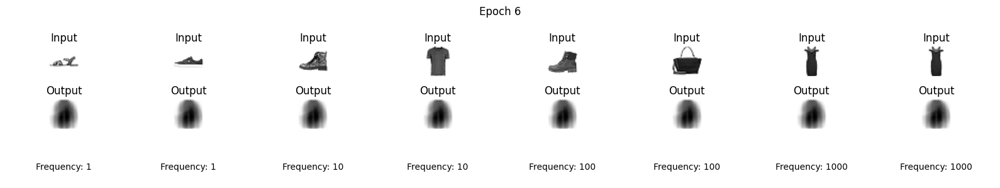

1/1 [==============================] - 0s 21ms/step


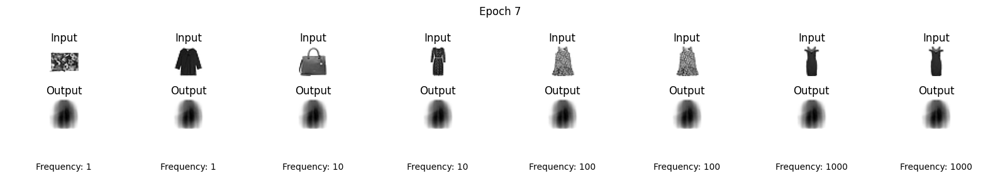

1/1 [==============================] - 0s 24ms/step


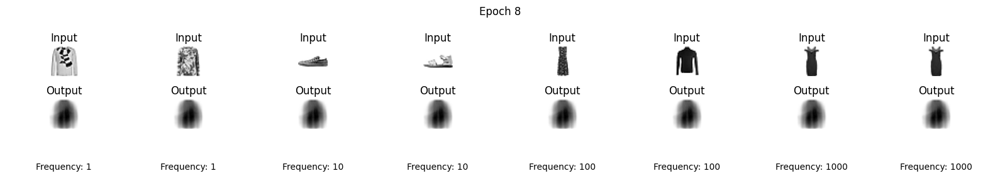

1/1 [==============================] - 0s 21ms/step


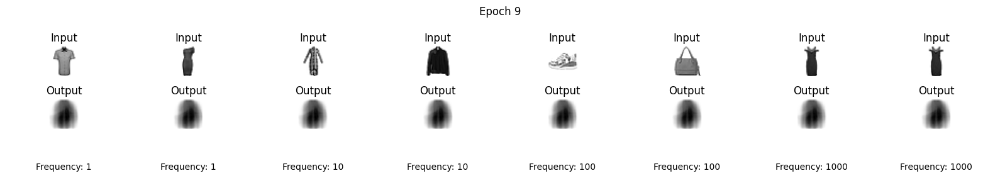

1/1 [==============================] - 0s 36ms/step


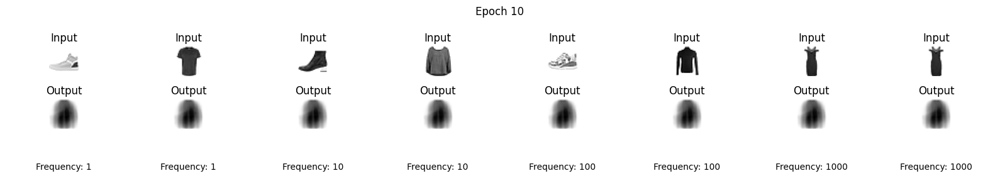

1/1 [==============================] - 0s 32ms/step


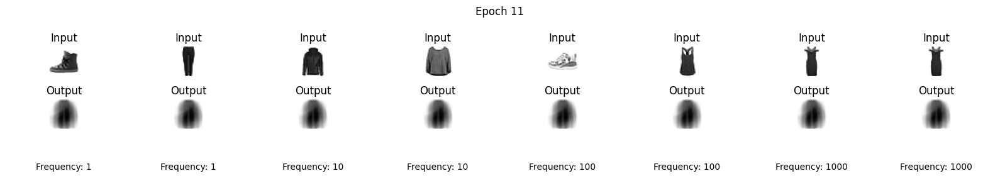

1/1 [==============================] - 0s 32ms/step


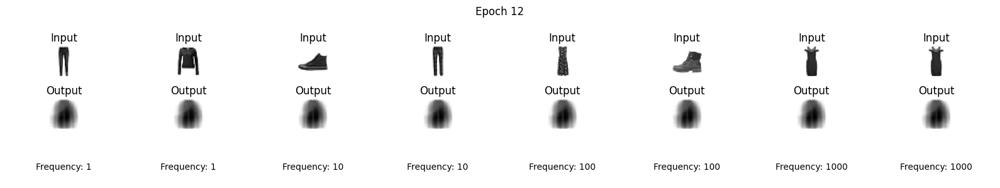

1/1 [==============================] - 0s 23ms/step


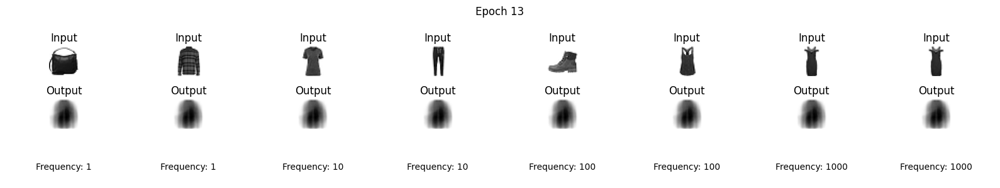

1/1 [==============================] - 0s 34ms/step


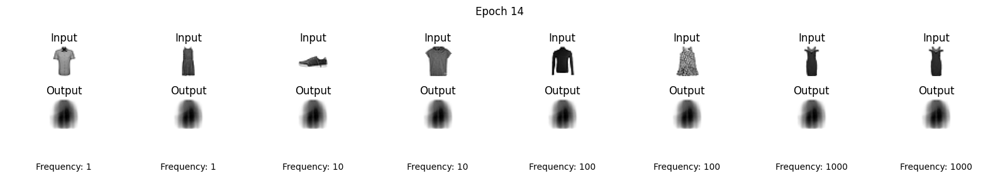

1/1 [==============================] - 0s 24ms/step


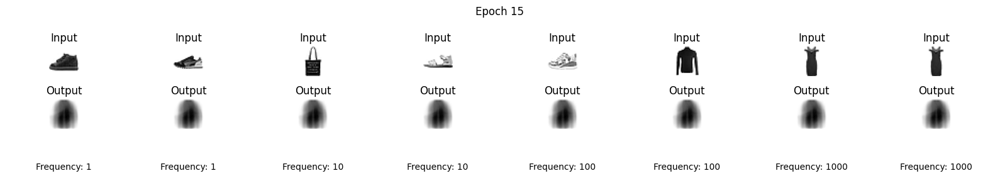

1/1 [==============================] - 0s 24ms/step


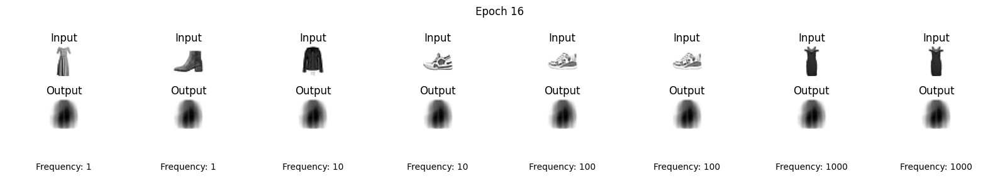

1/1 [==============================] - 0s 44ms/step


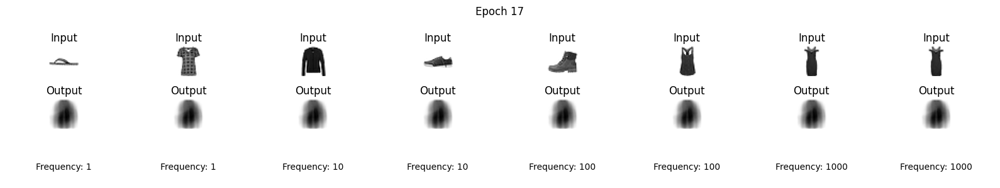

1/1 [==============================] - 0s 21ms/step


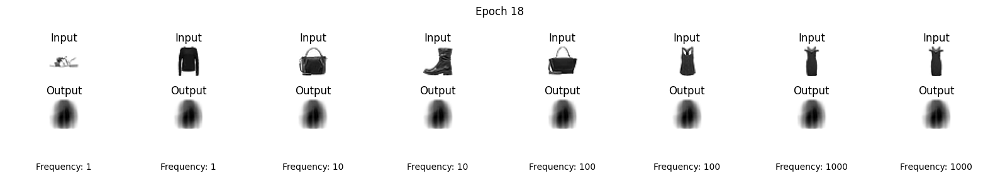

1/1 [==============================] - 0s 21ms/step


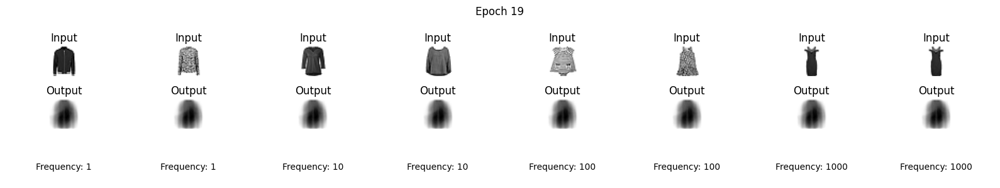

1/1 [==============================] - 0s 23ms/step


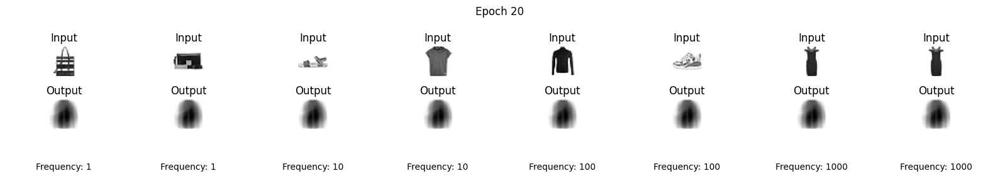

1/1 [==============================] - 0s 31ms/step


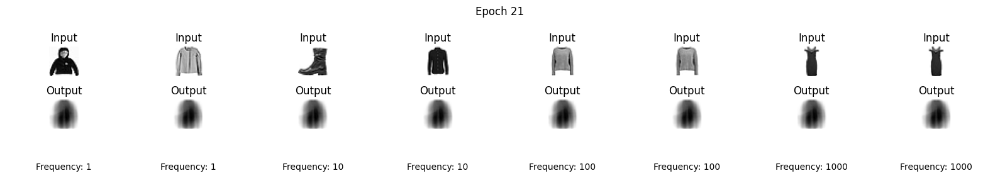

1/1 [==============================] - 0s 22ms/step


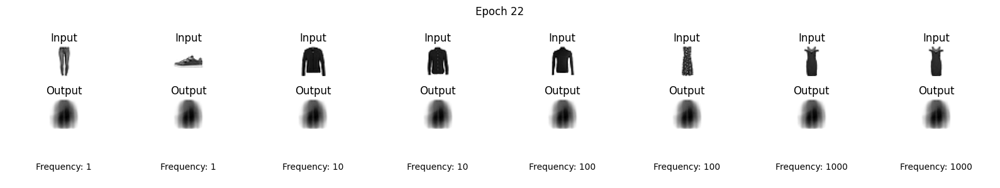

1/1 [==============================] - 0s 23ms/step


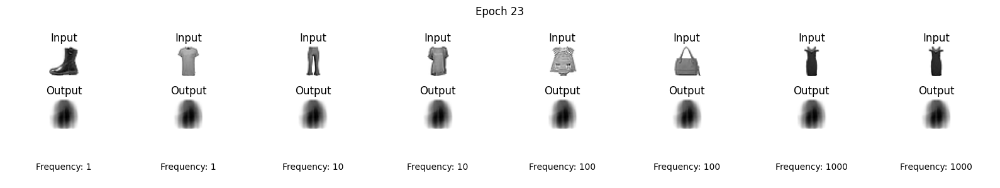

1/1 [==============================] - 0s 24ms/step


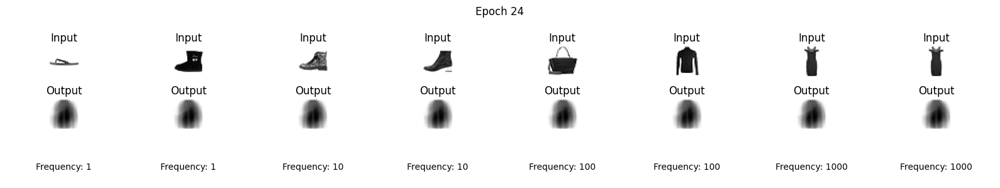

1/1 [==============================] - 0s 50ms/step


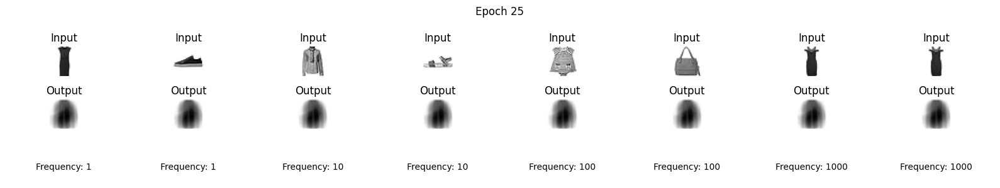

1/1 [==============================] - 0s 23ms/step


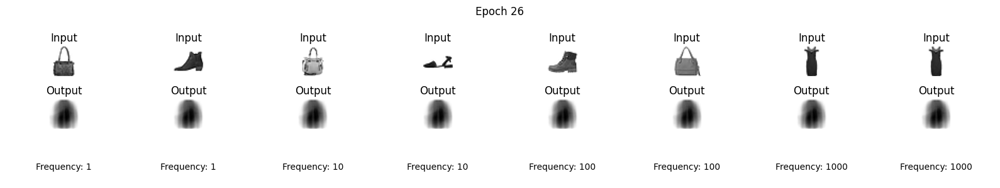

1/1 [==============================] - 0s 23ms/step


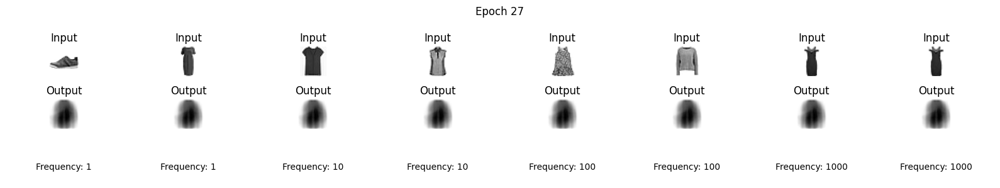

1/1 [==============================] - 0s 22ms/step


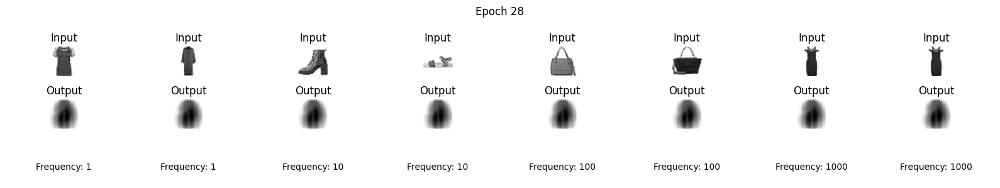

1/1 [==============================] - 0s 33ms/step


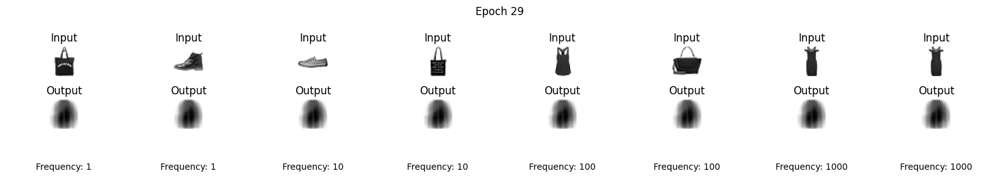

1/1 [==============================] - 0s 24ms/step


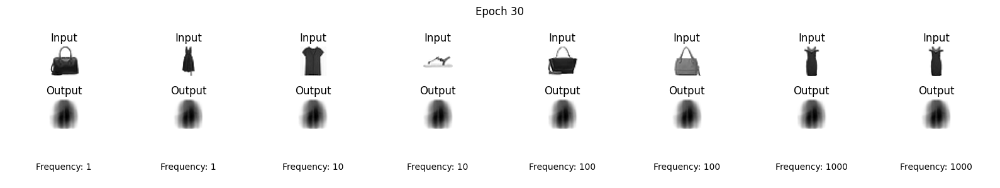

1/1 [==============================] - 0s 20ms/step


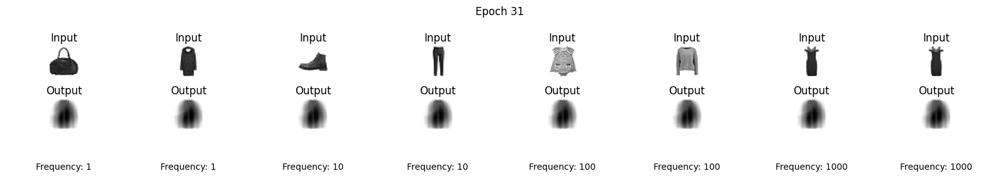

1/1 [==============================] - 0s 24ms/step


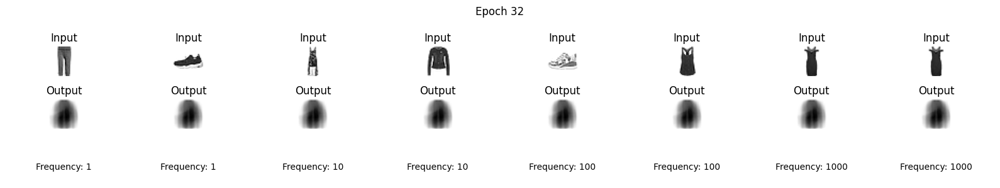

1/1 [==============================] - 0s 25ms/step


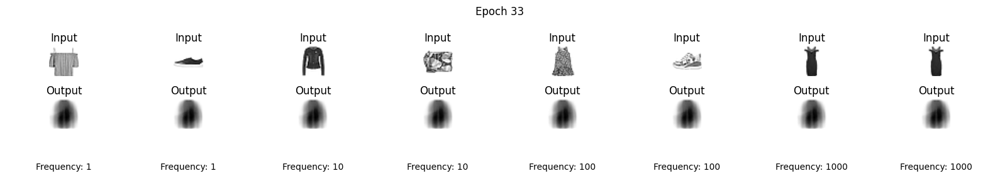

1/1 [==============================] - 0s 23ms/step


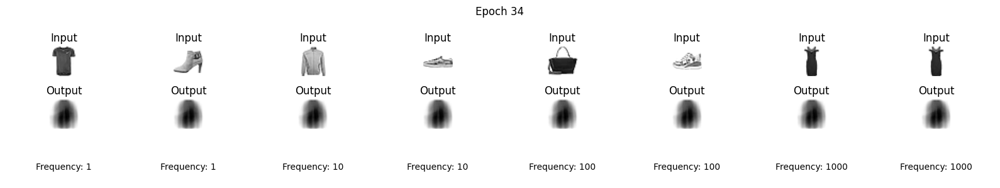

1/1 [==============================] - 0s 24ms/step


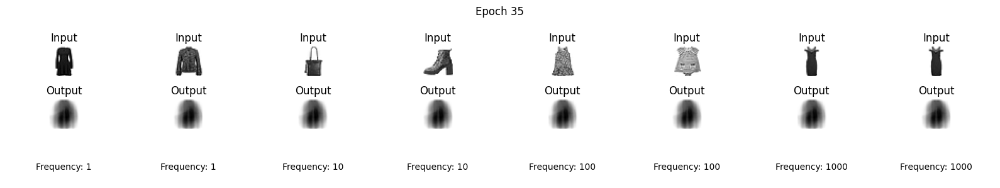

1/1 [==============================] - 0s 31ms/step


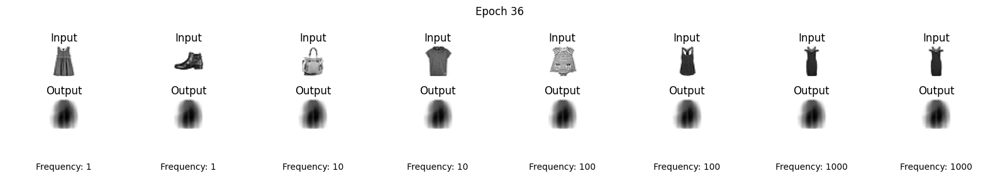

1/1 [==============================] - 0s 22ms/step


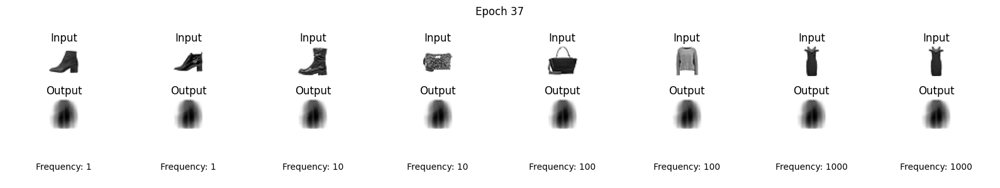

1/1 [==============================] - 0s 22ms/step


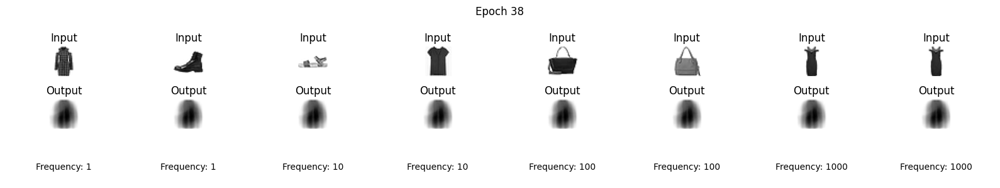

1/1 [==============================] - 0s 23ms/step


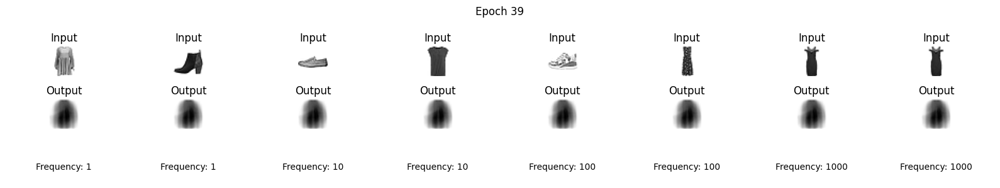

1/1 [==============================] - 0s 29ms/step


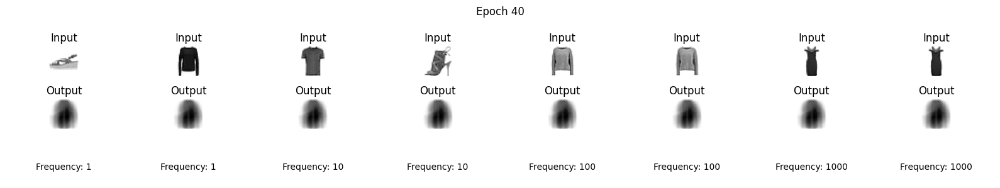

1/1 [==============================] - 0s 26ms/step


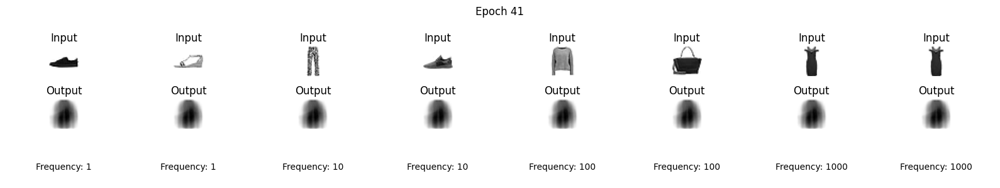

1/1 [==============================] - 0s 26ms/step


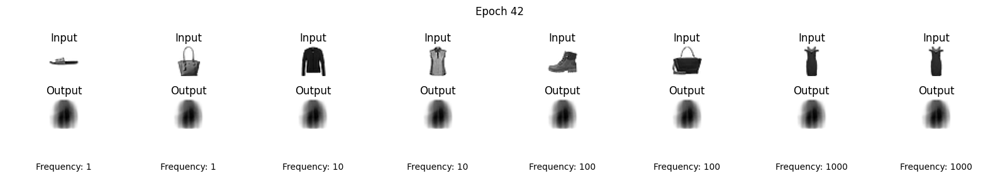

1/1 [==============================] - 0s 23ms/step


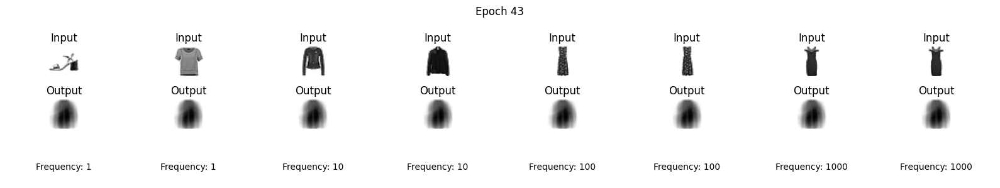

1/1 [==============================] - 0s 22ms/step


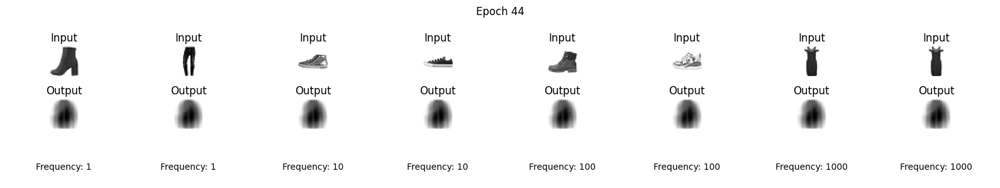

1/1 [==============================] - 0s 24ms/step


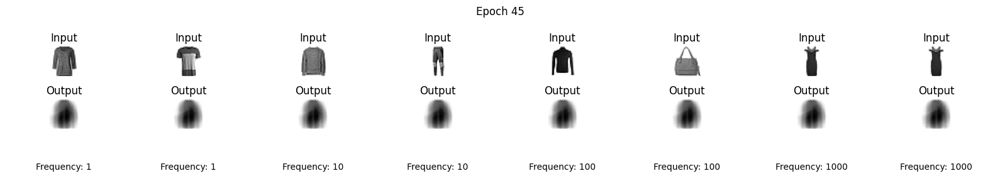

1/1 [==============================] - 0s 24ms/step


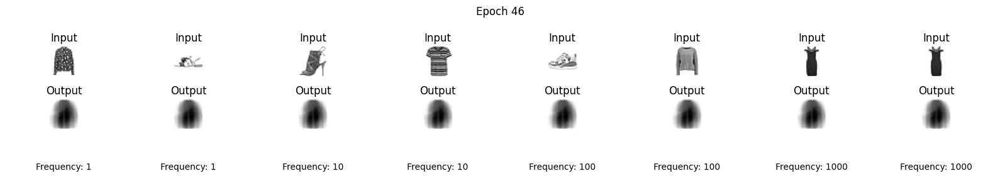

1/1 [==============================] - 0s 47ms/step


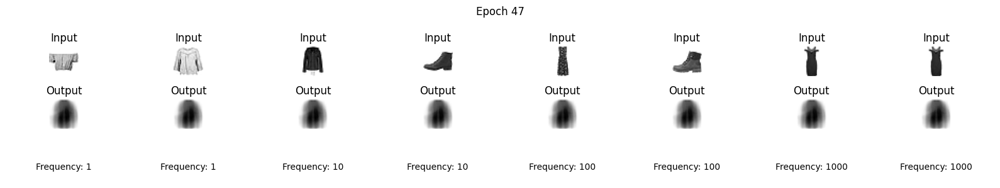

1/1 [==============================] - 0s 22ms/step


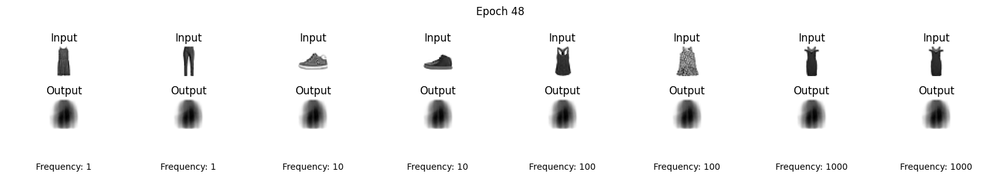

1/1 [==============================] - 0s 23ms/step


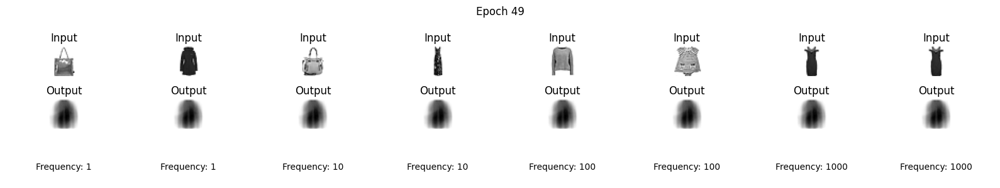

1/1 [==============================] - 0s 28ms/step


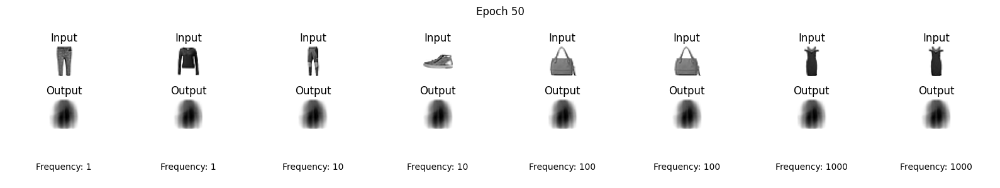

1/1 [==============================] - 0s 56ms/step


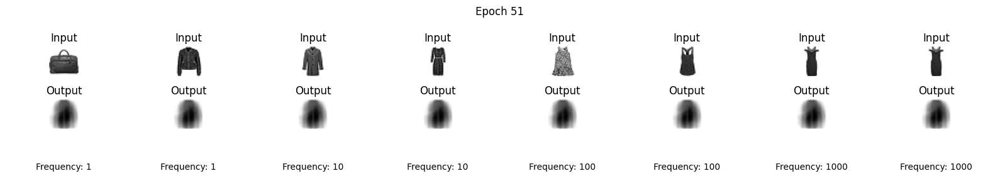

1/1 [==============================] - 0s 28ms/step


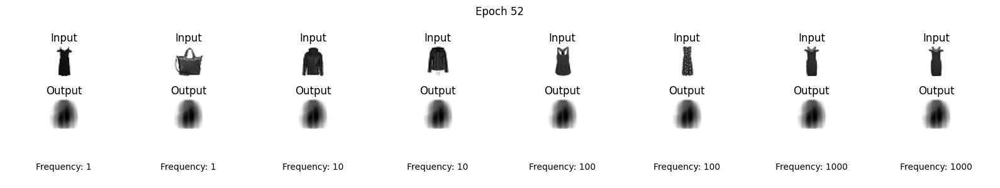

1/1 [==============================] - 0s 26ms/step


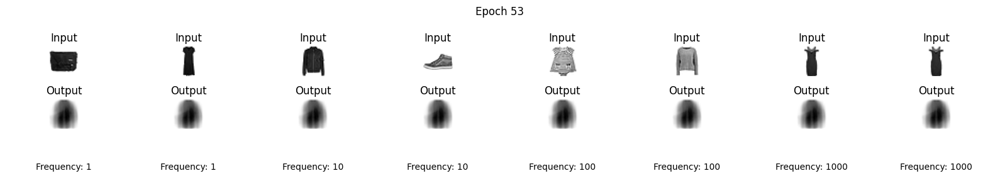

1/1 [==============================] - 0s 25ms/step


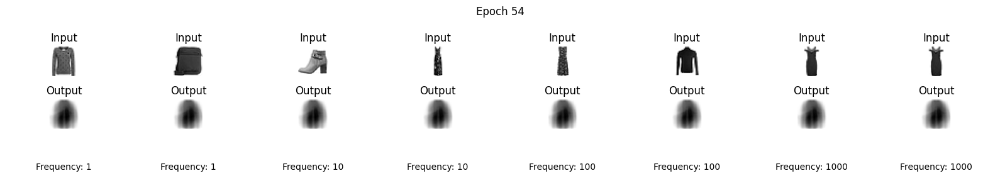

1/1 [==============================] - 0s 37ms/step


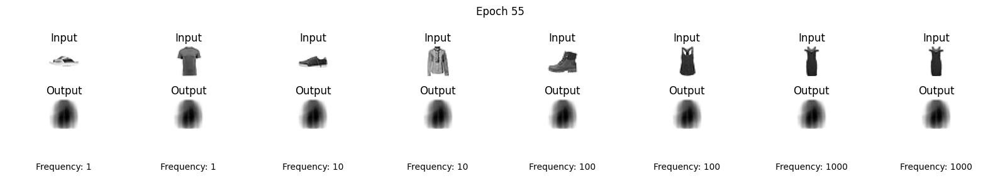

1/1 [==============================] - 0s 23ms/step


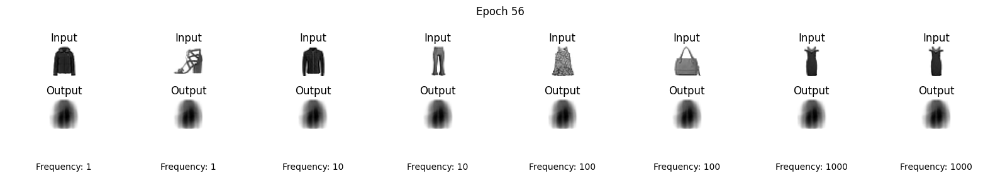

1/1 [==============================] - 0s 28ms/step


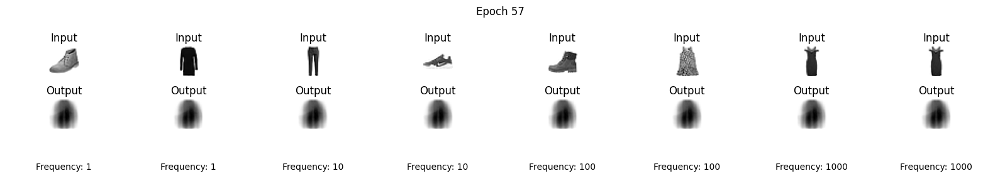

1/1 [==============================] - 0s 26ms/step


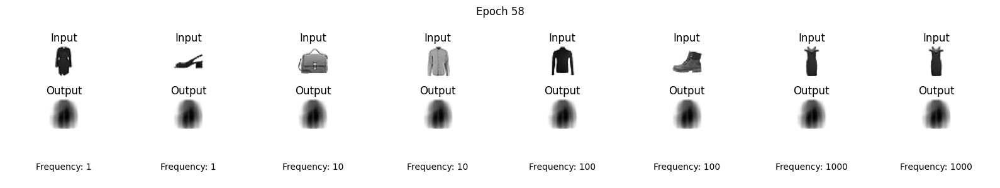

1/1 [==============================] - 0s 25ms/step


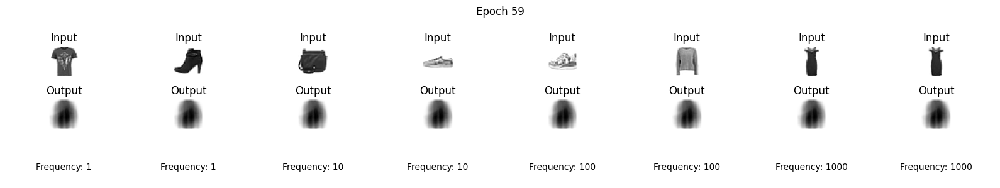

1/1 [==============================] - 0s 25ms/step


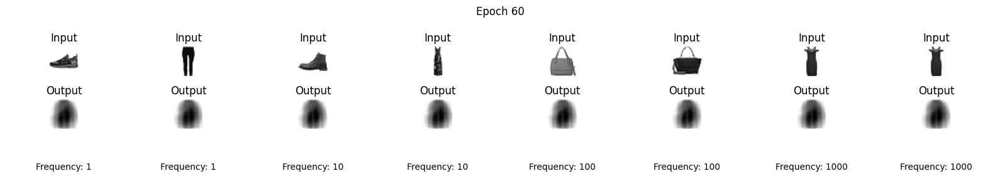

1/1 [==============================] - 0s 27ms/step


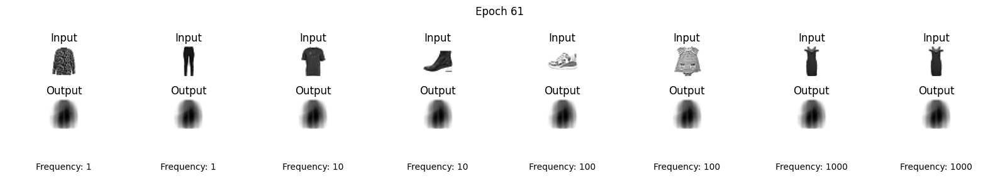

1/1 [==============================] - 0s 31ms/step


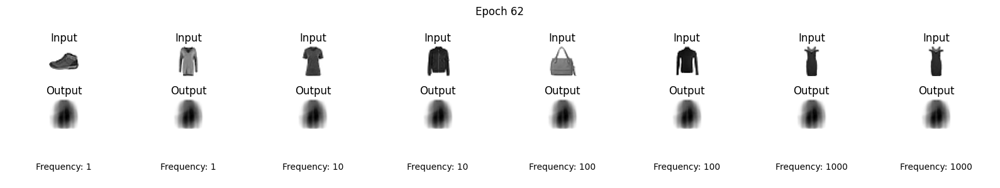

1/1 [==============================] - 0s 29ms/step


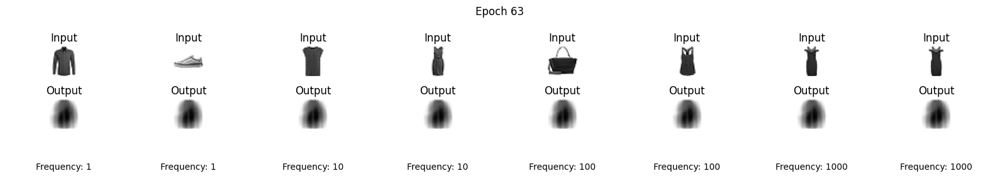

1/1 [==============================] - 0s 29ms/step


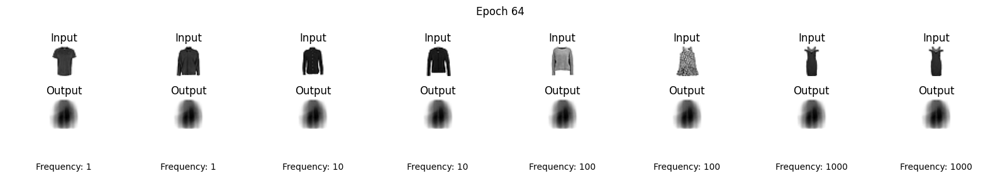

1/1 [==============================] - 0s 25ms/step


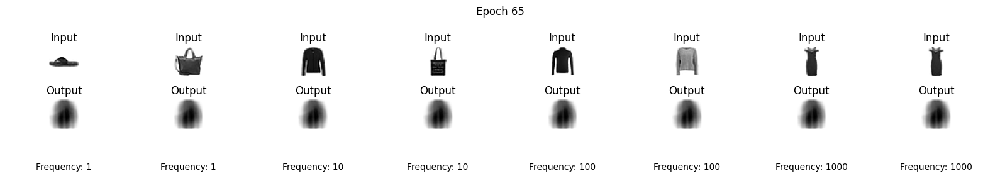

1/1 [==============================] - 0s 38ms/step


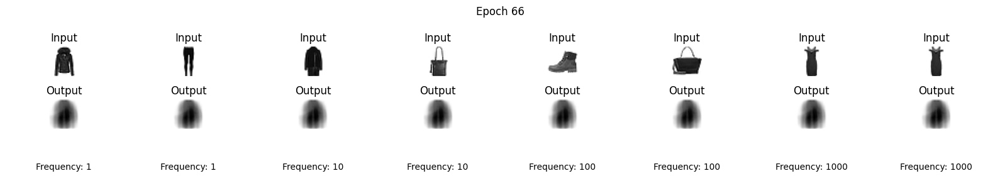

1/1 [==============================] - 0s 28ms/step


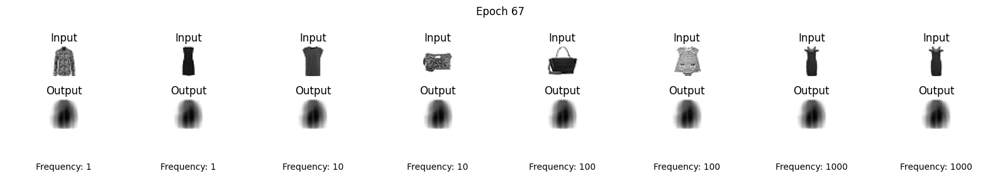

1/1 [==============================] - 0s 26ms/step


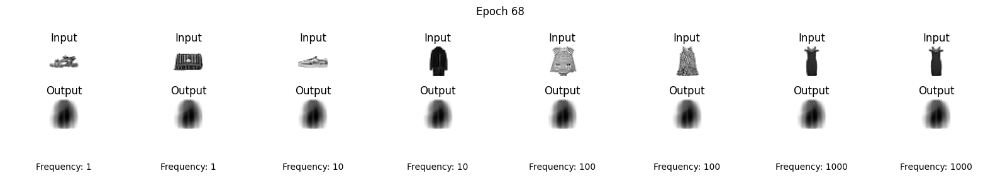

1/1 [==============================] - 0s 35ms/step


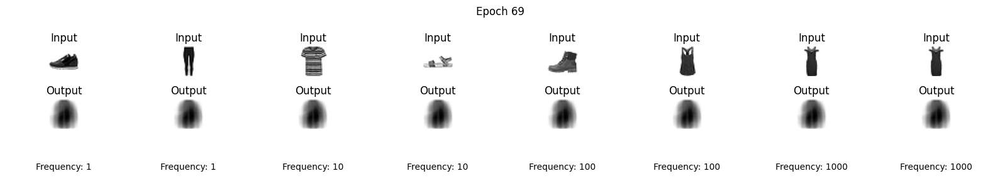

1/1 [==============================] - 0s 28ms/step


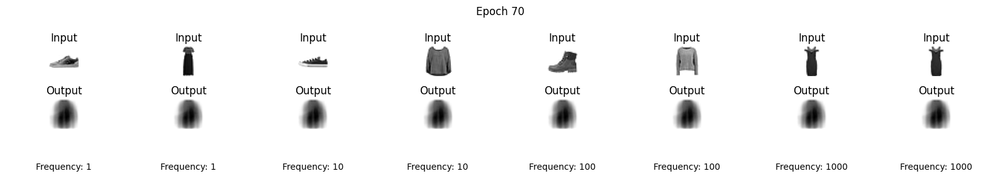

1/1 [==============================] - 0s 27ms/step


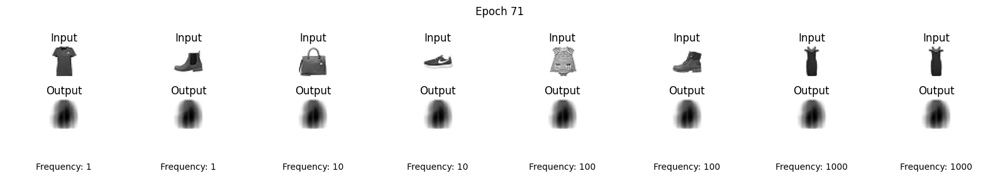

1/1 [==============================] - 0s 31ms/step


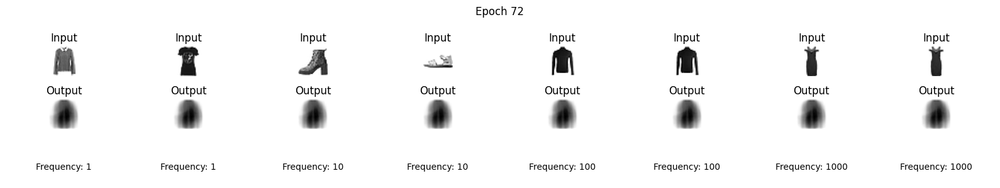

1/1 [==============================] - 0s 31ms/step


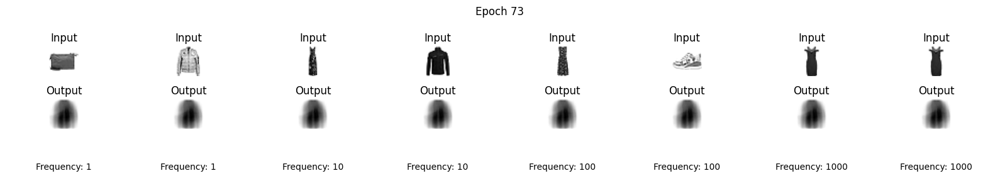

1/1 [==============================] - 0s 30ms/step


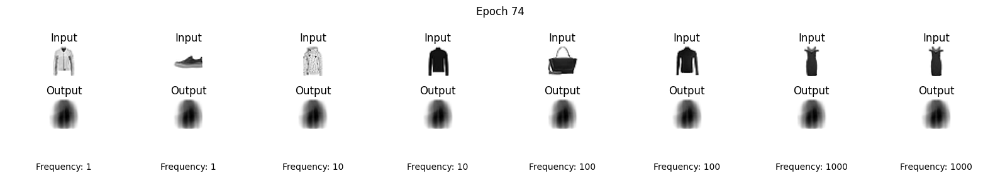

1/1 [==============================] - 0s 30ms/step


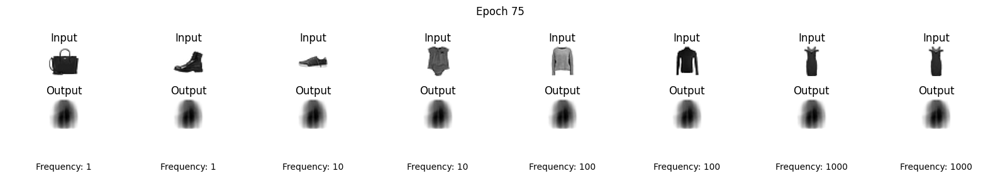

1/1 [==============================] - 0s 33ms/step


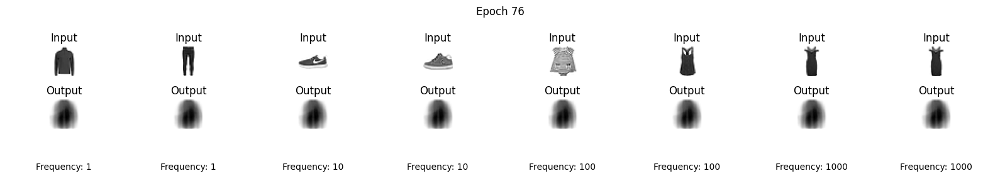

1/1 [==============================] - 0s 32ms/step


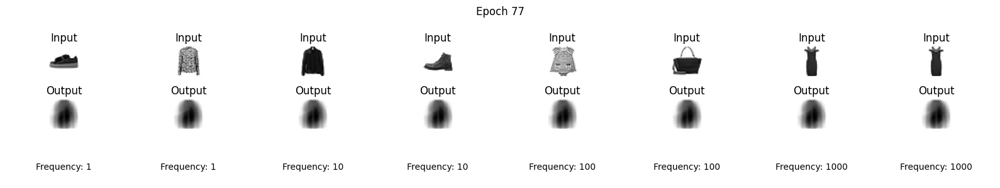

1/1 [==============================] - 0s 29ms/step


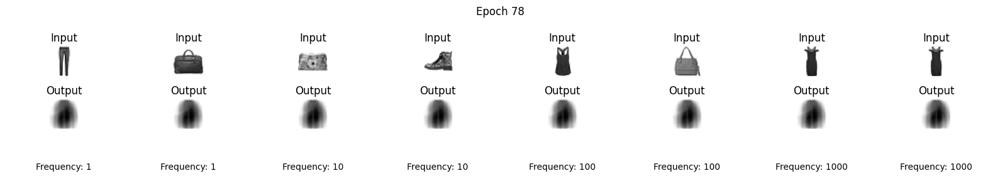

1/1 [==============================] - 0s 30ms/step


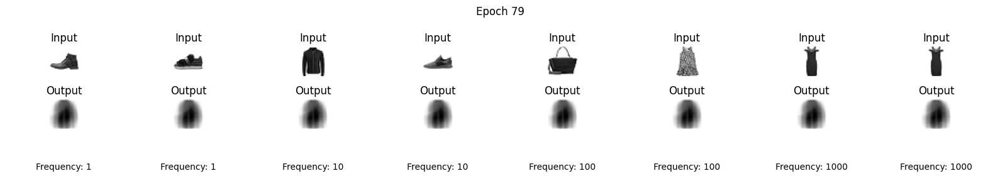

1/1 [==============================] - 0s 48ms/step


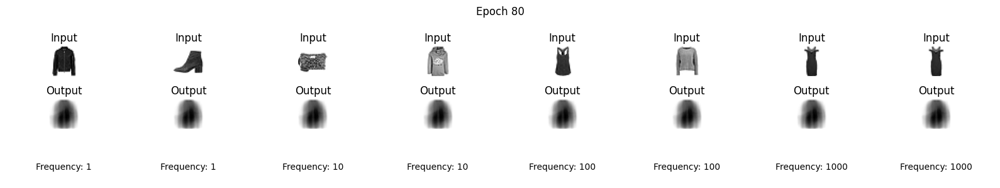

1/1 [==============================] - 0s 32ms/step


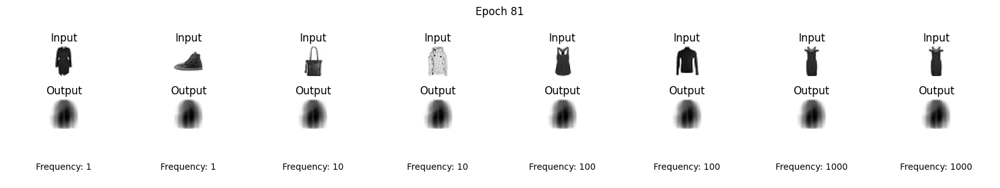

1/1 [==============================] - 0s 34ms/step


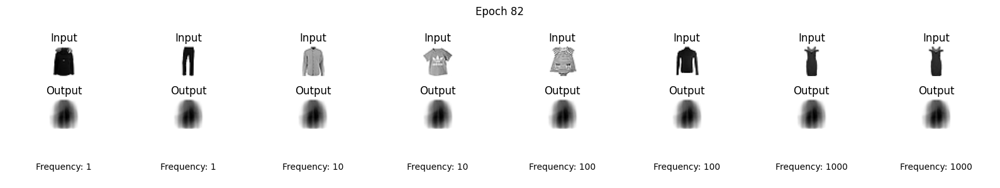

1/1 [==============================] - 0s 37ms/step


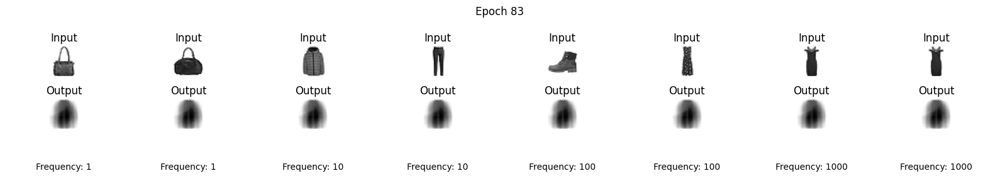

1/1 [==============================] - 0s 32ms/step


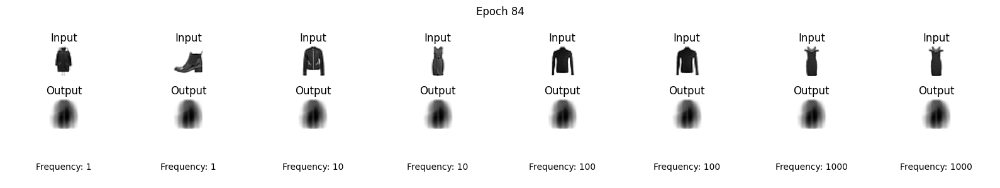

1/1 [==============================] - 0s 32ms/step


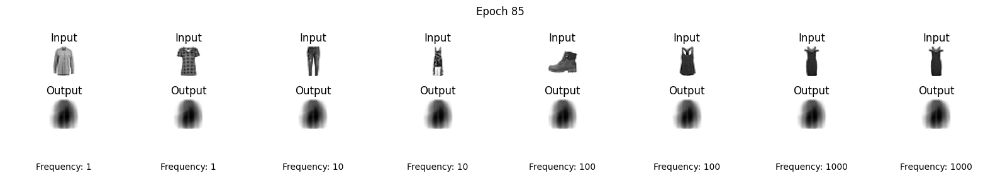

1/1 [==============================] - 0s 37ms/step


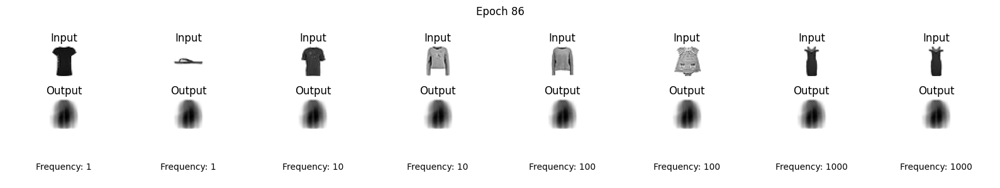

1/1 [==============================] - 0s 52ms/step


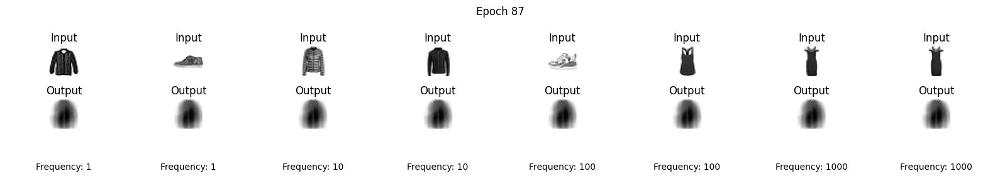

1/1 [==============================] - 0s 31ms/step


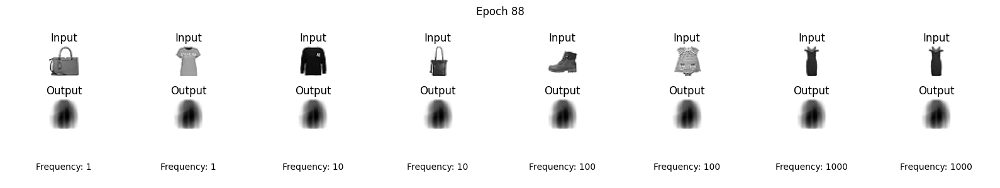

1/1 [==============================] - 0s 45ms/step


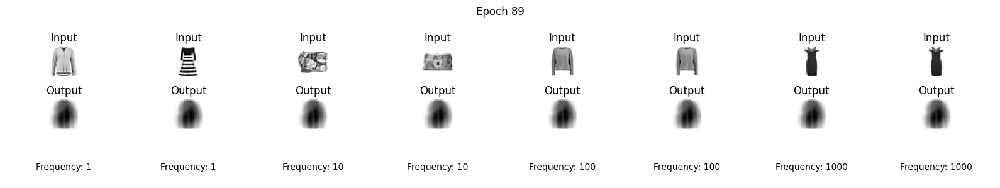

1/1 [==============================] - 0s 44ms/step


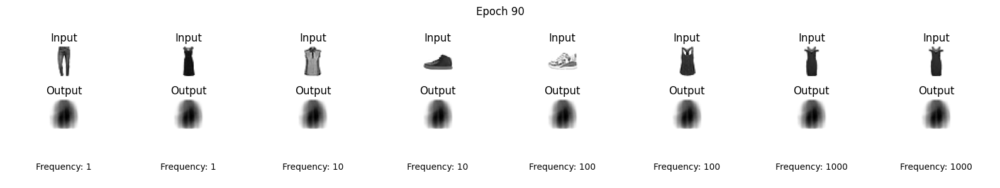

1/1 [==============================] - 0s 33ms/step


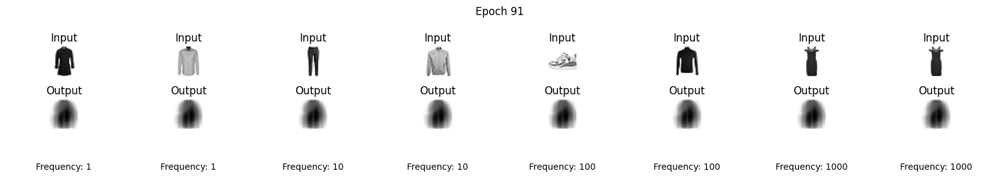

1/1 [==============================] - 0s 38ms/step


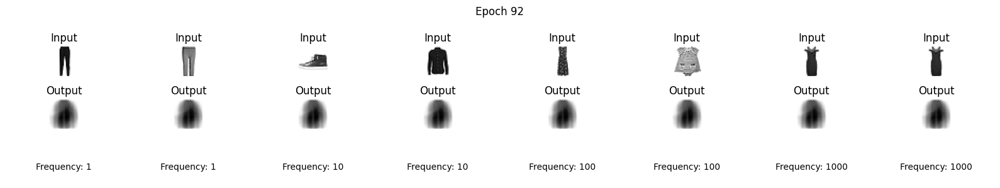

1/1 [==============================] - 0s 37ms/step


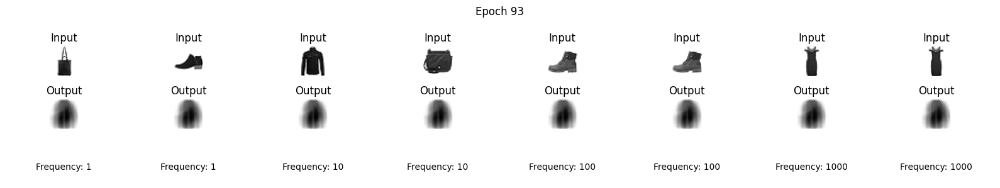

1/1 [==============================] - 0s 34ms/step


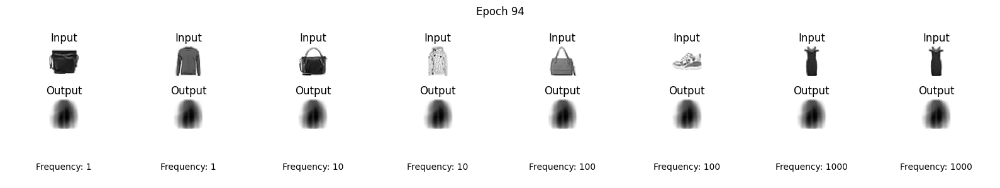

1/1 [==============================] - 0s 32ms/step


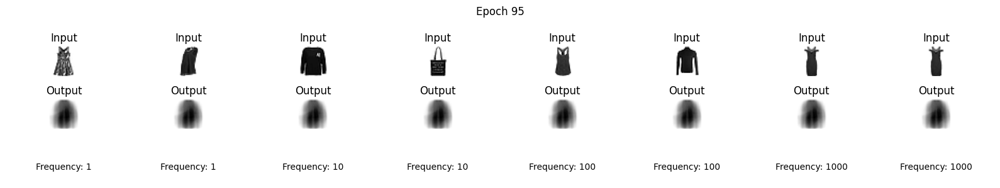

1/1 [==============================] - 0s 34ms/step


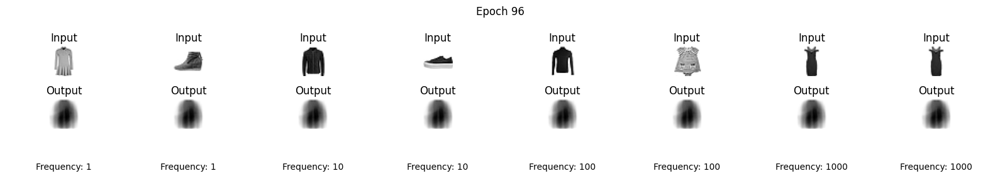

1/1 [==============================] - 0s 35ms/step


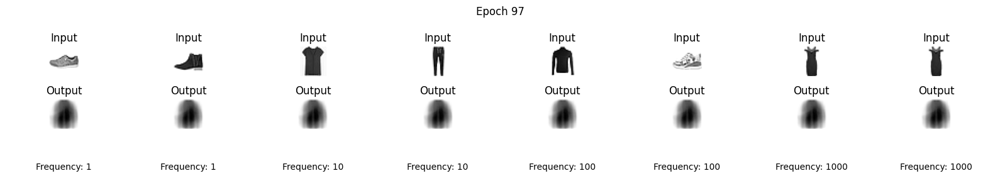

1/1 [==============================] - 0s 37ms/step


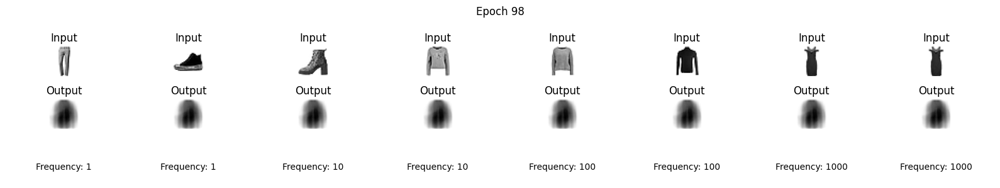

1/1 [==============================] - 0s 43ms/step


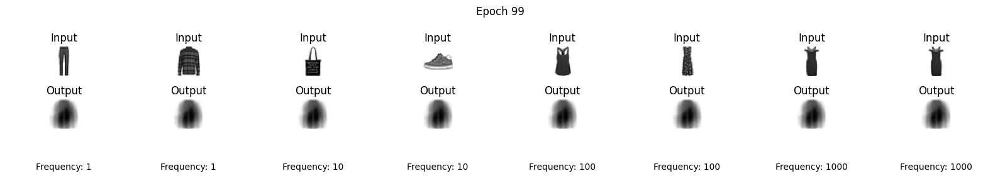

1/1 [==============================] - 0s 35ms/step


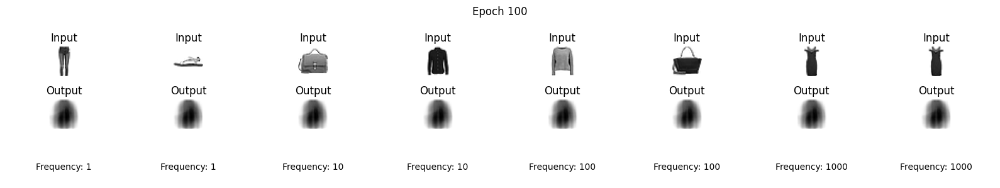

In [ ]:
EPOCHS = 50
EXAMPLES = 8

image_id = list(np.random.choice(range(10000), 1111, replace=False))

# Create a frequency dictionary
freq_dict = {img: 1000 for img in image_id[0:1]}
freq_dict.update({img: 100 for img in image_id[1:11]})
freq_dict.update({img: 10 for img in image_id[11:111]})
freq_dict.update({img: 1 for img in image_id[111:1111]})

# Separate image_ids based on their frequencies
image_ids_freq_1 = [image_id for image_id in image_id[111:1111]]
image_ids_freq_10 = [image_id for image_id in image_id[11:111]]
image_ids_freq_100 = [image_id for image_id in image_id[1:11]]
image_ids_freq_1000 = [image_id for image_id in image_id[0:1]]

# Create separate training sets for each frequency group
freq_train_1 = x_train[np.array([img for img in image_ids_freq_1])]
freq_train_10 = x_train[np.array([img for img in image_ids_freq_10])]
freq_train_100 = x_train[np.array([img for img in image_ids_freq_100])]
freq_train_1000 = x_train[np.array([img for img in image_ids_freq_1000])]

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(3, EXAMPLES, figsize=(EXAMPLES * 2, 3))  # Change to 3 rows

    # Pick 2 random images from each frequency group
    rand_ids = np.concatenate([
        np.random.choice(image_ids_freq_1, 2),
        np.random.choice(image_ids_freq_10, 2),
        np.random.choice(image_ids_freq_100, 2),
        np.random.choice(image_ids_freq_1000, 2)
    ])

    rand = x_test[rand_ids].reshape((EXAMPLES, 1, 28, 28))

    for j in range(EXAMPLES):
        # Get the image ID and the frequency of the image from the dictionary
        image_id = rand_ids[j]
        freq = freq_dict[image_id]

        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")

        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

        # Display the frequency
        axs[2, j].text(0.5, 0.5, f"Frequency: {freq}", ha='center', va='center')
        axs[2,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()

    # Train the model separately on each frequency group
    model.fit(freq_train_1, freq_train_1, verbose=0)
    model.fit(freq_train_10, freq_train_10, verbose=0)
    model.fit(freq_train_100, freq_train_100, verbose=0)
    model.fit(freq_train_1000, freq_train_1000, verbose=0)

Damaging the CA3

In [ ]:
encoder = Sequential([
    Flatten(input_shape = (28, 28)), # Sensory neurons convert raw data into something processable by the brain
    Dense(784), # Temporal Cortex
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(384), # Dentate Gyrus
    ReLU(),
    Dense(10), # CA3
    ReLU(),
    Hippocampus() # Apply L1 penalty to the activations of the neurons; Encourages processing of most important features
])
decoder = Sequential([
    Dense(384, input_shape = (10,)), # CA1
    ReLU(),
    Dense(512), # Entorhinal Cortex
    ReLU(),
    Dense(784), # Temporal Cortex
    Activation("sigmoid"),
    Reshape((28, 28))
])
img = Input(shape = (28, 28))
latent_vector = encoder(img)
output = decoder(latent_vector)
model = Model(inputs = img, outputs = output)
model.compile(optimizer=Adam(), loss = "mean_squared_error")

1/1 [==============================] - 0s 23ms/step


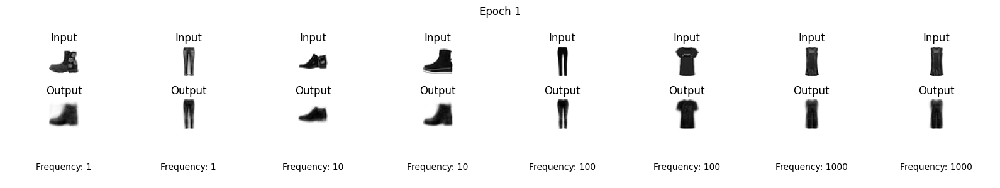

1/1 [==============================] - 0s 32ms/step


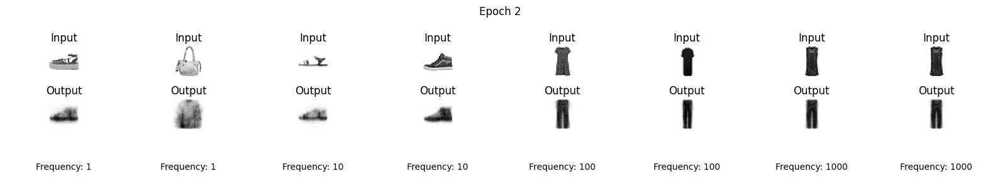

1/1 [==============================] - 0s 22ms/step


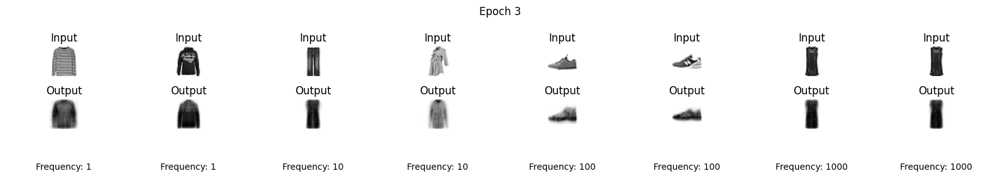

1/1 [==============================] - 0s 24ms/step


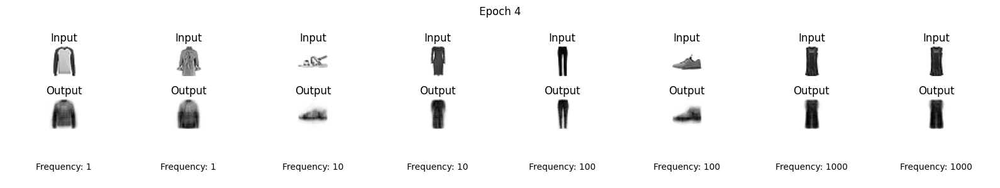

1/1 [==============================] - 0s 24ms/step


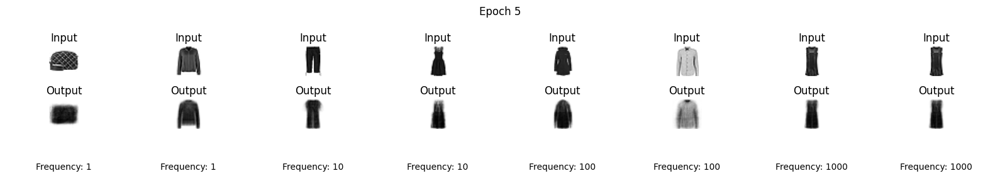

1/1 [==============================] - 0s 36ms/step


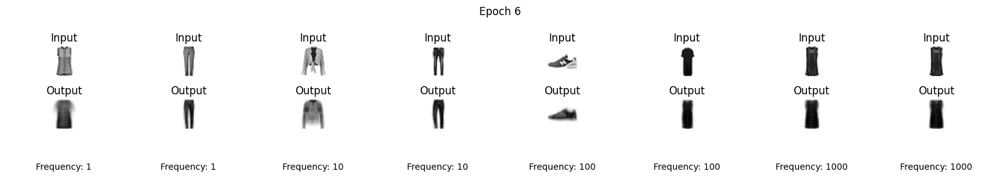

1/1 [==============================] - 0s 22ms/step


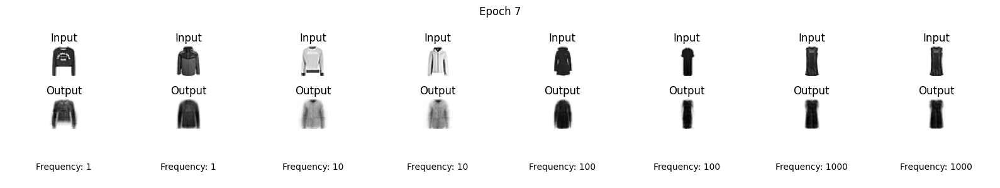

1/1 [==============================] - 0s 22ms/step


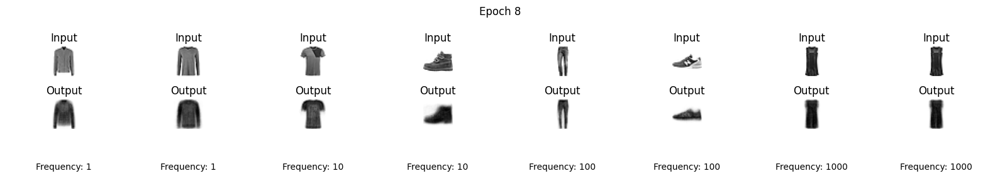

1/1 [==============================] - 0s 22ms/step


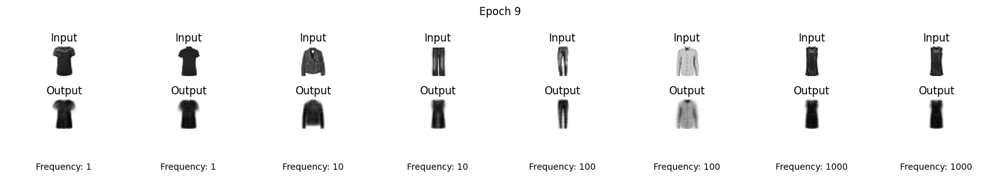

1/1 [==============================] - 0s 31ms/step


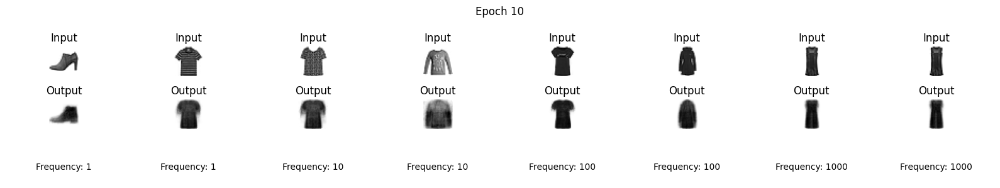

1/1 [==============================] - 0s 22ms/step


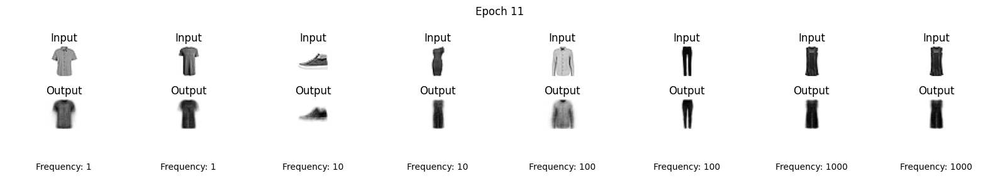

1/1 [==============================] - 0s 21ms/step


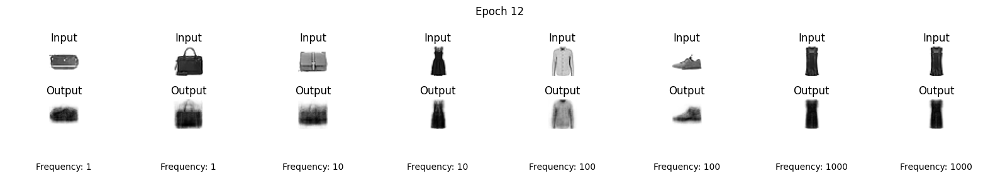

1/1 [==============================] - 0s 22ms/step


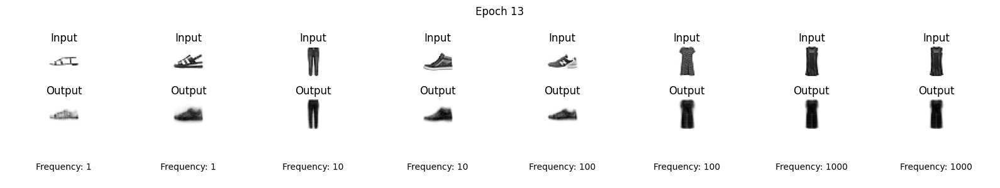

1/1 [==============================] - 0s 35ms/step


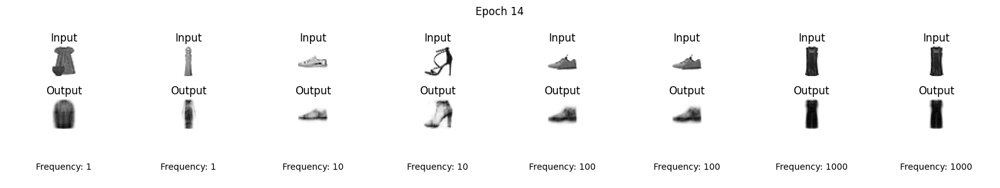

1/1 [==============================] - 0s 22ms/step


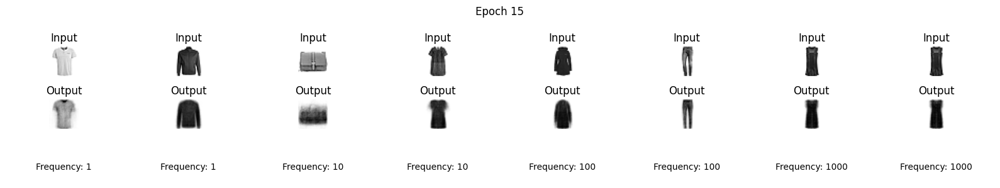

1/1 [==============================] - 0s 29ms/step


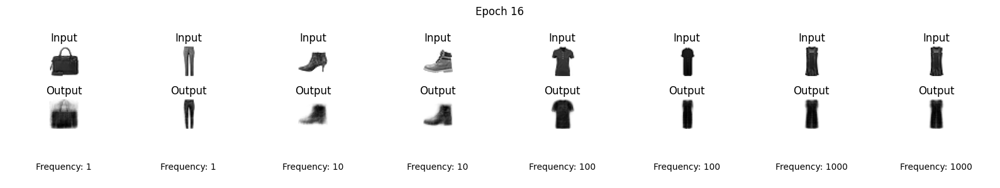

1/1 [==============================] - 0s 23ms/step


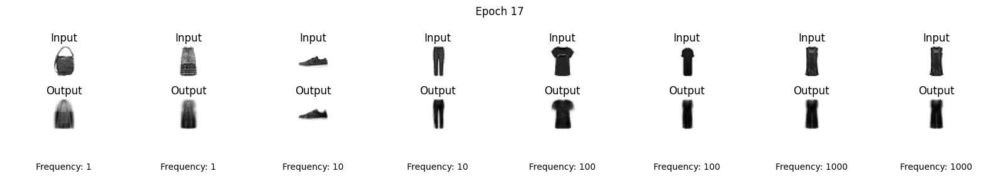

1/1 [==============================] - 0s 30ms/step


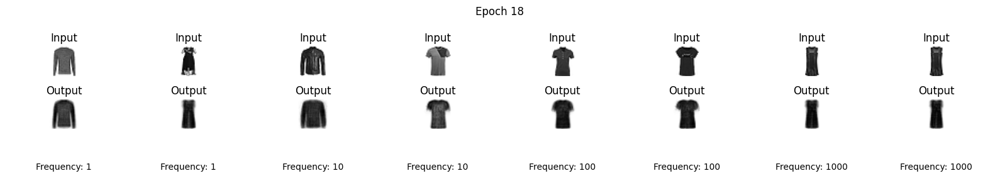

1/1 [==============================] - 0s 25ms/step


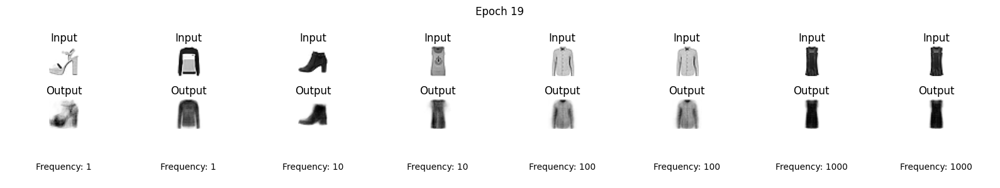

1/1 [==============================] - 0s 23ms/step


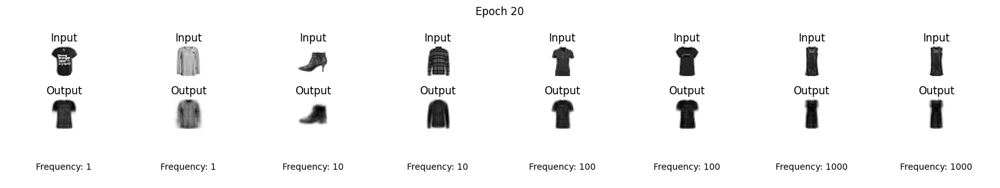

1/1 [==============================] - 0s 22ms/step


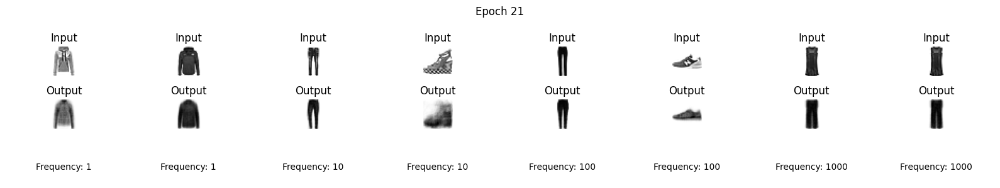

1/1 [==============================] - 0s 26ms/step


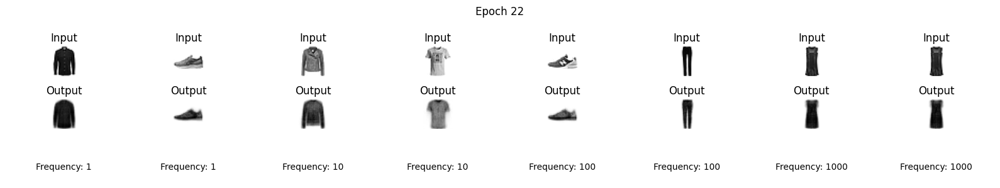

1/1 [==============================] - 0s 22ms/step


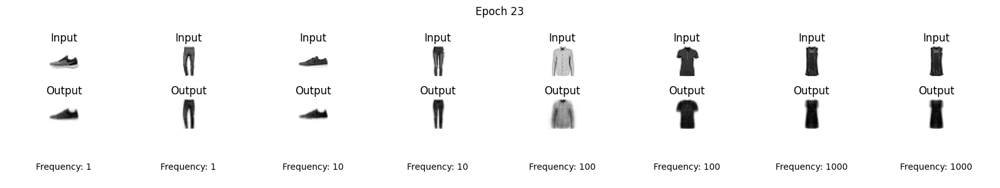

1/1 [==============================] - 0s 22ms/step


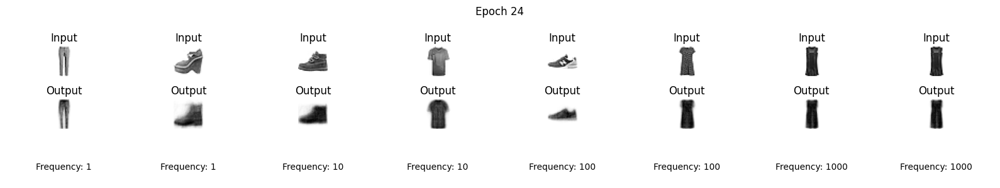

1/1 [==============================] - 0s 44ms/step


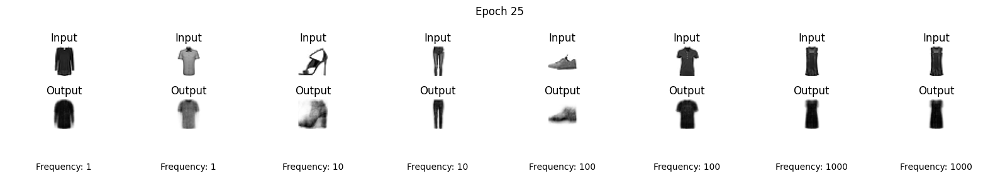

1/1 [==============================] - 0s 22ms/step


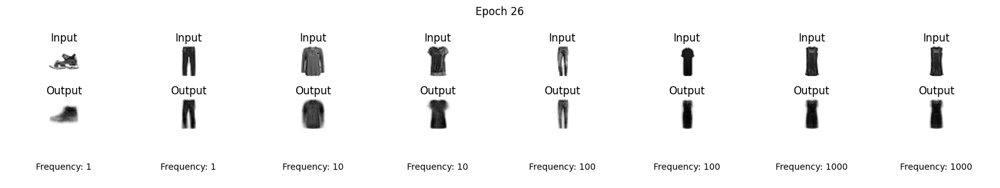

1/1 [==============================] - 0s 23ms/step


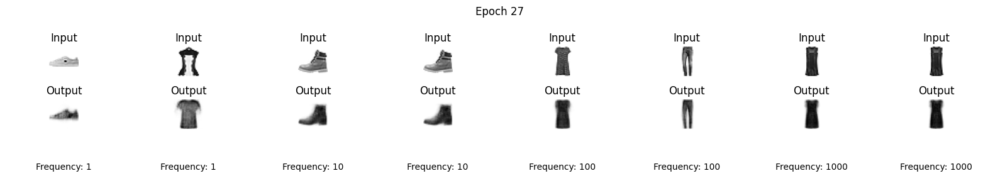

1/1 [==============================] - 0s 25ms/step


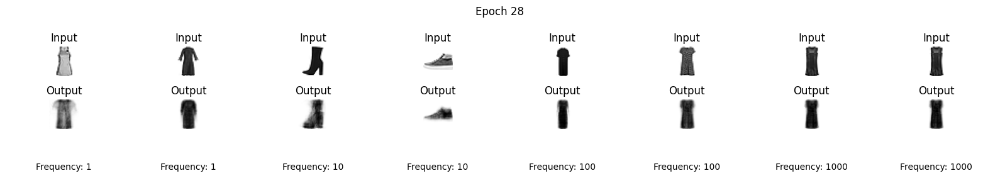

1/1 [==============================] - 0s 51ms/step


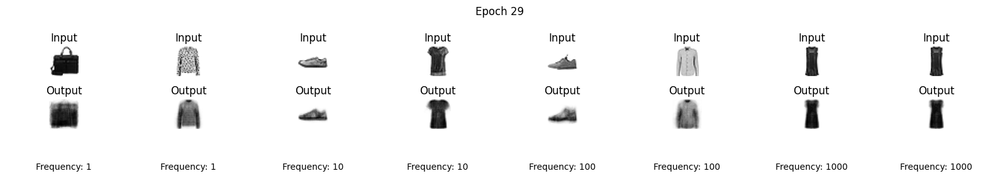

1/1 [==============================] - 0s 23ms/step


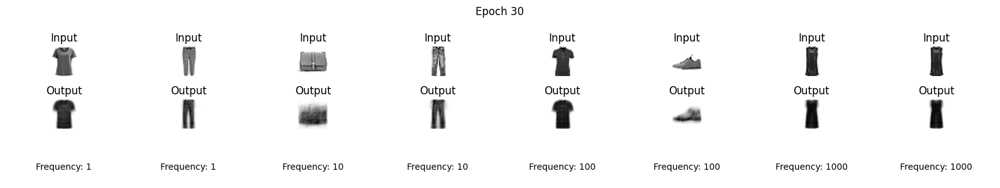

1/1 [==============================] - 0s 27ms/step


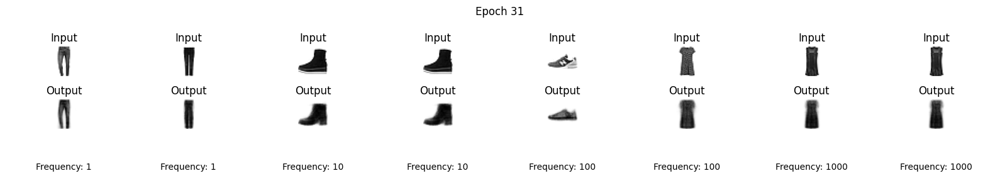

1/1 [==============================] - 0s 23ms/step


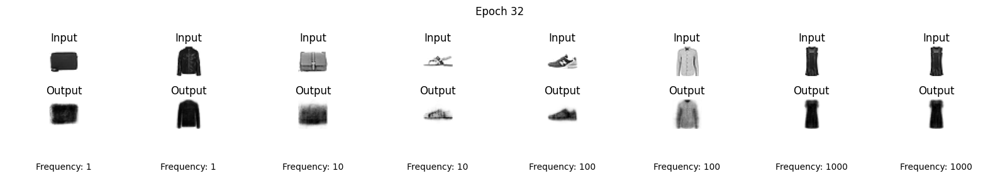

1/1 [==============================] - 0s 35ms/step


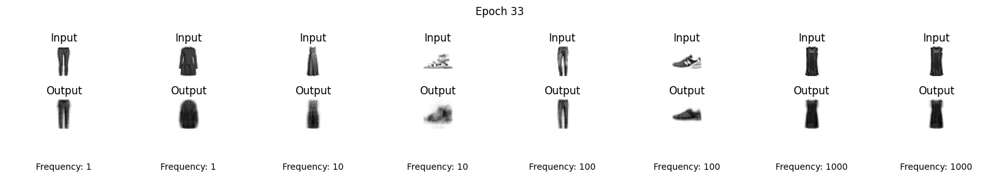

1/1 [==============================] - 0s 23ms/step


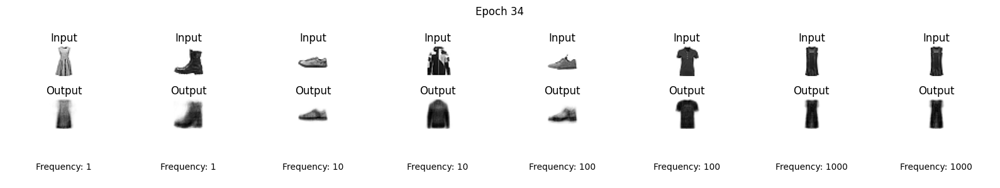

1/1 [==============================] - 0s 21ms/step


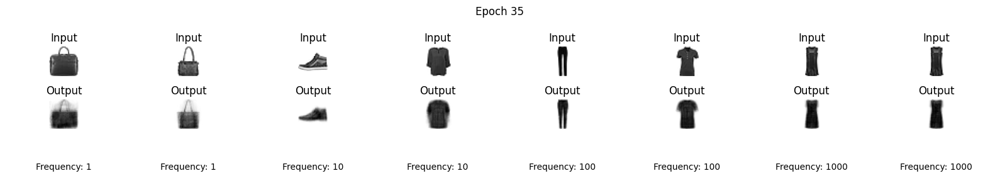

1/1 [==============================] - 0s 21ms/step


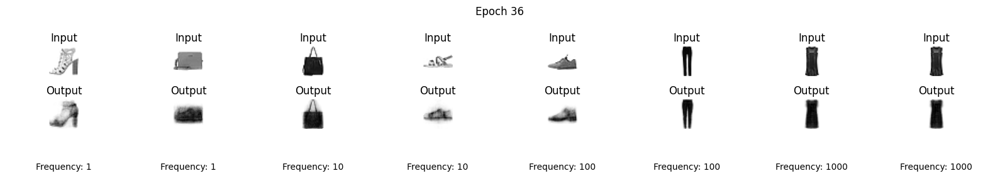

1/1 [==============================] - 0s 38ms/step


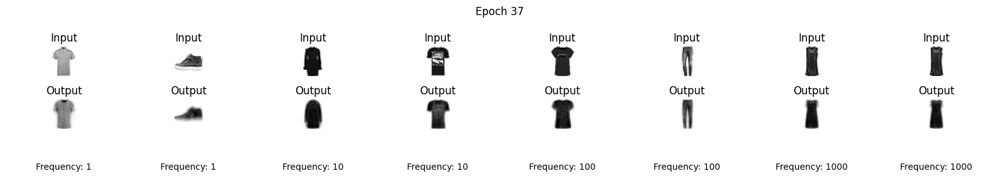

1/1 [==============================] - 0s 26ms/step


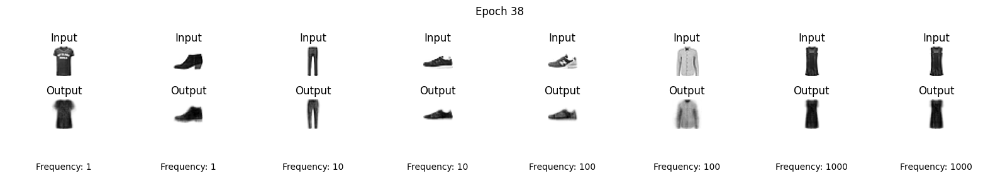

1/1 [==============================] - 0s 22ms/step


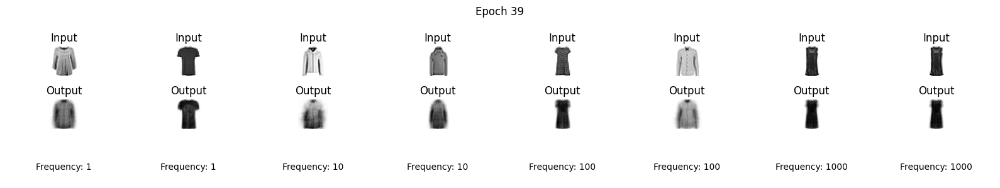

1/1 [==============================] - 0s 30ms/step


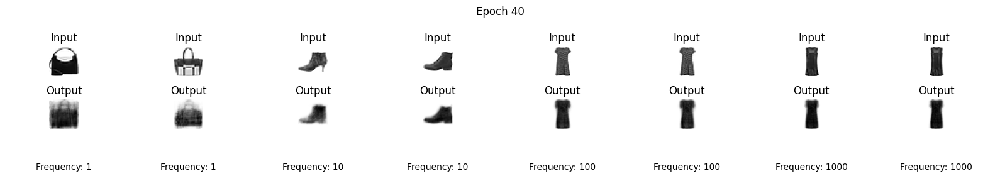

1/1 [==============================] - 0s 38ms/step


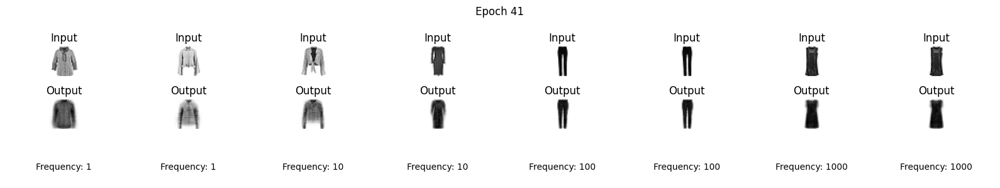

1/1 [==============================] - 0s 31ms/step


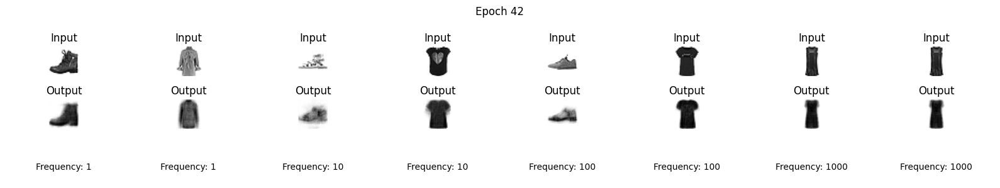

1/1 [==============================] - 0s 23ms/step


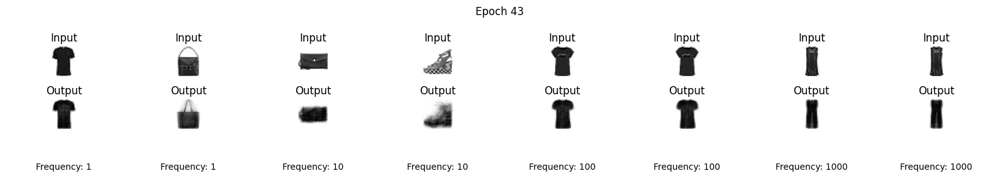

1/1 [==============================] - 0s 28ms/step


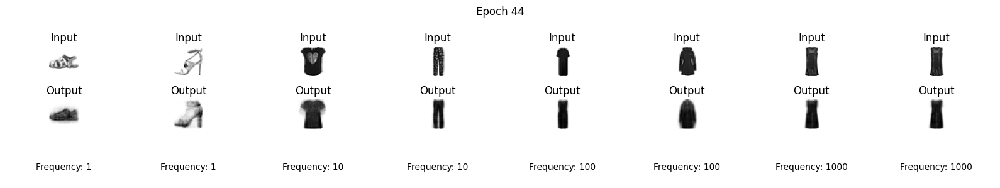

1/1 [==============================] - 0s 34ms/step


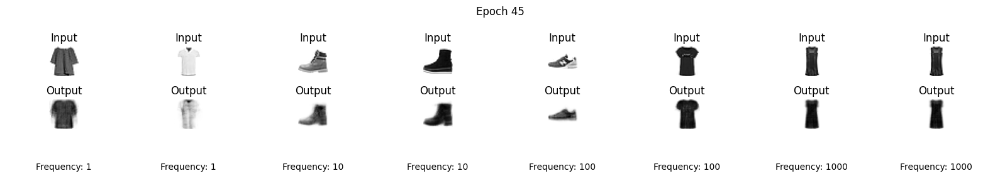

1/1 [==============================] - 0s 23ms/step


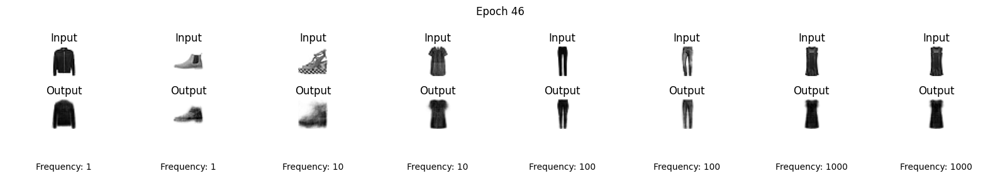

1/1 [==============================] - 0s 31ms/step


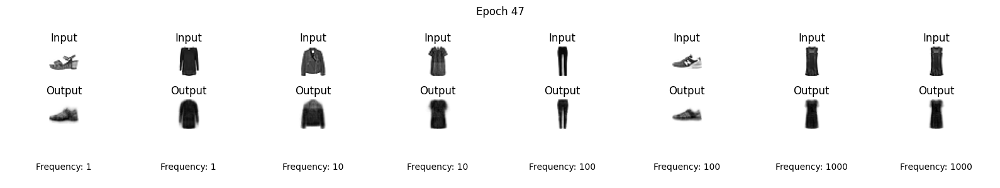

1/1 [==============================] - 0s 28ms/step


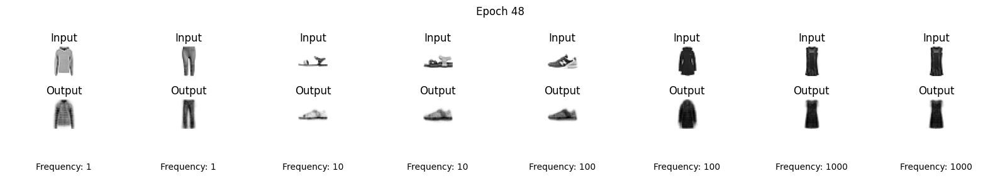

1/1 [==============================] - 0s 38ms/step


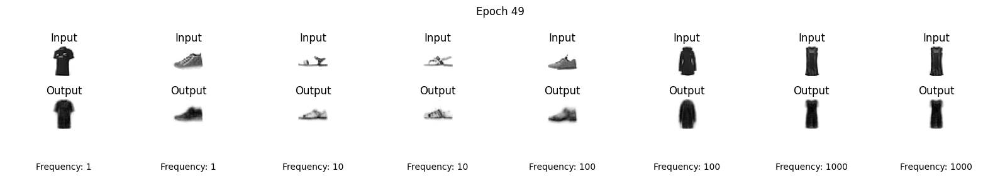

1/1 [==============================] - 0s 23ms/step


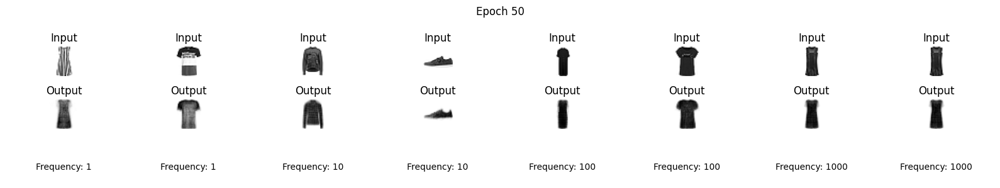

In [ ]:
EPOCHS = 50
EXAMPLES = 8

image_id = list(np.random.choice(range(10000), 1111, replace=False))

# Create a frequency dictionary
freq_dict = {img: 1000 for img in image_id[0:1]}
freq_dict.update({img: 100 for img in image_id[1:11]})
freq_dict.update({img: 10 for img in image_id[11:111]})
freq_dict.update({img: 1 for img in image_id[111:1111]})

# Separate image_ids based on their frequencies
image_ids_freq_1 = [image_id for image_id in image_id[111:1111]]
image_ids_freq_10 = [image_id for image_id in image_id[11:111]]
image_ids_freq_100 = [image_id for image_id in image_id[1:11]]
image_ids_freq_1000 = [image_id for image_id in image_id[0:1]]

# Create separate training sets for each frequency group
freq_train_1 = x_train[np.array([img for img in image_ids_freq_1])]
freq_train_10 = x_train[np.array([img for img in image_ids_freq_10])]
freq_train_100 = x_train[np.array([img for img in image_ids_freq_100])]
freq_train_1000 = x_train[np.array([img for img in image_ids_freq_1000])]

for epoch in range(EPOCHS):
    fig, axs = plt.subplots(3, EXAMPLES, figsize=(EXAMPLES * 2, 3))  # Change to 3 rows

    # Pick 2 random images from each frequency group
    rand_ids = np.concatenate([
        np.random.choice(image_ids_freq_1, 2),
        np.random.choice(image_ids_freq_10, 2),
        np.random.choice(image_ids_freq_100, 2),
        np.random.choice(image_ids_freq_1000, 2)
    ])

    rand = x_test[rand_ids].reshape((EXAMPLES, 1, 28, 28))

    for j in range(EXAMPLES):
        # Get the image ID and the frequency of the image from the dictionary
        image_id = rand_ids[j]
        freq = freq_dict[image_id]

        axs[0, j].imshow(rand[j][0], cmap="gray_r")
        axs[0,j].set_title("Input")
        axs[0,j].axis("off")

        axs[1, j].imshow(model.predict(rand[j])[0], cmap="gray_r")
        axs[1,j].set_title("Output")
        axs[1,j].axis("off")

        # Display the frequency
        axs[2, j].text(0.5, 0.5, f"Frequency: {freq}", ha='center', va='center')
        axs[2,j].axis("off")

    fig.suptitle("Epoch %d" % (epoch+1))
    fig.tight_layout()
    plt.show()

    # Train the model separately on each frequency group
    model.fit(freq_train_1, freq_train_1, verbose=0)
    model.fit(freq_train_10, freq_train_10, verbose=0)
    model.fit(freq_train_100, freq_train_100, verbose=0)
    model.fit(freq_train_1000, freq_train_1000, verbose=0)